In [ ]:
import torch
from utils import plot_convergence, analyze_experiment_results, analyze_spikes, analyze_membrane, plot_membrane_one_per_class, analyze_spike_counts_from_file, analyze_weights, plot_topk_accuracy_bar,compute_inference_firing_rates, analyze_topk_experiment_results
from experiments import run_param_experiment, run_loss_experiment, run_model_experiment, run_confusion_matrix_experiment, run_validation, run_alpha_experiment, run_alpha_beta_grid_experiment, run_sparsity_experiment, run_fanin_experiment
# ---- Paths (edit as needed)
MAT_PATH = "smarthand_dataset.mat"
RANK_CSV = "res95_ranked_taxels.csv"   # produced by your PCA+Pearson script
TOPN = 300
# Paths and constants
NUM_FRAMES_PER_SAMPLE = 50  # Chunk size
SAMPLING_FREQUENCY = 100.0  # 100 frames/sec = 100 Hz
FRAME_DURATION_MS = 1000.0 / SAMPLING_FREQUENCY  # 10 ms per frame
NUM_FRAMES = 1200  # number of time frames to encode each sample
THRESHOLD = 0.03  # threshold for delta modulation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


+1/-1 better \
0.3 beta better \
learn beta better \
more layers but smaller better \
add gaussian noise better \
ce loss + 0.1 * mse membrane loss better \

# DOUBLE CHANNEL EXPERIMENTS

## Loss experiment - ce_rate loss vs. ce_rate loss + mse_membrane loss

In [ ]:
# Run loss experiment with single layer
results_loss_single = run_loss_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_hand_n_None_num_frames_50_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl",
    output_name="loss_comparison_channels_2"
)

Available keys in experiments/loss_comparison_channels_2.npz: ['ce_count', 'ce_max_membrane', 'ce_rate', 'ce_temporal', 'mse_count', 'mse_max_membrane', 'mse_temporal', 'ce_rate_mse_membrane']
ce_count (Accuracy) -> last train: 0.9866, last test: 0.4446
ce_max_membrane (Accuracy) -> last train: 0.8856, last test: 0.3729
ce_rate (Accuracy) -> last train: 0.9850, last test: 0.5057
ce_temporal (Accuracy) -> last train: 0.7699, last test: 0.2484
mse_count (Accuracy) -> last train: 0.9956, last test: 0.4993
mse_max_membrane (Accuracy) -> last train: 0.9529, last test: 0.3636
mse_temporal (Accuracy) -> last train: 0.0588, last test: 0.0588
ce_rate_mse_membrane (Accuracy) -> last train: 0.9839, last test: 0.5469


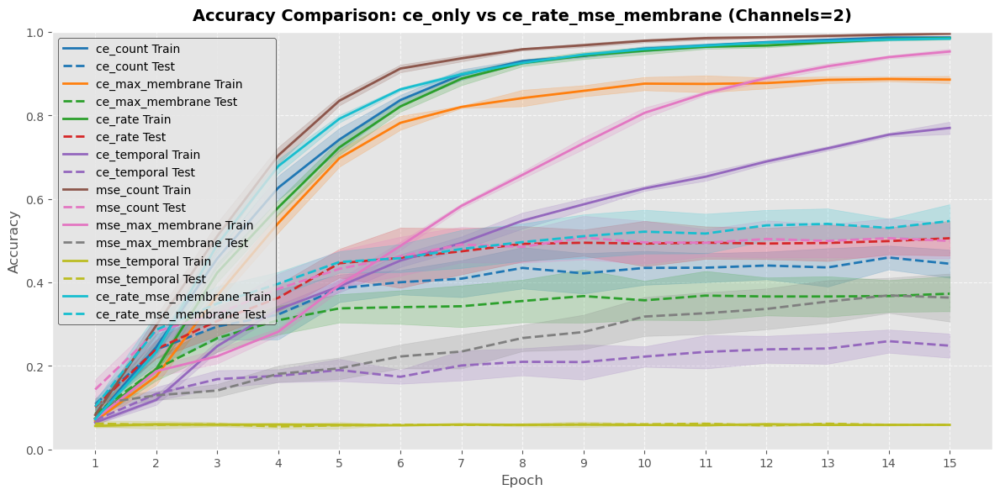

In [7]:
plot_convergence(
    file_path="experiments/loss_comparison_channels_2.npz",
    save_path="figures/plot_loss_comparison_channels_2.png",
    plt_title="Accuracy Comparison: ce_only vs ce_rate_mse_membrane (Channels=2)",
    plot_std=True,
    include_keys=None,
    metric="acc"
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/loss_comparison_channels_2.npz",
)  

Available keys in experiments/loss_comparison_channels_2.npz: ['ce_count', 'ce_max_membrane', 'ce_rate', 'ce_temporal', 'mse_count', 'mse_max_membrane', 'mse_temporal', 'ce_rate_mse_membrane']

Experiment Results Table:
          Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
            ce_count             0.988235            0.503268                0.986629               0.444608
     ce_max_membrane             0.899160            0.444444                0.885649               0.372876
             ce_rate             0.989916            0.575163                0.984995               0.505719
         ce_temporal             0.794118            0.294118                0.769916               0.248366
           mse_count             0.998366            0.568627                0.995640               0.499346
    mse_max_membrane             0.959664            0.450980                0.952932               0.363562
        mse_tempo

,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,ce_count,0.988235,0.503268,0.986629,0.444608
1,ce_max_membrane,0.899160,0.444444,0.885649,0.372876
2,ce_rate,0.989916,0.575163,0.984995,0.505719
3,ce_temporal,0.794118,0.294118,0.769916,0.248366
4,mse_count,0.998366,0.568627,0.995640,0.499346
5,mse_max_membrane,0.959664,0.450980,0.952932,0.363562
6,mse_temporal,0.065546,0.073529,0.058824,0.058824
7,ce_rate_mse_membrane,0.986928,0.594771,0.983940,0.546895


In [2]:
# Run loss experiment with single layer
results_loss_single = run_loss_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_hand_n_None_num_frames_50_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl",
    output_name="loss_comparison_channels_2_combined",
    loss_list=['ce_rate', 'ce_rate_mse_membrane', 'ce_rate_mse_count']
)

Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_50_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 50, 'threshold': 0.03, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 2: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 3: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 4: CV Train samples = 595, CV Test samples = 153
  - CV Tr

Available keys in experiments/loss_comparison_channels_2_combined.npz: ['ce_rate', 'ce_rate_mse_membrane', 'ce_rate_mse_count']
ce_rate (Accuracy) -> last train: 0.9846, last test: 0.5132
ce_rate_mse_membrane (Accuracy) -> last train: 0.9846, last test: 0.5425


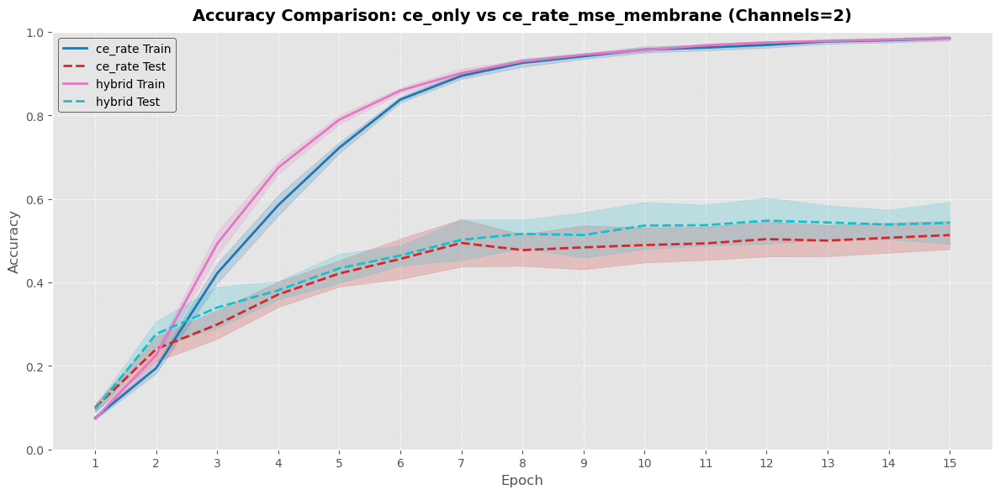

In [2]:
plot_convergence(
    file_path="experiments/loss_comparison_channels_2_combined.npz",
    save_path="figures/plot_loss_comparison_channels_2_combined.png",
    plt_title="Accuracy Comparison: ce_only vs ce_rate_mse_membrane (Channels=2)",
    plot_std=True,
    include_keys=['ce_rate', 'ce_rate_mse_membrane'],
    legend_labels=['ce_rate', 'hybrid'],
    metric="acc"
)

In [9]:
analyze_experiment_results(
    file_path="experiments/loss_comparison_channels_2_combined.npz",
)

Available keys in experiments/loss_comparison_channels_2_combined.npz: ['ce_rate', 'ce_rate_mse_membrane', 'ce_rate_mse_count']

Experiment Results Table:
          Model/Loss Best Train Accuracy [%] Best Test Accuracy [%] Average Train Accuracy [%] (mean ± std) Average Test Accuracy [%] (mean ± std)
             ce_rate                   99.16                  56.21                            98.46 ± 0.57                           51.32 ± 3.41
ce_rate_mse_membrane                   99.02                  61.44                            98.46 ± 0.34                           54.25 ± 5.05
   ce_rate_mse_count                   99.84                  56.21                            99.43 ± 0.29                           49.98 ± 4.45


,Model/Loss,Best Train Accuracy [%],Best Test Accuracy [%],Average Train Accuracy [%] (mean ± std),Average Test Accuracy [%] (mean ± std)
0,ce_rate,99.16,56.21,98.46 ± 0.57,51.32 ± 3.41
1,ce_rate_mse_membrane,99.02,61.44,98.46 ± 0.34,54.25 ± 5.05
2,ce_rate_mse_count,99.84,56.21,99.43 ± 0.29,49.98 ± 4.45


## Num frames experiment - threshold 0.03

In [ ]:
fixed_params = {"method": "hand", "n": None, "threshold": 0.03, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="num_frames",
    varying_values=[5, 10, 25, 50, 100],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for num_frames = 5 from preprocessed_data\spike_data_method_hand_n_None_num_frames_5_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_method_hand_n_None_num_frames_5_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 5, 'threshold': 0.03, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 

Available keys in experiments/param_num_frames_20260301_1709.npz: ['5', '10', '25', '50', '100']


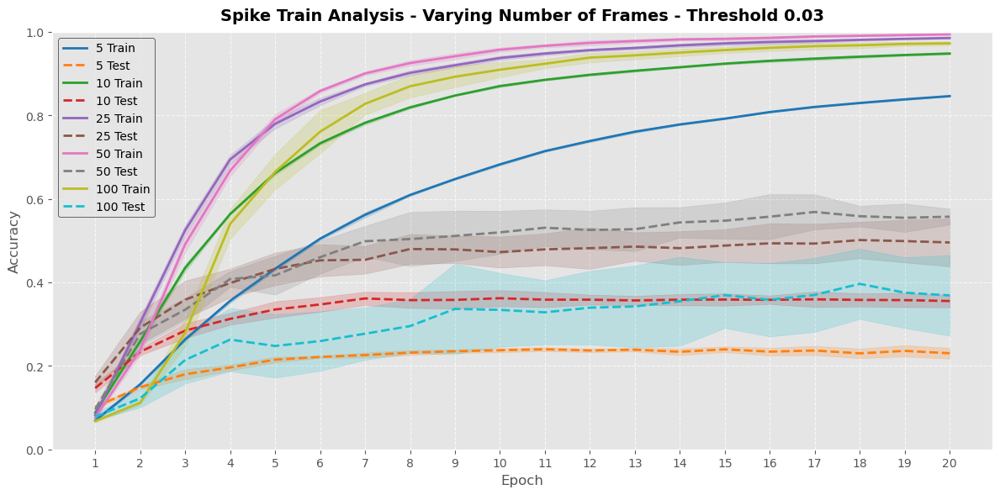

In [ ]:
plot_convergence(
    "experiments/param_num_frames_20260301_1709.npz",
    "figures/plot_num_frames.png",
    "Spike Train Analysis - Varying Number of Frames - Threshold 0.03",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    "experiments/param_num_frames_20260301_1709.npz",
)

Available keys in experiments/param_num_frames_20260301_1709.npz: ['5', '10', '25', '50', '100']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
         5             0.847426            0.253342                0.846056               0.230214
        10             0.950201            0.399733                0.948128               0.355348
        25             0.989076            0.560554                0.985300               0.495540
        50             0.995098            0.614379                0.993978               0.557353
       100             0.977124            0.500000                0.972472               0.368824


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,5,0.847426,0.253342,0.846056,0.230214
1,10,0.950201,0.399733,0.948128,0.355348
2,25,0.989076,0.560554,0.985300,0.495540
3,50,0.995098,0.614379,0.993978,0.557353
4,100,0.977124,0.500000,0.972472,0.368824


## Threshold experiment - Num frames 50


In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 50, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02, 0.03],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_method_hand_n_None_num_frames_50_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_method_hand_n_None_num_frames_50_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 50, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 2: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Te

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']


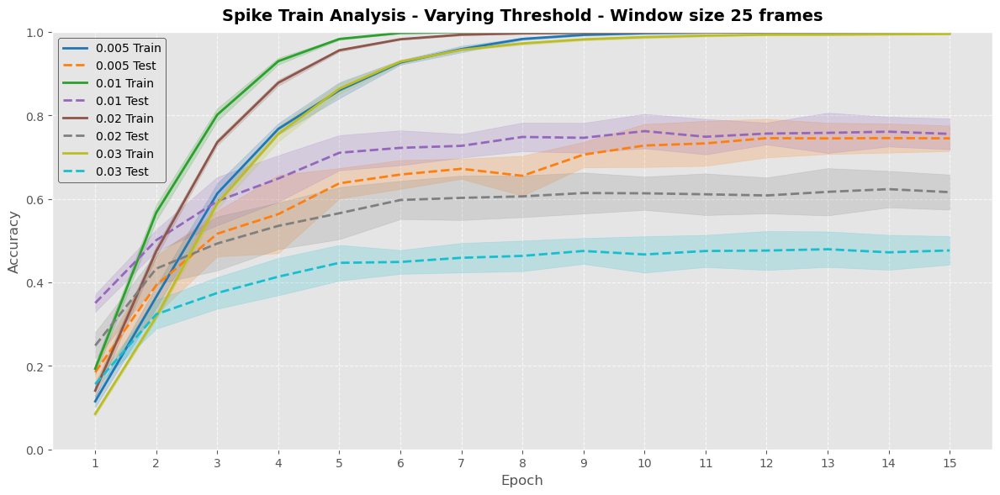

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251212_1016.npz",
    "figures/plot_threshold_50_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 50 frames",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    "experiments/param_threshold_20251212_1016.npz")

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             1.000000            0.802768                1.000000               0.744906
      0.01             1.000000            0.820261                1.000000               0.755632
      0.02             1.000000            0.695502                0.999501               0.616071
      0.03             0.996639            0.543253                0.994989               0.476509


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.005,1.000000,0.802768,1.000000,0.744906
1,0.01,1.000000,0.820261,1.000000,0.755632
2,0.02,1.000000,0.695502,0.999501,0.616071
3,0.03,0.996639,0.543253,0.994989,0.476509


## Threshold experiment - Num frames 25

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02, 0.03],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']


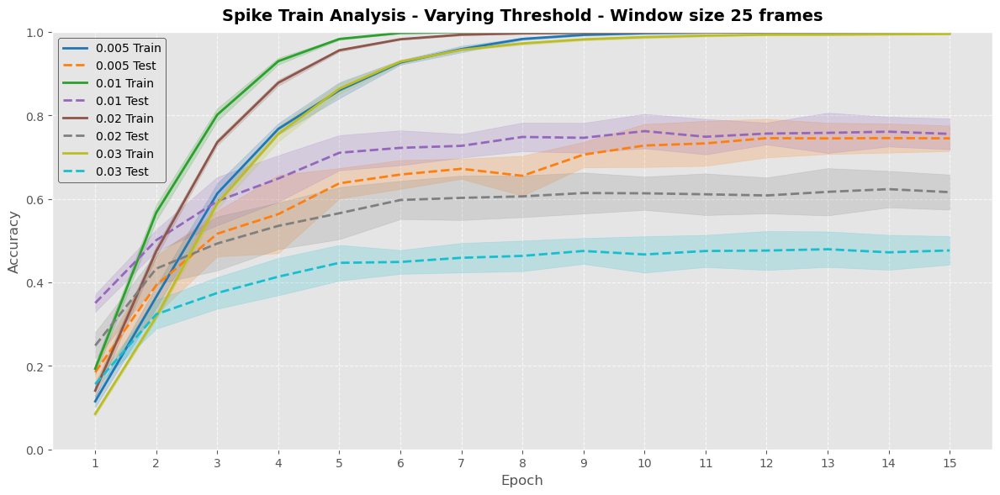

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251212_1016.npz",
    "figures/plot_threshold_25_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 25 frames",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    "experiments/param_threshold_20251212_1016.npz")

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             1.000000            0.802768                1.000000               0.744906
      0.01             1.000000            0.820261                1.000000               0.755632
      0.02             1.000000            0.695502                0.999501               0.616071
      0.03             0.996639            0.543253                0.994989               0.476509


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.005,1.000000,0.802768,1.000000,0.744906
1,0.01,1.000000,0.820261,1.000000,0.755632
2,0.02,1.000000,0.695502,0.999501,0.616071
3,0.03,0.996639,0.543253,0.994989,0.476509


## Threshold experiment - Num frames 10

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 10, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02, 0.03],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_method_hand_n_None_num_frames_10_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_method_hand_n_None_num_frames_10_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 10, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176]
  - CV Test class distribution: [44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44]
Fold 2: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 176 176 176 176 176 1

Available keys in experiments/param_threshold_20260301_2040.npz: ['0.005', '0.01', '0.02', '0.03']


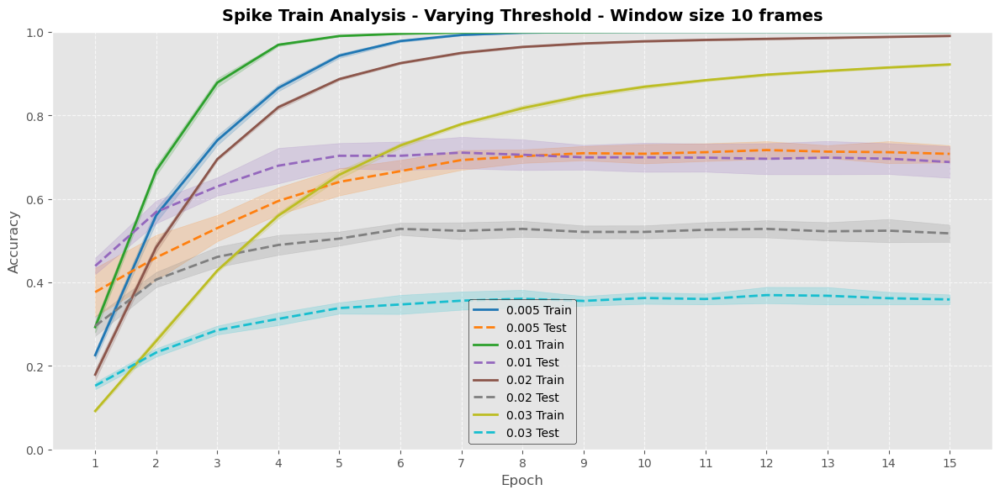

In [ ]:
plot_convergence(
    "experiments/param_threshold_20260301_2040.npz",
    "figures/plot_threshold_10_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 10 frames",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    "experiments/param_threshold_20260301_2040.npz")

Available keys in experiments/param_threshold_20260301_2040.npz: ['0.005', '0.01', '0.02', '0.03']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             1.000000            0.739305                1.000000               0.707754
      0.01             1.000000            0.762032                1.000000               0.688235
      0.02             0.992313            0.557487                0.990174               0.517380
      0.03             0.927139            0.406417                0.921992               0.359091


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.005,1.000000,0.739305,1.000000,0.707754
1,0.01,1.000000,0.762032,1.000000,0.688235
2,0.02,0.992313,0.557487,0.990174,0.517380
3,0.03,0.927139,0.406417,0.921992,0.359091


## Threshold experiment - Num frames 5

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 5, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02, 0.03],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_method_hand_n_None_num_frames_5_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_method_hand_n_None_num_frames_5_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 5, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 35

Available keys in experiments/param_threshold_20260301_2117.npz: ['0.005', '0.01', '0.02', '0.03']


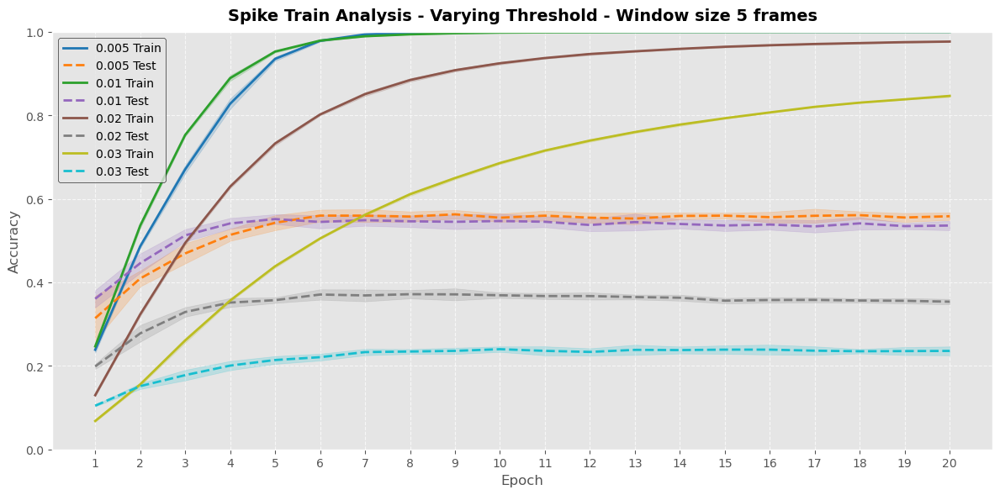

In [ ]:
plot_convergence(
    "experiments/param_threshold_20260301_2117.npz",
    "figures/plot_threshold_5_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 5 frames",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    "experiments/param_threshold_20260301_2117.npz")

Available keys in experiments/param_threshold_20260301_2117.npz: ['0.005', '0.01', '0.02', '0.03']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             1.000000            0.583556                1.000000               0.558422
      0.01             1.000000            0.574198                0.999866               0.536096
      0.02             0.978443            0.393048                0.976705               0.353743
      0.03             0.850602            0.255348                0.846557               0.235829


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.005,1.000000,0.583556,1.000000,0.558422
1,0.01,1.000000,0.574198,0.999866,0.536096
2,0.02,0.978443,0.393048,0.976705,0.353743
3,0.03,0.850602,0.255348,0.846557,0.235829


## TOPN experiment - Num frames 25, threshold 0.01

In [ ]:
fixed_params = {"method": "topn", "num_frames": 5, "session_id": [0, 1], "channels": 2, "down_spike": -1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[200, 250, 300, 350],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for topn = 200 from preprocessed_data\spike_data_topn_200_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_200_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_topn_20251212_1224.npz: ['200', '250', '300', '350']


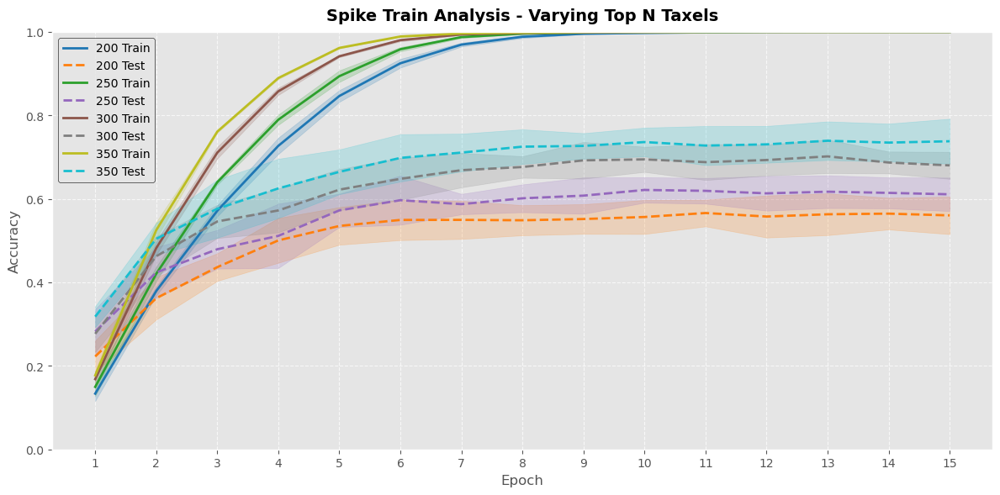

In [ ]:
plot_convergence(
    "experiments/param_topn_20251212_1224.npz",
    "figures/plot_topn.png",
    "Spike Train Analysis - Varying Top N Taxels",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_topn_20251212_1224.npz",
    save_path="experiments/analysis_topn.txt"
)

TypeError: analyze_experiment_results() got an unexpected keyword argument 'save_path'

## Confusion Matrix

In [ ]:
results =run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=10,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_session_id_0_1.pkl",
    alpha=0.7,
    beta=0.7,
)

Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18

## Validation for best hyperparameters

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "session_id": [0, 1]}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=2,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    alpha=0.7,
    beta=0.7,
    lr=0.001
)


######################################################################
Starting final training from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8131, Avg Train Accuracy: 19.45%
Epoch 1 - Avg Val Loss: 2.7096, Avg Val Accuracy: 36.76%
Epoch 2 - Avg Train Loss: 2.5853, Avg Train Accuracy: 56.68%
Epoch 2 - Avg Val Loss: 2.6640, Avg Val Accuracy: 47.06%
Epoch 3 - Avg Train Loss: 2.4052, Avg Train Accuracy: 82.89%
Epoch 3 - Avg Val Loss: 2.5594, Avg V

## Validation for TOPN = 300

In [ ]:
fixed_params = {"method": "topn", "n": 300, "num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "session_id": [0, 1]}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=2,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001
)


######################################################################
Starting final training from preprocessed_data\spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8147, Avg Train Accuracy: 18.05%
Epoch 1 - Avg Val Loss: 2.7457, Avg Val Accuracy: 38.24%
Epoch 2 - Avg Train Loss: 2.6236, Avg Train Accuracy: 50.80%
Epoch 2 - Avg Val Loss: 2.6254, Avg Val Accuracy: 50.74%
Epoch 3 - Avg Train Loss: 2.4713, Avg Train Accuracy: 74.80%
Epoch 3 - Avg Val Loss: 2.6270, Avg Val 

# SINGLE CHANNEL EXPERIMENTS

## PALM PIXELS (484)


### Reduce DOWN spike intensity Experiment

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 2, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[-0.1, -0.2, -0.5, -1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for down_spike = 2.0 from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_2_down_spike_2.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_2_down_spike_2.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': 2.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 7

KeyboardInterrupt: 

Available keys in experiments/param_down_spike_20260302_1028.npz: ['-0.1', '-0.2', '-0.5', '-1.0']


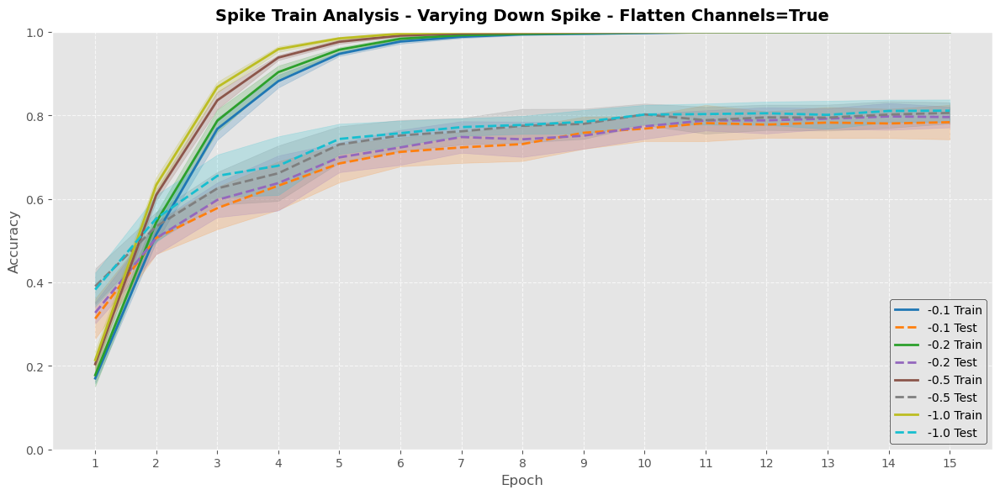

In [ ]:
plot_convergence(
    "experiments/param_down_spike_20260302_1028.npz",
    "figures/plot_down_spike_channel_2_test_1.png",
    "Spike Train Analysis - Varying Down Spike - Flatten Channels=True",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20260302_1028.npz",
)

Available keys in experiments/param_down_spike_20260302_1028.npz: ['-0.1', '-0.2', '-0.5', '-1.0']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
      -0.1                  1.0            0.830065                0.999666               0.783622
      -0.2                  1.0            0.839869                1.000000               0.795886
      -0.5                  1.0            0.833333                1.000000               0.805844
      -1.0                  1.0            0.846405                1.000000               0.811226


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,-0.1,1.0,0.830065,0.999666,0.783622
1,-0.2,1.0,0.839869,1.000000,0.795886
2,-0.5,1.0,0.833333,1.000000,0.805844
3,-1.0,1.0,0.846405,1.000000,0.811226


### Positive DOWN spike Experiment

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 2, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[0.5, 1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for down_spike = 0.5 from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_2_down_spike_0.5_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_2_down_spike_0.5_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': 0.5, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 7

Available keys in experiments/param_down_spike_20260302_1112.npz: ['0.5', '1.0']


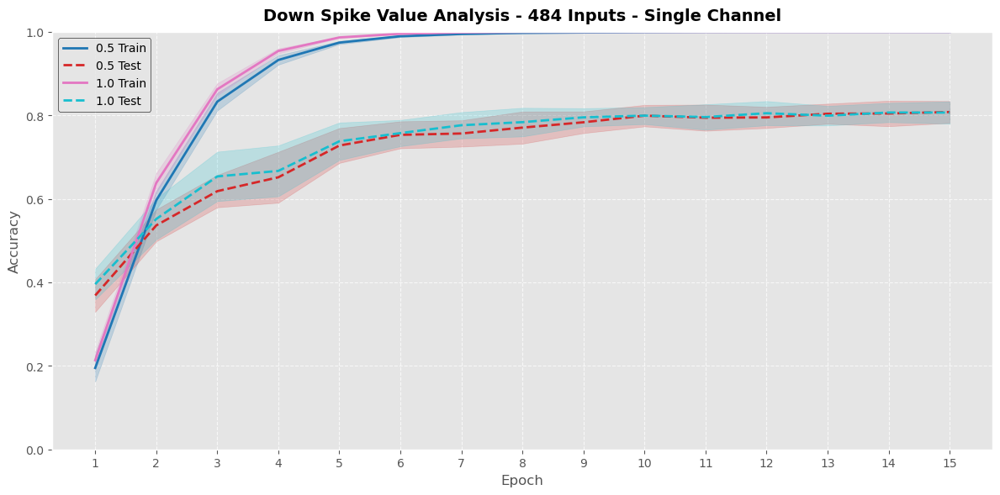

In [ ]:
plot_convergence(
    "experiments/param_down_spike_20260302_1112.npz",
    "figures/plot_down_spike_channel_2_test_2.png",
    "Down Spike Value Analysis - 484 Inputs - Single Channel",
    plot_std=True,
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20260302_1112.npz",
)

Available keys in experiments/param_down_spike_20260302_1112.npz: ['0.5', '1.0']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       0.5                  1.0            0.846405                     1.0               0.807997
       1.0                  1.0            0.839869                     1.0               0.806690


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.5,1.0,0.846405,1.0,0.807997
1,1.0,1.0,0.839869,1.0,0.806690


### Test positive DOWN spike on single channel Experiment

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[-1.0, 1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for down_spike = -1.0 from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_down_spike_20260302_1147.npz: ['-1.0', '1.0']


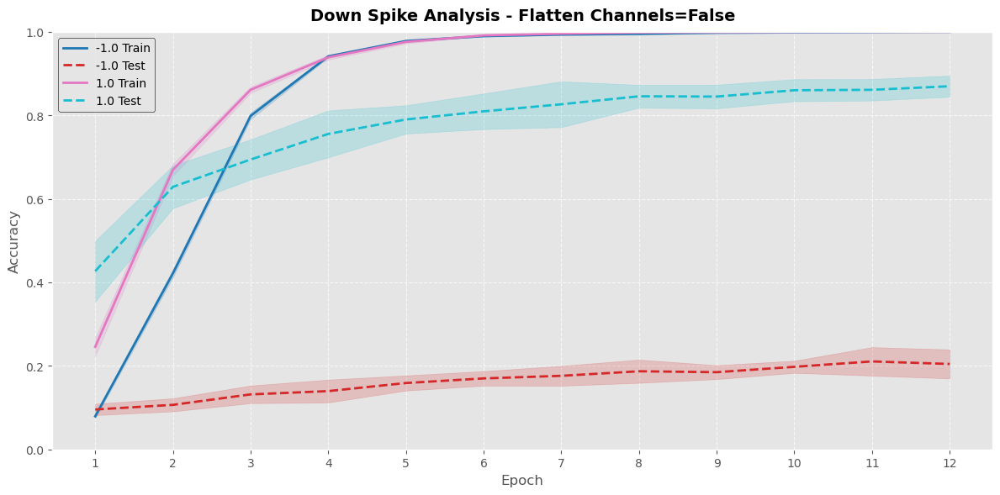

In [ ]:
plot_convergence(
    "experiments/param_down_spike_20260302_1147.npz",
    "figures/plot_down_spike_channel_1.png",
    "Down Spike Analysis - Flatten Channels=False",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20260302_1147.npz",
)

Available keys in experiments/param_down_spike_20260302_1147.npz: ['-1.0', '1.0']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
      -1.0                  1.0            0.254902                     1.0               0.204537
       1.0                  1.0            0.895425                     1.0               0.869742


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,-1.0,1.0,0.254902,1.0,0.204537
1,1.0,1.0,0.895425,1.0,0.869742


### Num frames Experiment - DOWN spike +1.0

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="num_frames",
    varying_values=[25, 10, 5],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for num_frames = 25 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 7

Available keys in experiments/preprocessed_num_frames_20251030_1549.npz: ['5', '10', '25']


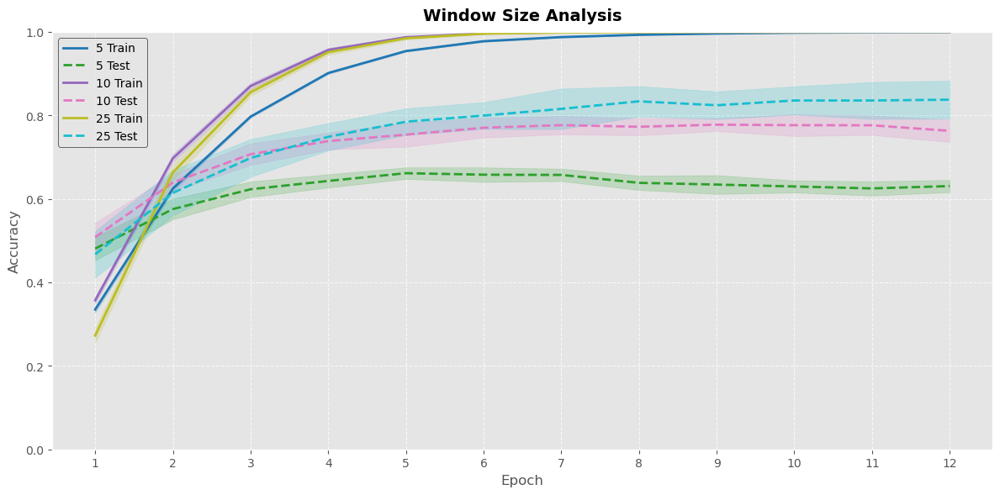

In [ ]:
plot_convergence(
    "experiments/param_num_frames_20251215_1220.npz",
    "figures/plot_num_frames_flatten_True.png",
    "Window Size Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_num_frames_20251215_1220.npz",
)

Available keys in experiments/preprocessed_num_frames_20251030_1549.npz: ['5', '10', '25']
Table saved to experiments/analysis_num_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
         5             0.999847            0.681283                0.999274               0.630615
        10             1.000000            0.819172                0.999962               0.762877
        25             1.000000            0.893048                1.000000               0.837567


### Threshold experiment - Num frames 25

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "channels": 1, "down_spike": 1.0, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251215_1235.npz: ['0.005', '0.01', '0.02']


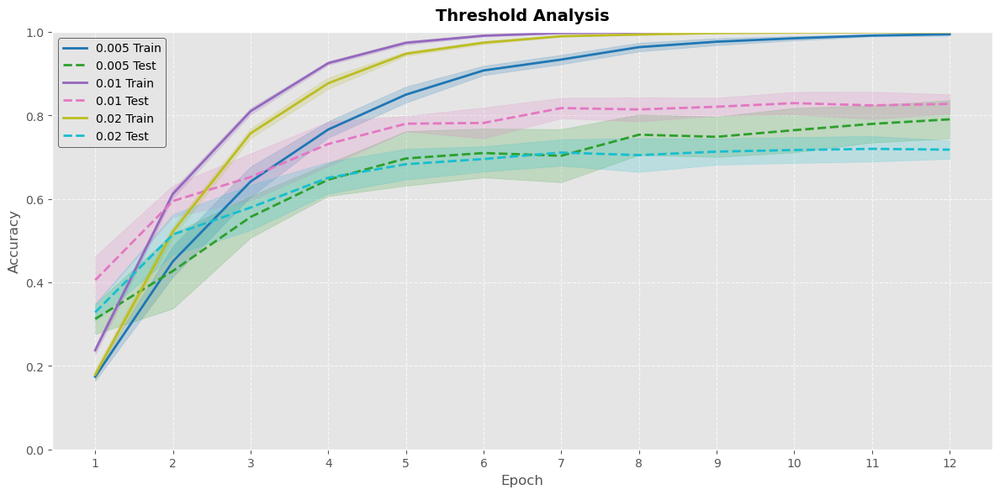

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251215_1235.npz",
    "figures/plot_threshold_25_frames_flatten_True.png",
    "Threshold Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1235.npz",
)

Available keys in experiments/preprocessed_threshold_20251022_1130.npz: ['0.005', '0.01', '0.02']
Table saved to experiments/analysis_threshold_25_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             0.987013            0.871658                0.977177               0.754011
      0.01             1.000000            0.903743                1.000000               0.848930
      0.02             1.000000            0.812834                0.999809               0.754011


### Threshold experiment - Num frames 10

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 10, "channels": 1, "down_spike": 1.0, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_10_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_10_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 10, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176]
  - CV Test class distribution: [44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44]
Fold 2: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 17

Available keys in experiments/param_threshold_20251215_1249.npz: ['0.005', '0.01', '0.02']


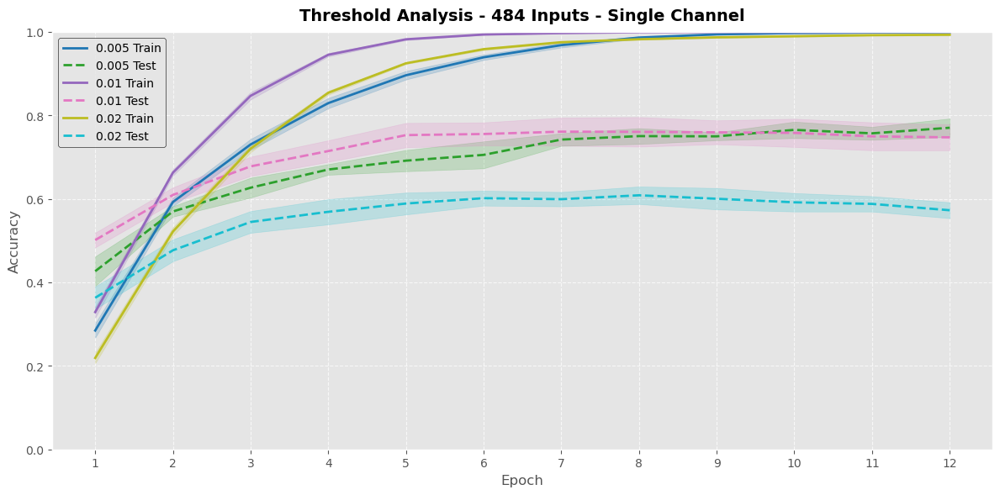

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251215_1249.npz",
    "figures/plot_threshold_10_frames_flatten_True.png",
    "Threshold Analysis - 484 Inputs - Single Channel",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1249.npz",
)

Available keys in experiments/param_threshold_20251215_1249.npz: ['0.005', '0.01', '0.02']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             0.999666            0.800802                0.999332               0.770321
      0.01             1.000000            0.812834                0.999933               0.747326
      0.02             0.995655            0.629679                0.993048               0.572727


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,0.005,0.999666,0.800802,0.999332,0.770321
1,0.01,1.000000,0.812834,0.999933,0.747326
2,0.02,0.995655,0.629679,0.993048,0.572727


### Threshold experiment - Num frames 5

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 5, "channels": 1, "down_spike": 1.0, "encoding": "spike", "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_5_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_5_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 5, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352

Available keys in experiments/param_threshold_20251215_1304.npz: ['0.005', '0.01', '0.02']


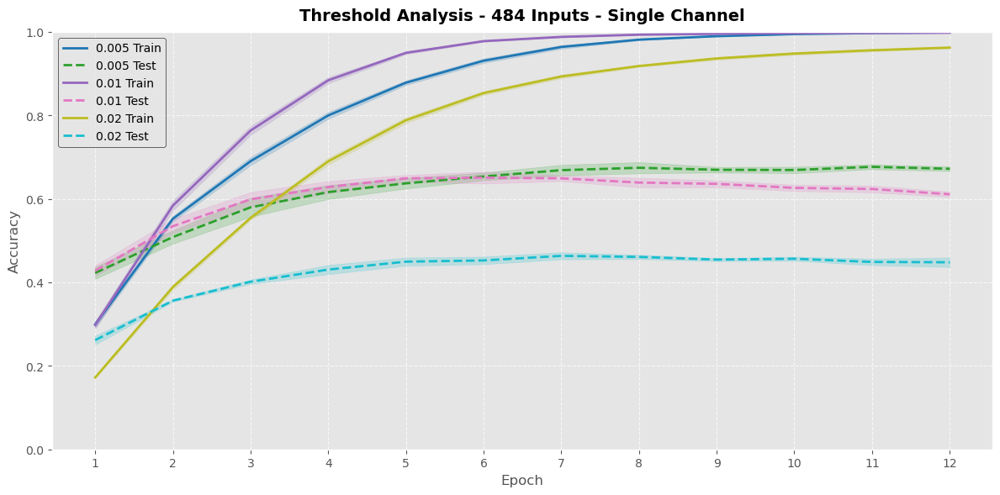

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251215_1304.npz",
    "experiments/plot_threshold_5_frames_flatten_True.png",
    "Threshold Analysis - 484 Inputs - Single Channel",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1304.npz",
)

Available keys in experiments/preprocessed_threshold_20251022_1809.npz: ['0.005', '0.01', '0.02']
Table saved to experiments/analysis_threshold_5_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             0.999666            0.713235                0.998864               0.695321
      0.01             0.999833            0.678476                0.999632               0.654278
      0.02             0.970755            0.499332                0.968817               0.440508


### Alpha experiment - Num frames 25

In [ ]:
results = run_alpha_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_experiment",
    alpha_values=[0.1, 0.3, 0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/alpha_experiment_20251215_1416.npz: ['0.1', '0.3', '0.5', '0.7', '0.9']


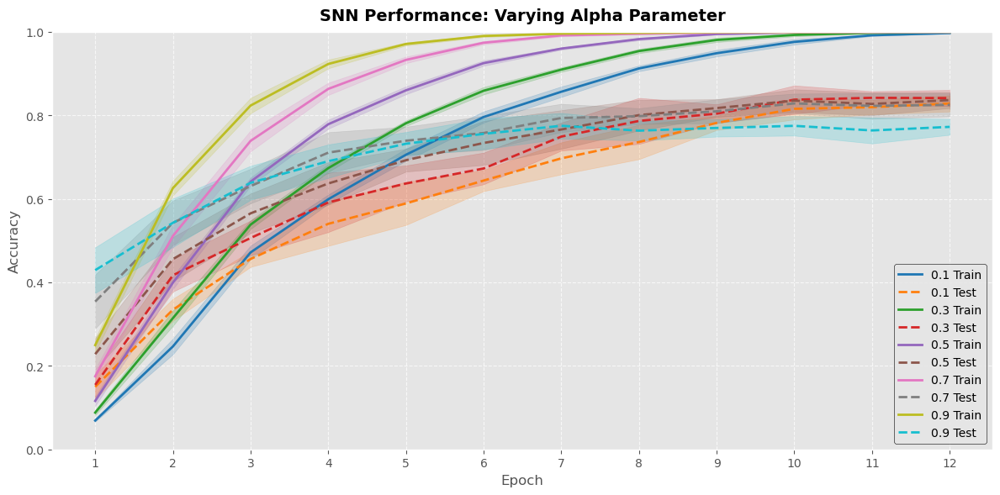

In [ ]:
plot_convergence(
    file_path="experiments/alpha_experiment_20251215_1416.npz",
    save_path="figures/alpha_convergence.png",
    plt_title="SNN Performance: Varying Alpha Parameter",
    plot_std=True,
    include_keys=["0.1", "0.3", "0.5", "0.7", "0.9"]
)

### Alpha beta grid search

In [ ]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    output_name="alpha_beta_25_frames",
    alpha_values=[0.7],
    beta_values=[0.7]
)

Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 4: CV 

### Validation best params

In [ ]:
fixed_params = {"method": "hand", "n": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "session_id": [0, 1]}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=25,
    batch_size=2,
    alpha=0.7,
    beta=0.7,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_hand_n_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'hand', 'n': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8352, Avg Train Accuracy: 20.32%
Epoch 1 - Avg Val Loss: 2.6130, Avg Val Accuracy: 39.71%
Epoch 2 - Avg Train Loss: 2.6947, Avg Train Accuracy: 56.89%
Epoch 2 - Avg Val Loss: 2.7274, Avg Val Accuracy: 52.21%
Epoch 3 - Avg Train Loss: 2.5956, Avg Train Accuracy: 84.09%
Epoch 3 - Avg Val Loss: 2.6068, Avg Val Accuracy: 58.09%
Epoch

### [0,1] Session vs All sessions

In [ ]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="session_id",
    varying_values=[[0, 1],[0,1,2,3,4]],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for session_id = [0, 1] from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 

Available keys in experiments/param_session_id_20251215_1514.npz: ['[0, 1]']


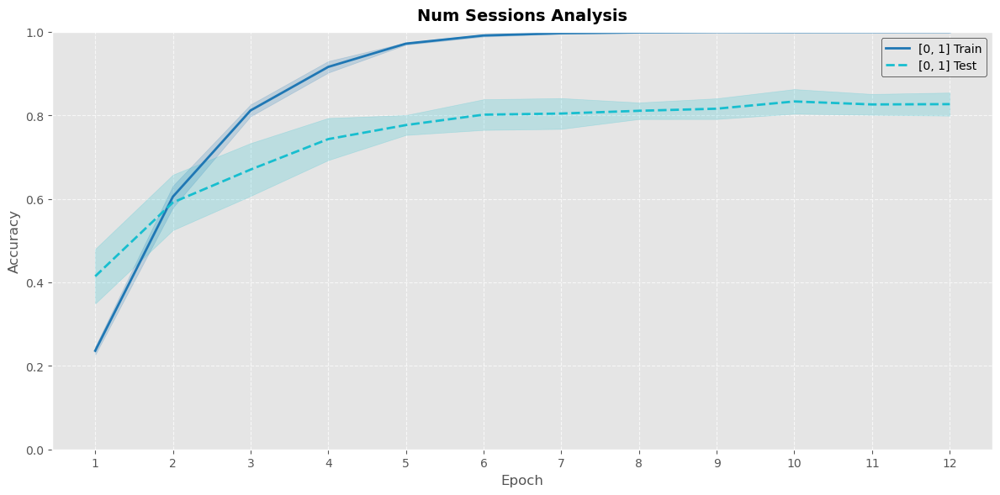

In [ ]:
plot_convergence(
    "experiments/param_session_id_20251215_1514.npz",
    "figures/plot_session_id_25_frames_flatten_True.png",
    "Num Sessions Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_session_id_20251215_1514.npz",
    save_path="experiments/analysis_session_id_25_frames_flatten_True.txt"
)

Available keys in experiments/preprocessed_session_id_20251028_1200.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']
Table saved to experiments/analysis_session_id_25_frames_flatten_True.txt

Experiment Results Table:
     Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
         [0, 1]                  1.0            0.882353                     1.0               0.831551
[0, 1, 2, 3, 4]                  1.0            0.859459                     1.0               0.800032


### Model experiment

In [ ]:
results = run_model_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="model_experiment_results"
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/model_experiment_results.npz: ['Synaptic', 'Synaptic_3', 'Synaptic_3_reduced']


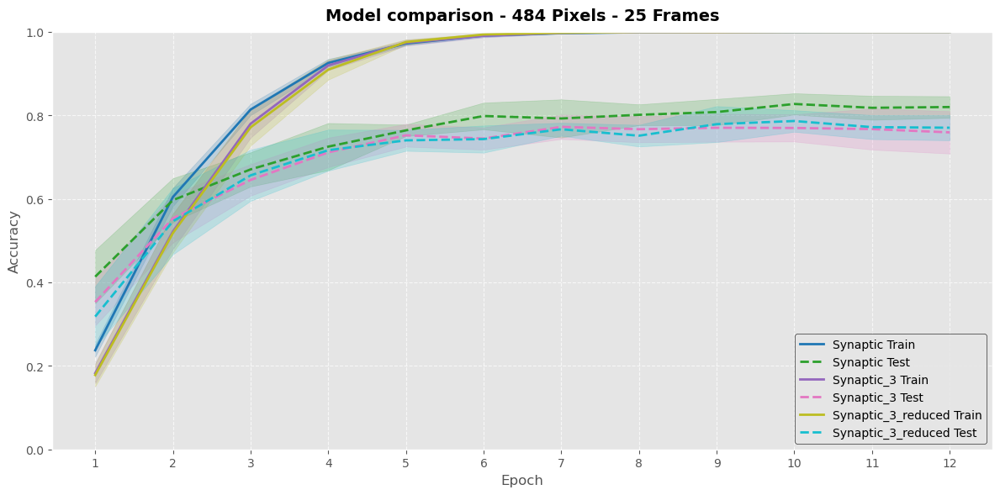

In [ ]:
plot_convergence(
    "experiments/model_experiment_results.npz",
    "figures/model_experiment_results.png",
    "Model comparison - 484 Pixels - 25 Frames",
    plot_std=True
)

### Encoding experiment - single channel

In [ ]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["raw", "hybrid", "spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True
)

Skipping missing file: preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_raw_rand_pixels_None_session_id_0_1.pkl
Skipping missing file: preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_hybrid_rand_pixels_None_session_id_0_1.pkl

######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1:

KeyboardInterrupt: 

In [ ]:
analysis = analyze_spike_counts_from_file(
    file_path="experiments/preprocessed_encoding_20251121_0959.npz",
    n=484,  # UP/DOWN neurons
    m=484   # Raw pressure neurons
)

For 'raw' encoding:
  Average spikes for raw neurons (last 484): 4576.78
For 'spike' encoding:
  Average spikes for spike neurons (first 484): 5698.64
For 'hybrid' encoding:
  Average spikes for spike neurons (first 484): 3471.32
  Average spikes for raw neurons (last 484): 2496.86


In [ ]:
analyze_spikes(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)


Spike Analysis – preprocessed_encoding_20251107_1512.npz
Varying values: ['raw', 'hybrid', 'spike']

--- raw ---
Total hidden spikes          : 697734.0
Spikes per fold (first 8)    : [13123.0, 16194.0, 15326.0, 20985.0, 15279.0, 11198.0, 17292.0, 10688.0] …
Hidden spikes array shape    : (1496, 25, 1452)
Avg spikes per test sample   : 466.40 ± 403.13
Avg firing rate per neuron   : 0.01285 ± 0.01106
---------------------------------------------

--- hybrid ---
Total hidden spikes          : 804960.0
Spikes per fold (first 8)    : [18201.0, 17855.0, 18243.0, 18243.0, 17644.0, 16692.0, 17636.0, 17073.0] …
Hidden spikes array shape    : (1496, 25, 2904)
Avg spikes per test sample   : 538.07 ± 128.63
Avg firing rate per neuron   : 0.00741 ± 0.02007
---------------------------------------------

--- spike ---
Total hidden spikes          : 855087.0
Spikes per fold (first 8)    : [22169.0, 21687.0, 21815.0, 21958.0, 21141.0, 20017.0, 21238.0, 20567.0] …
Hidden spikes array shape    : (1496,

In [ ]:
analyze_membrane(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)


=== MEMBRANE DIAGNOSTICS ===
encoding  max_mem (fold max)  mean_mem (fold avg) % mem > 0.5 max_mem / sample  spikes total
     raw              7.2136              -0.2057      17.55%            1.972   697734.0000
  hybrid             89.2796              -4.4650       2.43%           33.665   804960.0000
   spike            102.1031              -4.7072       3.88%           37.319   855087.0000

Interpretation:
  • If max_mem < 1.0 → NO SPIKES → NO LEARNING
  • Raw data typically shows max_mem ≈ 0.2–0.4
  • Spike-encoded data shows max_mem ≈ 1.5–3.0



Plotting raw: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [605 862 796]


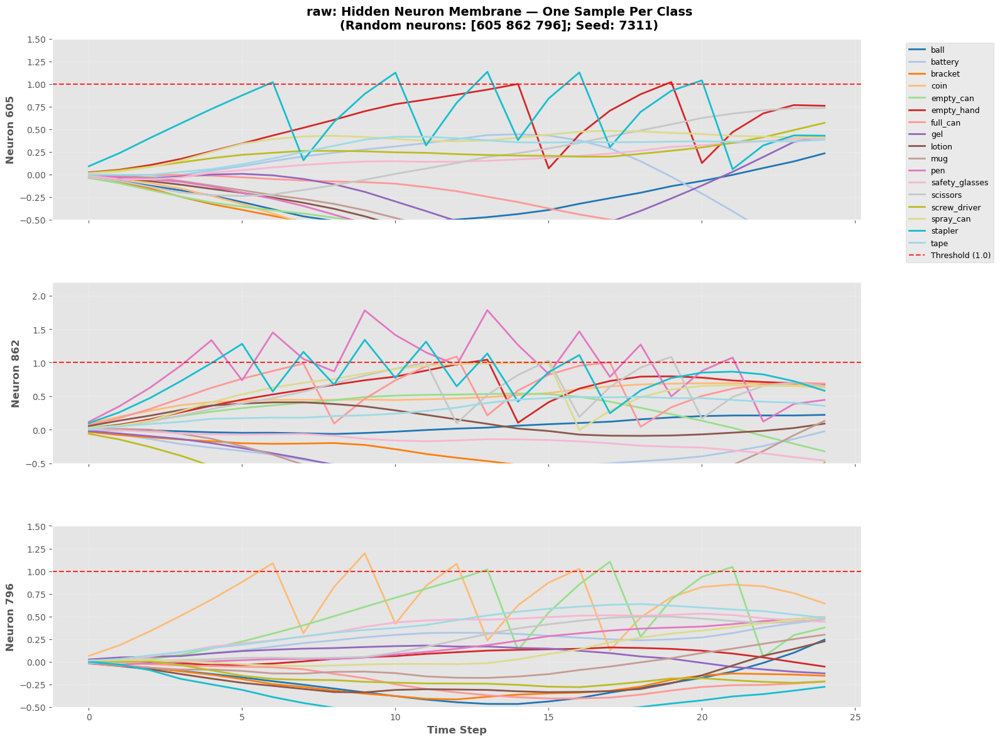


Plotting hybrid: 1496 samples, 25 time steps, 2904 hidden neurons
Selected neurons: [1963  268  348]


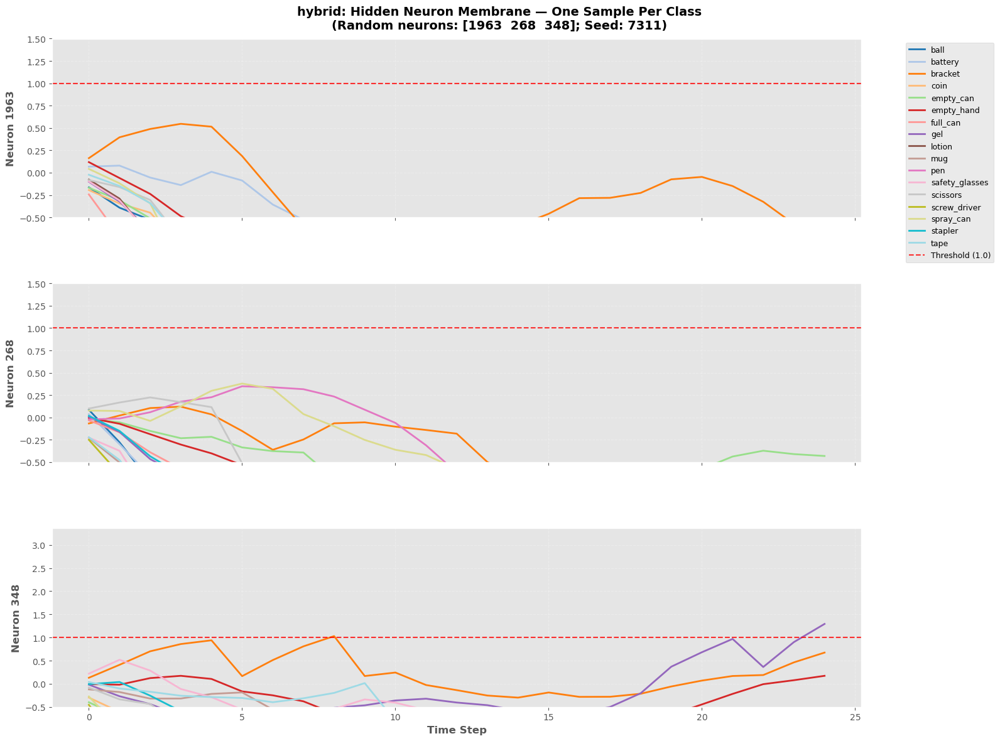


Plotting spike: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [1256  514 1395]


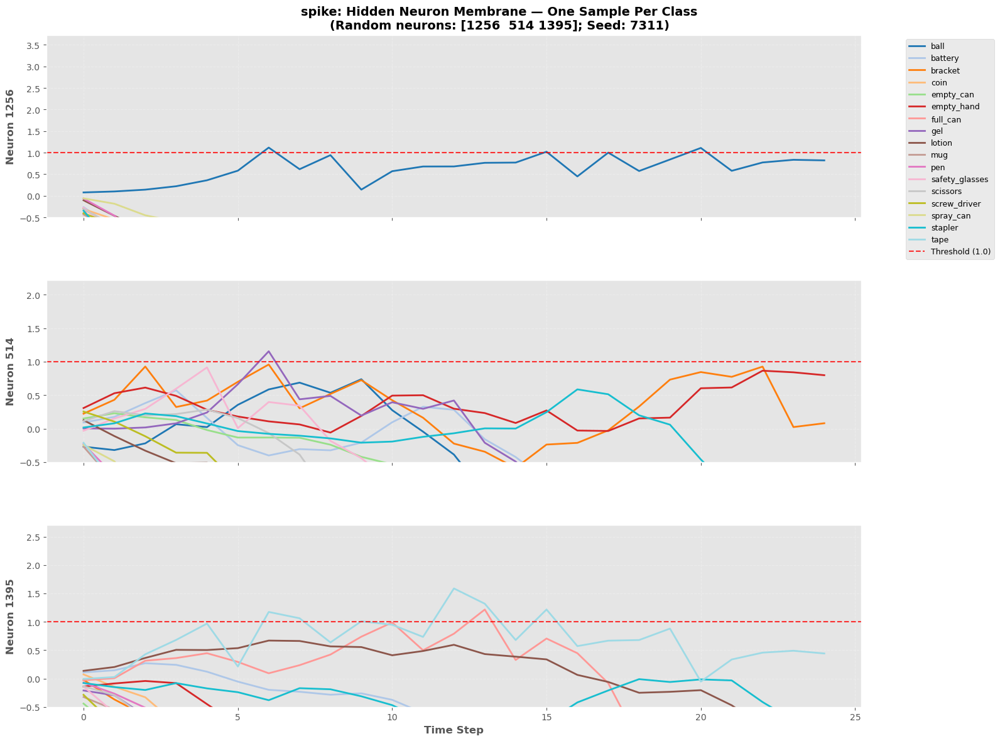

In [ ]:
plot_membrane_one_per_class(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)

Available keys in experiments/preprocessed_encoding_20251107_1512.npz: ['raw', 'hybrid', 'spike']


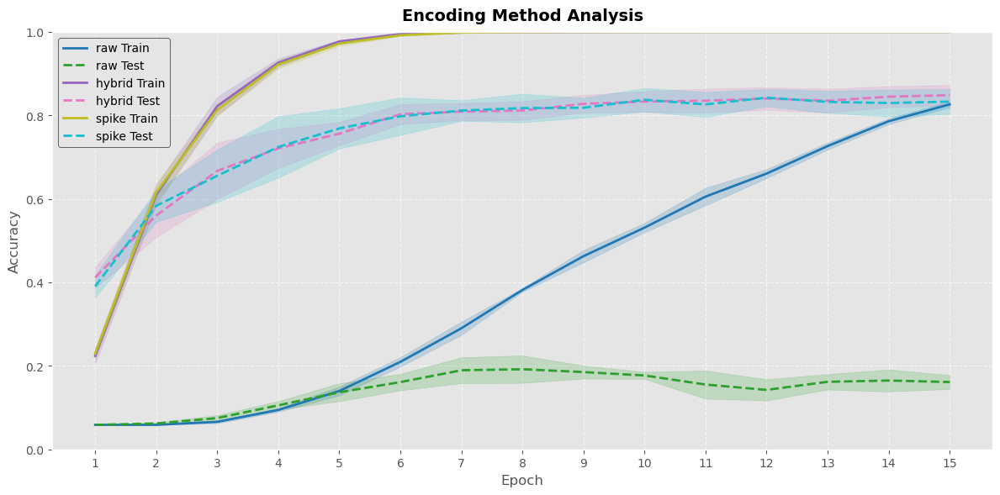

In [ ]:
plot_convergence(
    "experiments/preprocessed_encoding_20251107_1512.npz",
    "experiments/plot_encoding_flatten_True.png",
    "Encoding Method Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
    save_path="experiments/analysis_encoding_flatten_True_topn_200.txt"
)

Available keys in experiments/preprocessed_encoding_20251107_1512.npz: ['raw', 'hybrid', 'spike']
Table saved to experiments/analysis_encoding_flatten_True_topn_200.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       raw               0.8360              0.2457                  0.8263                 0.1613
    hybrid               1.0000              0.8791                  1.0000                 0.8483
     spike               1.0000              0.8693                  1.0000                 0.8329


### Encoding experiment - double channel

In [ ]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1], "flatten_channels": False, "down_spike": -1.0}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike", "hybrid", "raw"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_False_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_False_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'flatten_channels': False, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 7

In [ ]:
analyze_spikes(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)


Spike Analysis – preprocessed_encoding_20251107_1637.npz
Varying values: ['spike', 'hybrid', 'raw']

--- spike ---
Total hidden spikes          : 750204.0
Spikes per fold (first 8)    : [14823.0, 14828.0, 14778.0, 15707.0, 14920.0, 14112.0, 14803.0, 14003.0] …
Hidden spikes array shape    : (1496, 25, 2904)
Avg spikes per test sample   : 501.47 ± 110.76
Avg firing rate per neuron   : 0.00691 ± 0.02023
---------------------------------------------

--- hybrid ---
Total hidden spikes          : 713087.0
Spikes per fold (first 8)    : [16774.0, 16326.0, 16803.0, 17892.0, 16861.0, 16223.0, 16242.0, 15446.0] …
Hidden spikes array shape    : (1496, 25, 4356)
Avg spikes per test sample   : 476.66 ± 118.55
Avg firing rate per neuron   : 0.00438 ± 0.01557
---------------------------------------------

--- raw ---
Total hidden spikes          : 688323.0
Spikes per fold (first 8)    : [12389.0, 15674.0, 14705.0, 20116.0, 14729.0, 10633.0, 16662.0, 10223.0] …
Hidden spikes array shape    : (1496,

In [ ]:
analyze_membrane(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)


=== MEMBRANE DIAGNOSTICS ===
encoding  max_mem (fold max)  mean_mem (fold avg) % mem > 0.5 max_mem / sample  spikes total
   spike             82.3377              -4.2340       2.49%           31.230   750204.0000
  hybrid             67.3334              -4.4496       1.92%           31.149   713087.0000
     raw              7.1420              -0.2029      18.17%            2.003   688323.0000

Interpretation:
  • If max_mem < 1.0 → NO SPIKES → NO LEARNING
  • Raw data typically shows max_mem ≈ 0.2–0.4
  • Spike-encoded data shows max_mem ≈ 1.5–3.0



Plotting spike: 1496 samples, 25 time steps, 2904 hidden neurons
Selected neurons: [2442 2543 1258]


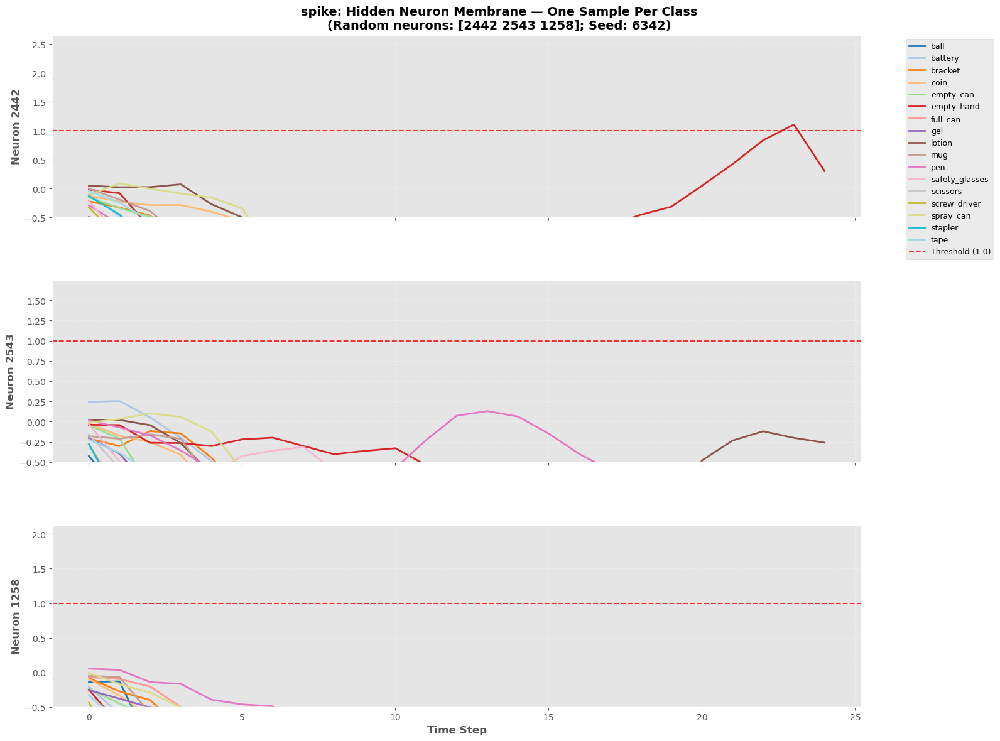


Plotting hybrid: 1496 samples, 25 time steps, 4356 hidden neurons
Selected neurons: [2619 2142 1970]


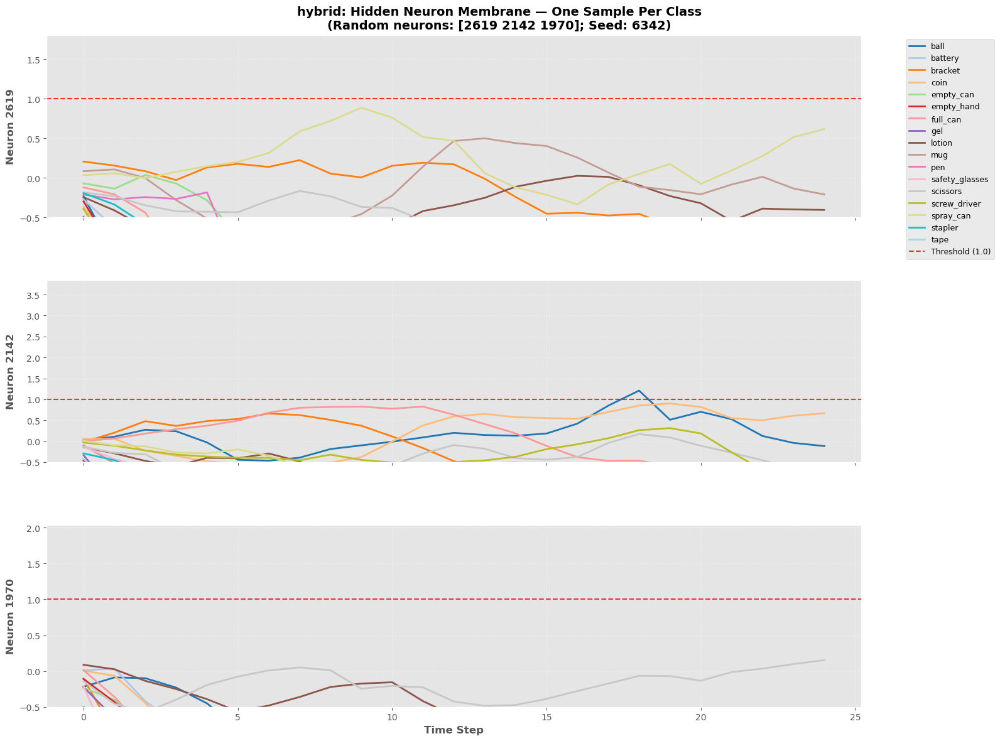


Plotting raw: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [ 969 1168  132]


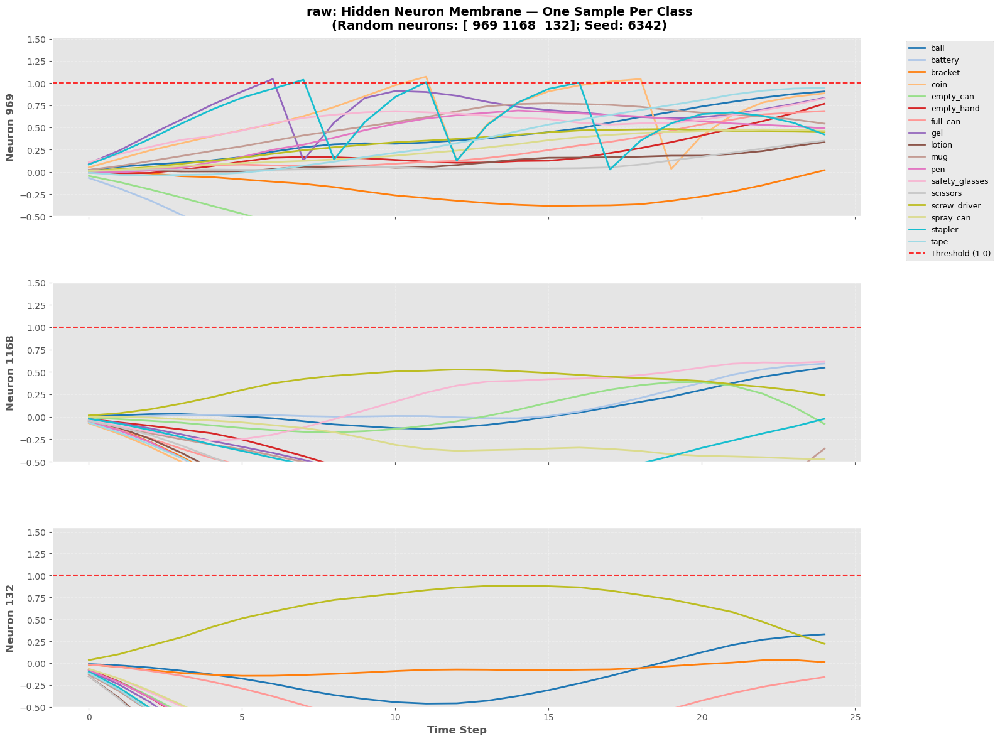

In [ ]:
plot_membrane_one_per_class(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)

Available keys in experiments/preprocessed_encoding_20251107_1637.npz: ['spike', 'hybrid', 'raw']


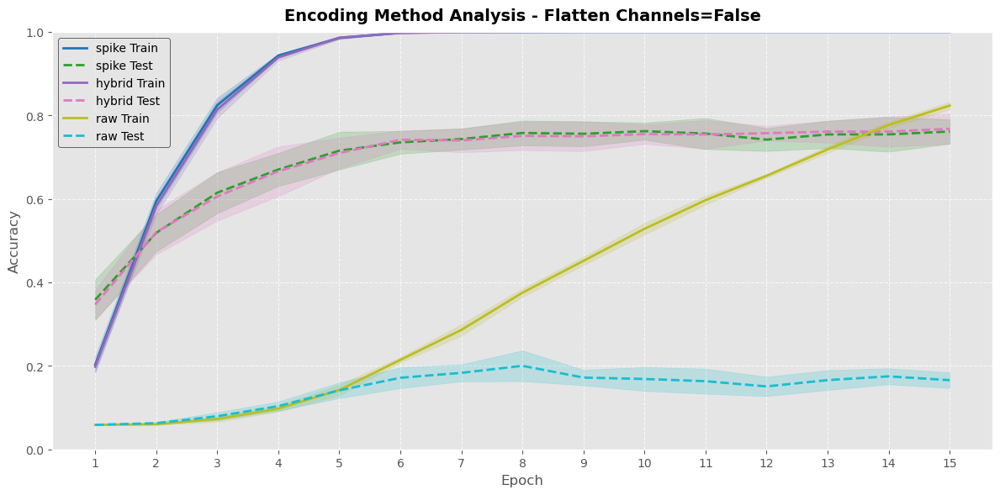

In [ ]:
plot_convergence(
    "experiments/preprocessed_encoding_20251107_1637.npz",
    "experiments/plot_encoding_flatten_False.png",
    "Encoding Method Analysis - Using 484 Pixels - Dual Channel",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
    save_path="experiments/analysis_encoding_flatten_True_topn_200.txt"
)

Available keys in experiments/preprocessed_encoding_20251107_1637.npz: ['spike', 'hybrid', 'raw']
Table saved to experiments/analysis_encoding_flatten_True_topn_200.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     spike               1.0000              0.8137                  1.0000                 0.7613
    hybrid               1.0000              0.8203                  1.0000                 0.7677
       raw               0.8378              0.2422                  0.8234                 0.1658


In [ ]:
results = run_sparsity_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="sparsity_experiment",
    alpha=0.7,
    beta=0.7,
    sparsity_values=[0.2, 0.4, 0.5, 0.6, 0.8, 1.0],
    return_weights=True
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/sparsity_experiment_20251215_1648.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']


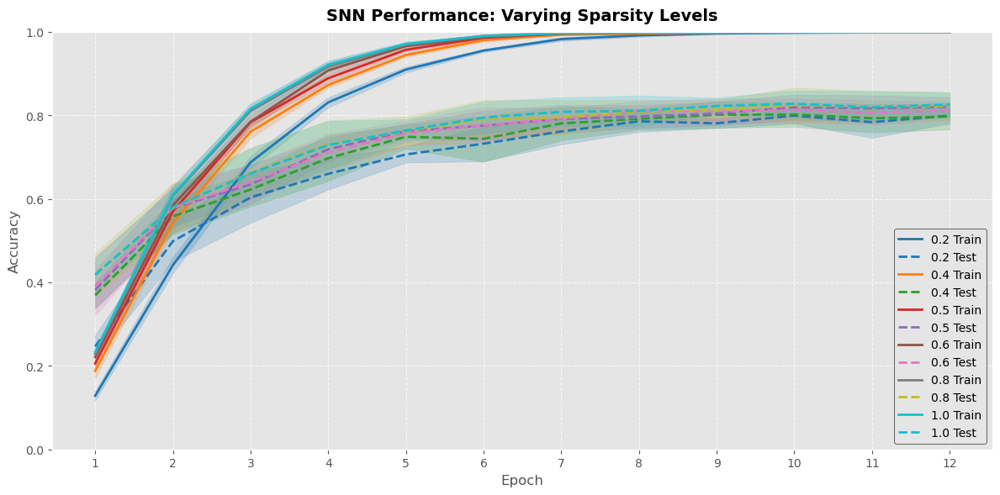

In [ ]:
plot_convergence(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
    save_path="figures/sparsity_convergence.png",
    plt_title="SNN Performance: Varying Sparsity Levels",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
    save_path="experiments/analysis_sparsity_experiment.txt"
)

Available keys in experiments/sparsity_experiment_20251202_162825.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']
Table saved to experiments/analysis_sparsity_experiment.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       0.2                  1.0            0.823529                     1.0               0.778547
       0.4                  1.0            0.843137                     1.0               0.800769
       0.5                  1.0            0.856209                     1.0               0.813802
       0.6                  1.0            0.846405                     1.0               0.796194
       0.8                  1.0            0.866013                     1.0               0.815302
       1.0                  1.0            0.856209                     1.0               0.804652


In [ ]:
analyze_weights(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
)

Loaded: sparsity_experiment_20251202_162825.npz
Found 6 configurations


           INPUT → HIDDEN LAYER WEIGHT ANALYSIS
Config Intended Keep Actual Keep Actual Zero Leakage (%) Avg |W| (all) Avg |W| (nonzero) Total Synapses
   0.2          0.20      0.2001      0.7999       0.00%       0.00781           0.03902        702,768
   0.4          0.40      0.4001      0.5999       0.00%       0.01380           0.03450        702,768
   0.5          0.50      0.5002      0.4998       0.00%       0.01673           0.03345        702,768
   0.6          0.60      0.6002      0.3998       0.00%       0.01951           0.03250        702,768
   0.8          0.80      0.7997      0.2003       0.03%       0.02494           0.03119        702,768
   1.0          1.00      1.0000      0.0000       0.00%       0.03022           0.03022        702,768

Interpretation:
  • Intended Keep = density used during training (e.g. 0.40 = 40% connections kept)
  • Actual Zero ≈ Intended Zero → mask was perfect

### Top-1 / Top-3 experiment on entire dataset

In [ ]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1, 2, 3, 4], "channels": 1, "down_spike": 1.0, "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True,
    topk_accuracy=3
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1_2_3_4.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1_2_3_4.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 2720, CV Test samples = 680
  - CV Train class distribution: [160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160]
  - CV Test class distribution: [40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40]
Fold 2: CV Train samples = 2720, CV Test samples = 680
  - CV Train class dist

Bar plot saved to figures/topk_bar.png


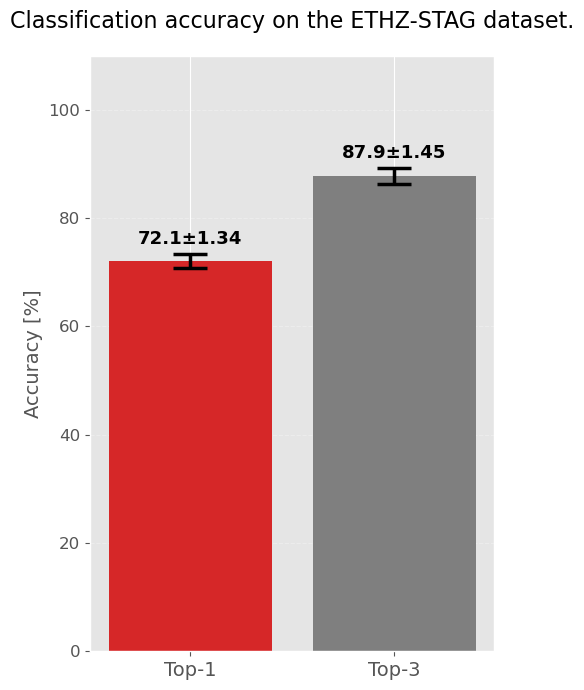

{'top1_mean': 72.08823529411765,
 'top1_std': 1.3394467690277279,
 'top3_mean': 87.85294117647058,
 'top3_std': 1.45461917869156}

In [ ]:
plot_topk_accuracy_bar(
    "experiments/param_encoding_20251215_1707.npz",
    save_path="figures/topk_bar.png",
    title="Classification accuracy on the ETHZ-STAG dataset."
)

### Top-1 / Top-3 experiment on Sessions 0 and 1

In [ ]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True,
    topk_accuracy=3
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 

Bar plot saved to figures/topk_bar.png


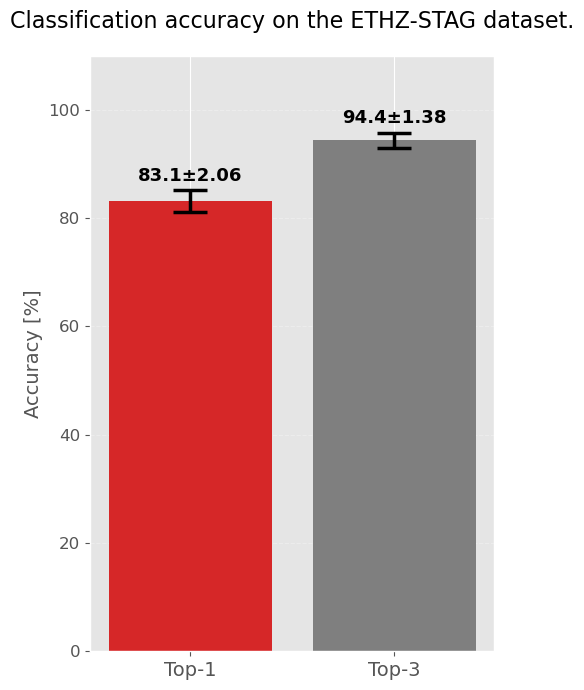

{'top1_mean': 83.12572087658592,
 'top1_std': 2.0560350592993926,
 'top3_mean': 94.42522106881968,
 'top3_std': 1.3758888542972667}

In [ ]:
plot_topk_accuracy_bar(
    "experiments/param_encoding_20251215_1712.npz",
    save_path="figures/topk_bar.png",
    title="Classification accuracy on the ETHZ-STAG dataset."
)

## TOPN PIXELS

### Alpha beta grid search - TOPN = 300

In [ ]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_beta_topn_300_25_frames",
    alpha_values=[0.3, 0.5, 0.7],
    beta_values=[0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### Alpha beta grid search - TOPN = 200

In [ ]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_beta_topn_200_25_frames",
    alpha_values=[0.3, 0.5, 0.7],
    beta_values=[0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

## TOPN = 300

### Threshold experiment - TOPN = 300

In [ ]:
fixed_params = {"topn": 300, "num_frames": 25, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251216_1220.npz: ['0.005', '0.01']


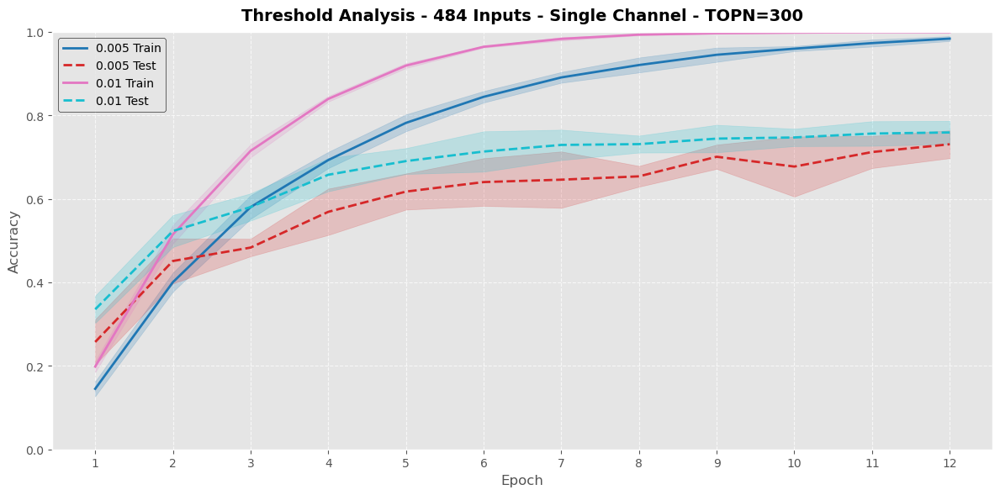

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251216_1220.npz",
    "figures/plot_threshold_flatten_True_topn_300.png",
    "Threshold Analysis - 484 Inputs - Single Channel - TOPN=300",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251216_1220.npz",
)

Available keys in experiments/param_threshold_20251216_1220.npz: ['0.005', '0.01']


TypeError: list indices must be integers or slices, not tuple

### Validation best hyperparameters TOPN = 300

In [ ]:
fixed_params = {"topn": 300, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    verbose=True,
    patience=4,
    min_delta=0.01,
    loss_fn='combined',
    alpha=0.7,
    beta=0.7,
    lr=0.001    
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8058, Avg Train Accuracy: 18.72%
Epoch 1 - Avg Val Loss: 2.7102, Avg Val Accuracy: 33.82%
Epoch 2 - Avg Train Loss: 2.6208, Avg Train Accuracy: 51.87%
Epoch 2 - Avg Val Loss: 2.6624, Avg Val Accuracy: 47.06%
Epoch 3 - Avg Train Loss: 2.4823, Avg Train Accuracy: 70.86%
Epoch 3 - Avg Val Loss: 2.6125, Avg Val Acc

## TOPN = 200

### Validation best hyperparameters TOPN = 200

In [ ]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    loss_fn='combined'
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8377, Avg Train Accuracy: 16.84%
Epoch 1 - Avg Val Loss: 2.7794, Avg Val Accuracy: 38.24%
Epoch 2 - Avg Train Loss: 2.7208, Avg Train Accuracy: 44.52%
Epoch 2 - Avg Val Loss: 2.7287, Avg Val Accuracy: 33.82%
Epoch 3 - Avg Train Loss: 2.6185, Avg Train Accuracy: 62.70%
Epoch 3 - Avg Val Loss: 2.7819, Avg Val Acc

### Confusion matrix - TOPN = 200

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### Validation TOPN = 200 - 10 classes

In [ ]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['spray_can', 'lotion', 'safety_glasses', 'empty_hand', 'screw_driver', 'ball', 'mug', 'pen', 'full_can', 'scissors']
)

### [0,1] Session vs All sessions

In [ ]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="session_id",
    varying_values=[[0, 1],[0,1,2,3,4]],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for session_id = [0, 1] from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_session_id_20251216_1439.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']


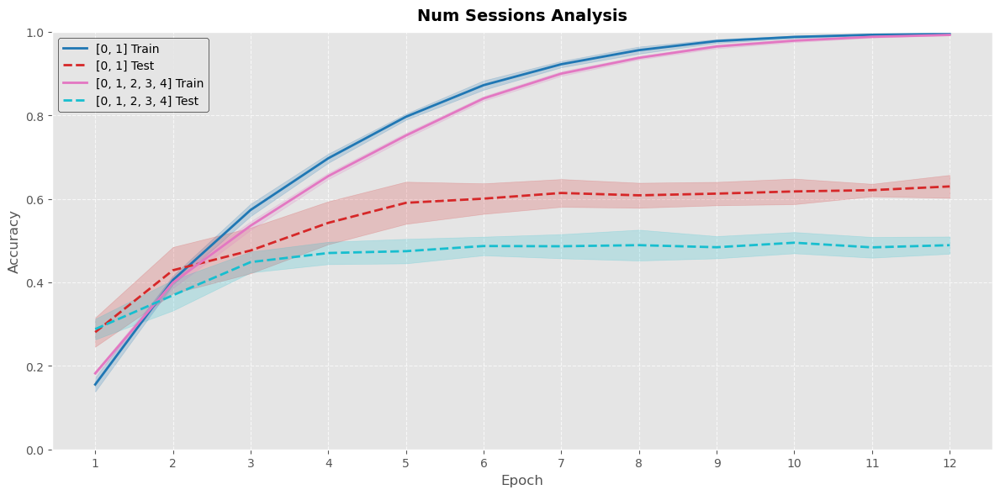

In [ ]:
plot_convergence(
    "experiments/param_session_id_20251216_1439.npz",
    "figures/plot_session_id_25_frames_flatten_True_200_pixels.png",
    "Num Sessions Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_session_id_20251216_1439.npz",
)

Available keys in experiments/param_session_id_20251216_1439.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']


TypeError: list indices must be integers or slices, not tuple

### Model experiment

In [ ]:
results = run_model_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="model_experiment_results_200_pixels"
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

Available keys in experiments/model_experiment_results_200_pixels.npz: ['Synaptic', 'Synaptic_3', 'Synaptic_3_reduced']


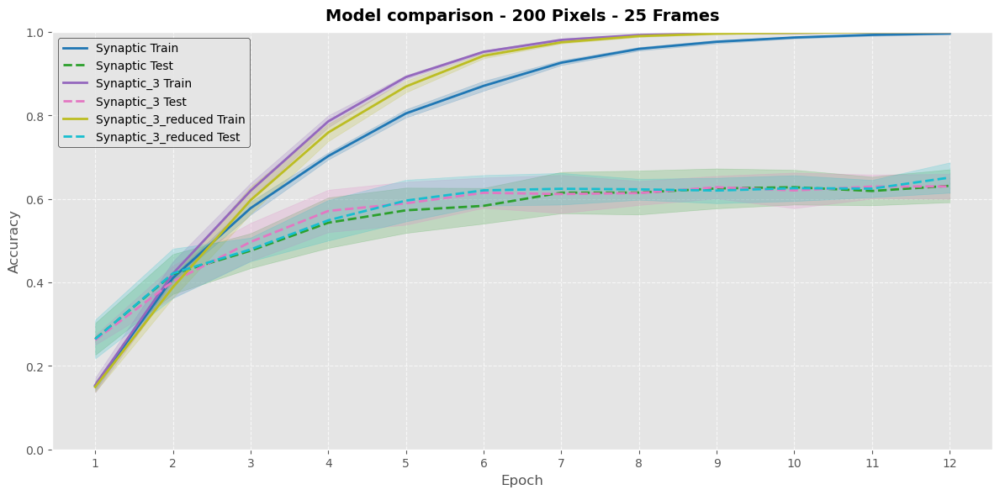

In [ ]:
plot_convergence(
    "experiments/model_experiment_results_200_pixels.npz",
    "experiments/model_experiment_results_200_pixels.png",
    "Model comparison - 200 Pixels - 25 Frames",
    plot_std=True
)

### Sparsity experiment

In [ ]:
results = run_sparsity_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=200,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="sparsity_experiment_topn_200",
    alpha=0.5,
    beta=0.9,
    sparsity_values=[0.2, 0.4, 0.5, 0.6, 0.8, 1.0],
    return_weights=True
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

Available keys in experiments/sparsity_experiment_topn_200_20251216_1552.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']


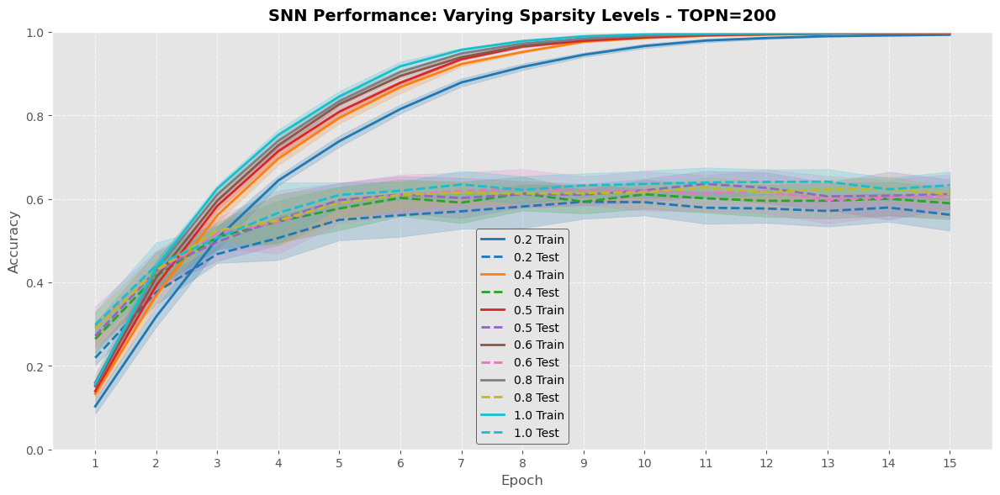

In [ ]:
plot_convergence(
    file_path="experiments/sparsity_experiment_topn_200_20251216_1552.npz",
    save_path="figures/sparsity_topn_200.png",
    plt_title="SNN Performance: Varying Sparsity Levels - TOPN=200",
    plot_std=True
)

### Fan in experiment

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=200,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[16, 32, 64, 128, 200],
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 

Available keys in experiments/fan_in_20251216_1637.npz: ['fanin_16', 'fanin_32', 'fanin_64', 'fanin_128', 'fanin_200']


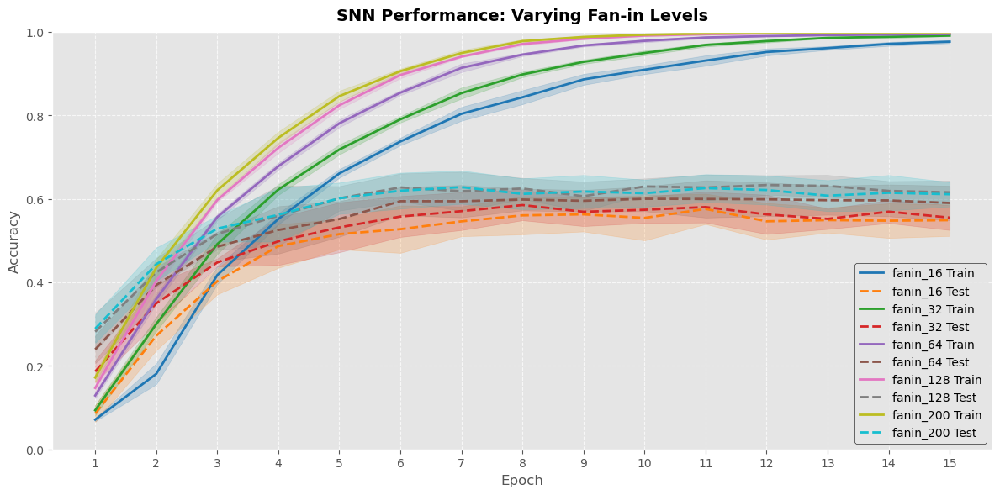

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_20251216_1637.npz",
    save_path="figures/fanin_convergence.png",
    plt_title="SNN Performance: Varying Fan-in Levels",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_20251216_1637.npz",
)

Available keys in experiments/fanin_experiment_20251204_160753.npz: ['fanin_16', 'fanin_32', 'fanin_64', 'fanin_128', 'fanin_200']
Table saved to experiments/analysis_fanin_experiment.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.981513            0.647059                0.976624               0.539331
  fanin_32             0.991715            0.633987                0.991308               0.556824
  fanin_64             0.999160            0.673203                0.996833               0.588312
 fanin_128             1.000000            0.666667                0.998999               0.604152
 fanin_200             1.000000            0.679739                0.999162               0.625413


## TOPN = 256

### Confusion matrix

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### TOP 10 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=20,
    batch_size=16,
    verbose=True,
    num_outputs=10,
    num_inputs=256,
    input_file="spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['spray_can', 'safety_glasses', 'scissors', 'full_can', 'lotion', 'empty_hand', 'mug', 'screw_driver', 'ball', 'bracket']
)

Loaded data from preprocessed_data/spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Fold 1: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distrib

Available keys in experiments/fan_in_top_256_10_classes_20260107_1115.npz: ['fanin_16', 'fanin_32', 'fanin_64']


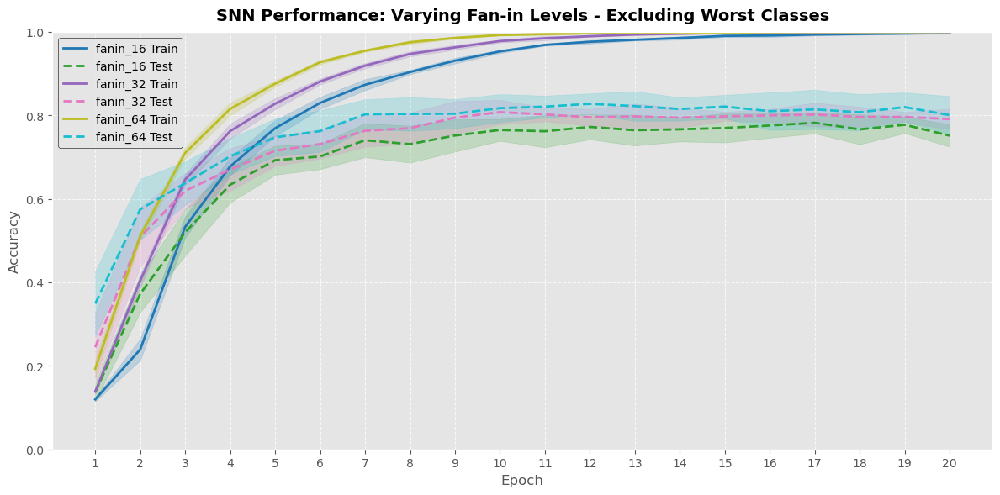

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_256_10_classes_20260107_1115.npz",
    save_path="figures/fanin_convergence_topn_256_10_classes.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_256_10_classes_20260107_1115.npz",
)

Available keys in experiments/fan_in_top_256_10_classes_20260107_1115.npz: ['fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.998592            0.823529                0.997159               0.751438
  fanin_32             1.000000            0.855556                0.999714               0.790980
  fanin_64             1.000000            0.872222                0.999714               0.800588


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_16,0.998592,0.823529,0.997159,0.751438
1,fanin_32,1.000000,0.855556,0.999714,0.790980
2,fanin_64,1.000000,0.872222,0.999714,0.800588


In [ ]:
fixed_params = {"topn": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = run_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['spray_can', 'safety_glasses', 'scissors', 'full_can', 'lotion', 'empty_hand', 'mug', 'screw_driver', 'ball', 'bracket'],
    fixed_fan_in=64
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Enforcing EXACTLY 64 inputs per hidden neuron
→ Final: exactly 64 per neuron → 25.00% density (49,152 synapses)
Epoch 1 - Avg Train Loss: 2.2930, Avg Train Accuracy: 30.80%
Epoch 1 - Avg Va

### TOP 5 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=256,
    input_file="spike_data_topn_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['full_can', 'empty_hand', 'spray_can', 'lotion', 'mug']
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['empty_hand', 'full_can', 'lotion', 'mug', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class

Available keys in experiments/fan_in_top_128_5_classes_20251216_1735.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


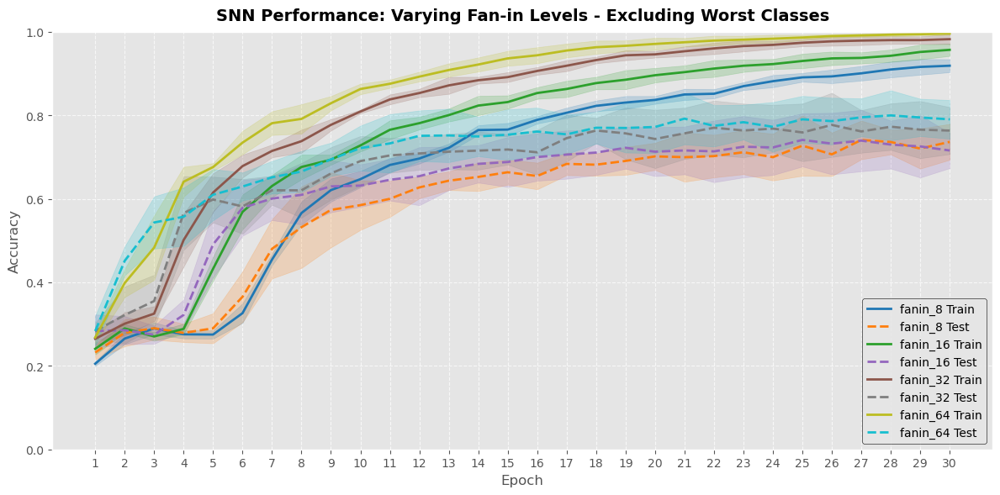

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_256_5_classes_20251216_1735.npz",
    save_path="figures/fanin_convergence_topn_256_5_classes.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_256_5_classes_20251216_1735.npz",
)

Available keys in experiments/fan_in_top_128_5_classes_20251210_101816.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.988571            0.900000                0.977320               0.750458
  fanin_16             0.994366            0.933333                0.990905               0.781438
  fanin_32             1.000000            0.966667                0.994889               0.800523
  fanin_64             1.000000            0.955556                0.999429               0.790458


## TOPN = 128

### Confusion matrix

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### TOP 10 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=25,
    batch_size=16,
    verbose=True,
    num_outputs=10,
    num_inputs=128,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['full_can', 'empty_hand', 'spray_can', 'lotion', 'mug', 'screw_driver', 'safety_glasses', 'scissors', 'ball', 'bracket']
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Fold 1: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distrib

Available keys in experiments/fan_in_top_128_10_classes_20251216_1723.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


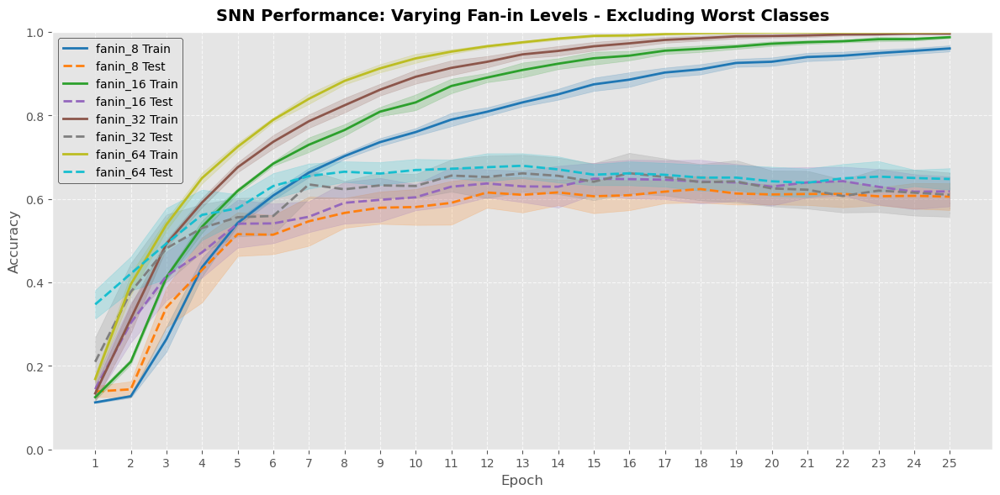

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_128_10_classes_20251216_1723.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_128_10_classes_20251209_115639.npz",
)

FileNotFoundError: [Errno 2] No such file or directory: 'experiments/fan_in_top_128_10_classes_20251209_115639.npz'

### TOP 5 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=128,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['full_can', 'empty_hand', 'spray_can', 'lotion', 'mug']
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['empty_hand', 'full_can', 'lotion', 'mug', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class

Available keys in experiments/fan_in_top_128_5_classes_20251216_1735.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


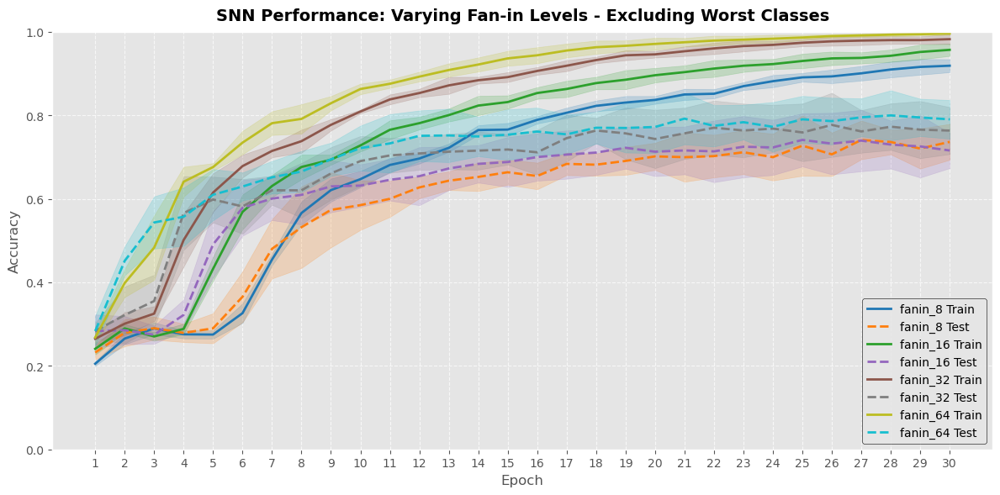

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_128_5_classes_20251216_1735.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_128_5_classes_20251216_1735.npz",
)

Available keys in experiments/fan_in_top_128_5_classes_20251210_101816.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.988571            0.900000                0.977320               0.750458
  fanin_16             0.994366            0.933333                0.990905               0.781438
  fanin_32             1.000000            0.966667                0.994889               0.800523
  fanin_64             1.000000            0.955556                0.999429               0.790458


## TOPN = 64

### Confusion matrix

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
F

### TOP 10 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    num_outputs=10,
    num_inputs=64,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['pen', 'mug', 'screw_driver', 'spray_can', 'lotion', 'safety_glasses', 'full_can', 'bracket', 'stapler', 'empty_hand']
)

KeyboardInterrupt: 

Available keys in experiments/fan_in_top_64_10_classes_20251216_1838.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


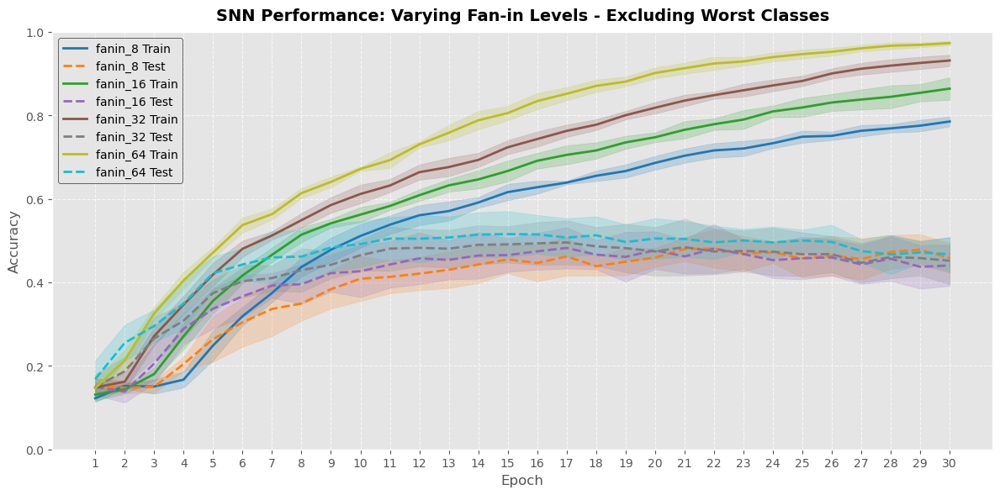

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_64_10_classes_20251216_1838.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_64_10_classes_20251216_1838.npz",
)

Available keys in experiments/fan_in_top_64_10_classes_20251209_131635.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.795714            0.517647                0.769384               0.435490
  fanin_16             0.875714            0.570588                0.851489               0.452614
  fanin_32             0.948571            0.547059                0.927879               0.454183
  fanin_64             0.980000            0.561111                0.971312               0.430850


### TOP 5 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=80,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=64,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['pen', 'mug', 'screw_driver', 'spray_can', 'lotion']
)

Loaded data from preprocessed_data/spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['lotion', 'mug', 'pen', 'screw_driver', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class dist

Available keys in experiments/fan_in_top_64_5_classes_20251216_1853.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


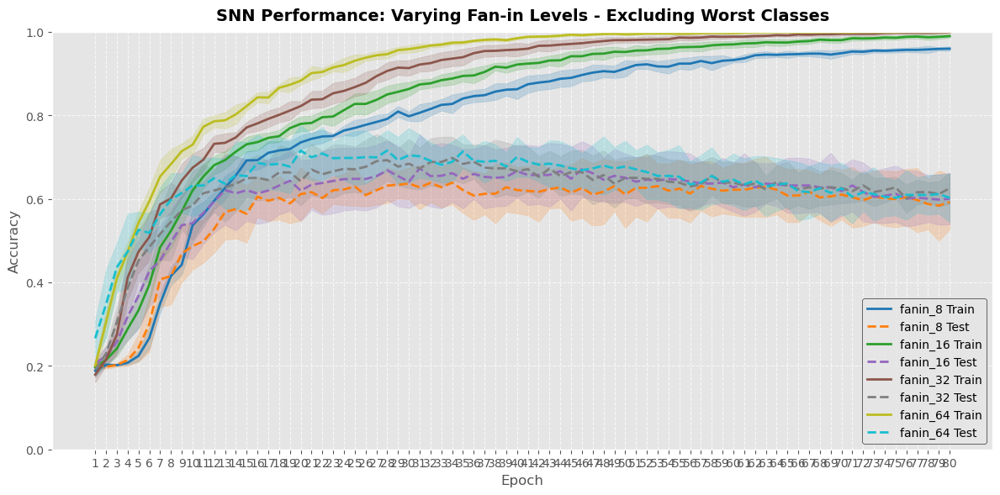

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_64_5_classes_20251216_1853.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_64_5_classes_20251216_1853.npz",
)

Available keys in experiments/fan_in_top_64_5_classes_20251210_1104.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.971429            0.788889                0.961360               0.601046
  fanin_16             0.994286            0.766667                0.986390               0.584967
  fanin_32             1.000000            0.811111                0.999429               0.618039
  fanin_64             1.000000            0.811111                1.000000               0.626013


## TOPN = 32

### Confusion matrix

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
F

### TOP 5 classes

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=75,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=32,
    input_file="spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['lotion', 'safety_glasses', 'coin', 'screw_driver', 'spray_can']
)

Loaded data from preprocessed_data/spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['coin', 'lotion', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Tes

Available keys in experiments/fan_in_top_32_5_classes_20251216_1932.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


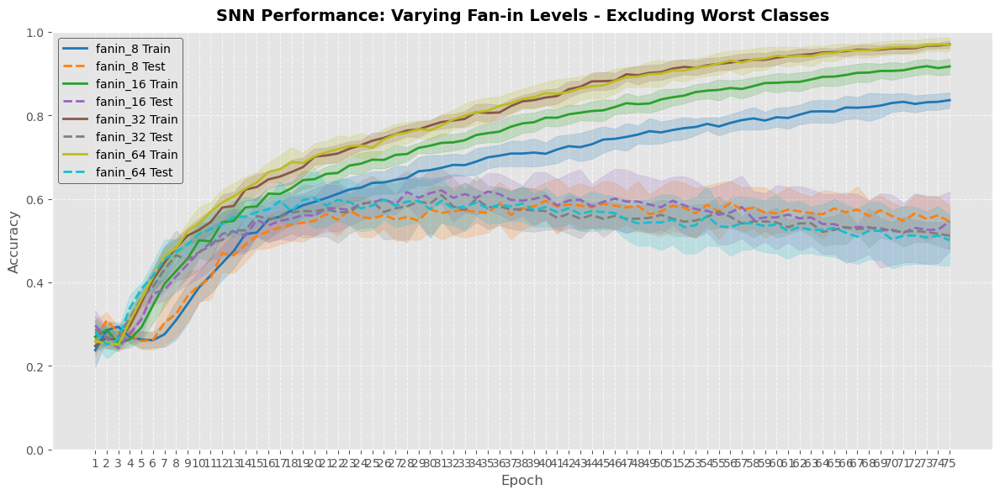

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_32_5_classes_20251216_1932.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_32_5_classes_20251216_1932.npz",
)

Available keys in experiments/fan_in_top_32_5_classes_20251210_1120.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.862857            0.666667                0.838680               0.468497
  fanin_16             0.945714            0.666667                0.919960               0.502222
  fanin_32             0.982857            0.666667                0.972781               0.504967
  fanin_64             0.994286            0.633333                0.967718               0.468366


## Top pixels vs random pixels vs averaging pixels vs custom pixels

### TOPN

In [ ]:
fixed_params = {"method": "topn", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[100, 200, 300, 400],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)

Available keys in experiments/param_n_20260121_1322.npz: ['100', '200', '300', '400']


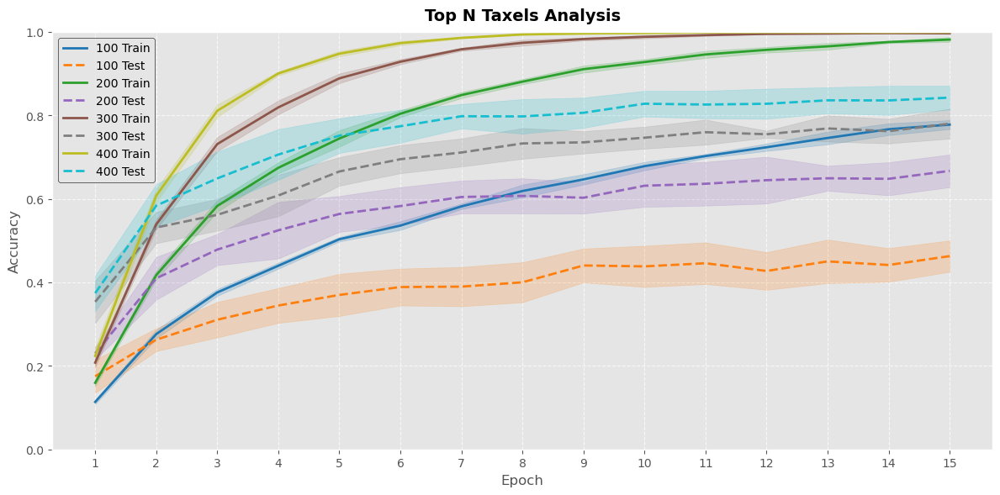

In [ ]:
plot_convergence(
    "experiments/param_n_20260121_1322.npz",
    "figures/plot_topn2.png",
    "Top N Taxels Analysis",
    plot_std=True
)

In [3]:
analyze_experiment_results(
    file_path="experiments/param_n_20260121_1322.npz"
)

Available keys in experiments/param_n_20260121_1322.npz: ['100', '200', '300', '400']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy Average Train Accuracy (mean ± std) Average Test Accuracy (mean ± std)
       100             0.795798            0.512111                     0.7778 ± 0.0107                    0.4629 ± 0.0375
       200             0.988235            0.715686                     0.9815 ± 0.0058                    0.6670 ± 0.0392
       300             0.998319            0.839869                     0.9965 ± 0.0013                    0.7800 ± 0.0358
       400             1.000000            0.885621                     0.9995 ± 0.0004                    0.8424 ± 0.0285


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy (mean ± std),Average Test Accuracy (mean ± std)
0,100,0.795798,0.512111,0.7778 ± 0.0107,0.4629 ± 0.0375
1,200,0.988235,0.715686,0.9815 ± 0.0058,0.6670 ± 0.0392
2,300,0.998319,0.839869,0.9965 ± 0.0013,0.7800 ± 0.0358
3,400,1.000000,0.885621,0.9995 ± 0.0004,0.8424 ± 0.0285


### Random

In [ ]:
fixed_params = {"method": "random", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[100, 200, 300, 400],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for n = 100 from preprocessed_data/spike_data_method_random_n_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_random_n_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'random', 'n': 100, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  -

Available keys in experiments/param_n_20260121_1336.npz: ['100', '200', '300', '400']


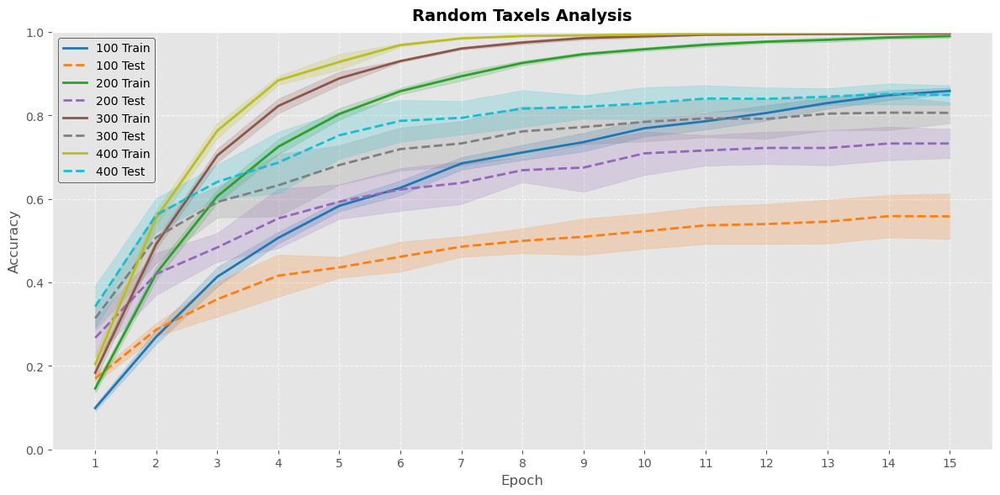

In [ ]:
plot_convergence(
    "experiments/param_n_20260121_1336.npz",
    "figures/plot_random.png",
    "Random Taxels Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_n_20260121_1336.npz",
)

Available keys in experiments/param_n_20260121_1336.npz: ['100', '200', '300', '400']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy Average Train Accuracy (mean +- std) Average Test Accuracy (mean +- std)
       100             0.866387            0.615917                     0.8585 +- 0.0078                    0.5581 +- 0.0542
       200             0.996639            0.784314                     0.9898 +- 0.0044                    0.7326 +- 0.0351
       300             0.998319            0.852941                     0.9963 +- 0.0011                    0.8060 +- 0.0251
       400             1.000000            0.882353                     0.9985 +- 0.0010                    0.8486 +- 0.0235


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy (mean +- std),Average Test Accuracy (mean +- std)
0,100,0.866387,0.615917,0.8585 +- 0.0078,0.5581 +- 0.0542
1,200,0.996639,0.784314,0.9898 +- 0.0044,0.7326 +- 0.0351
2,300,0.998319,0.852941,0.9963 +- 0.0011,0.8060 +- 0.0251
3,400,1.000000,0.882353,0.9985 +- 0.0010,0.8486 +- 0.0235


### Average

In [ ]:
fixed_params = {"method": "average", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=["212121", "121212", "312121", "212222", "222222"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for n = 212121 from preprocessed_data/spike_data_method_average_n_212121_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_average_n_212121_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'average', 'n': '212121', 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70

Available keys in experiments/param_n_20260129_1124.npz: ['212121', '121212', '312121', '212222', '222222']


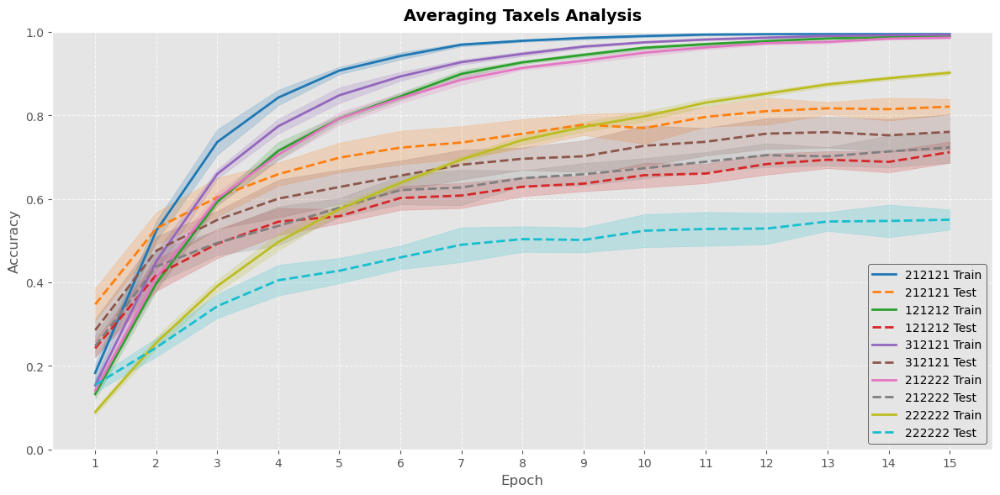

In [ ]:
plot_convergence(
    "experiments/param_n_20260129_1124.npz",
    "figures/plot_average.png",
    "Averaging Taxels Analysis",
    plot_std=True
)

In [13]:
analyze_experiment_results(
    file_path="experiments/param_n_20260129_1124.npz",
)

Available keys in experiments/param_n_20260129_1124.npz: ['212121', '121212', '312121', '212222', '222222']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy Average Train Accuracy (mean ± std) Average Test Accuracy (mean ± std)
    212121             0.998343            0.852941                     0.9975 ± 0.0010                    0.8209 ± 0.0185
    121212             0.992437            0.748366                     0.9900 ± 0.0016                    0.7118 ± 0.0256
    312121             0.995798            0.810458                     0.9932 ± 0.0024                    0.7606 ± 0.0418
    212222             0.990058            0.771242                     0.9861 ± 0.0021                    0.7233 ± 0.0367
    222222             0.910084            0.584967                     0.9021 ± 0.0051                    0.5501 ± 0.0244


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy (mean ± std),Average Test Accuracy (mean ± std)
0,212121,0.998343,0.852941,0.9975 ± 0.0010,0.8209 ± 0.0185
1,121212,0.992437,0.748366,0.9900 ± 0.0016,0.7118 ± 0.0256
2,312121,0.995798,0.810458,0.9932 ± 0.0024,0.7606 ± 0.0418
3,212222,0.990058,0.771242,0.9861 ± 0.0021,0.7233 ± 0.0367
4,222222,0.910084,0.584967,0.9021 ± 0.0051,0.5501 ± 0.0244


In [ ]:
fixed_params = {"method": "average", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=["211111", "112111", "111121", "112211"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for n = 211111 from preprocessed_data/spike_data_method_average_n_211111_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_average_n_211111_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'average', 'n': '211111', 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70

Available keys in experiments/param_n_20260202_1005.npz: ['211111', '112111', '111121', '112211']


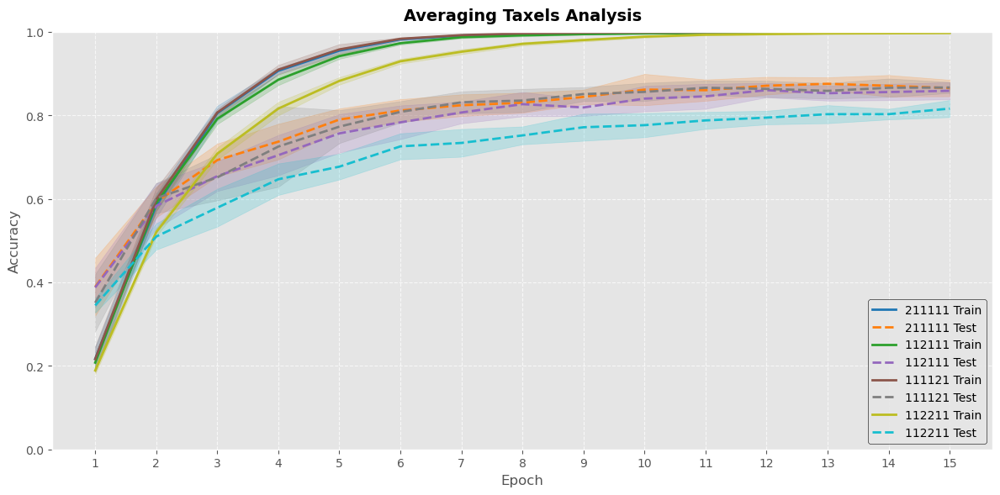

In [ ]:
plot_convergence(
    "experiments/param_n_20260202_1005.npz",
    "figures/plot_average.png",
    "Averaging Taxels Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_n_20260202_1005.npz",
)

Available keys in experiments/param_n_20260202_1005.npz: ['211111', '112111', '111121', '112211']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
    211111              1.00000            0.905229                0.999832               0.865359
    112111              1.00000            0.885621                0.999498               0.858785
    111121              1.00000            0.898693                1.000000               0.866667
    112211              0.99916            0.846405                0.997162               0.816148


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,211111,1.00000,0.905229,0.999832,0.865359
1,112111,1.00000,0.885621,0.999498,0.858785
2,111121,1.00000,0.898693,1.000000,0.866667
3,112211,0.99916,0.846405,0.997162,0.816148


### Farthest Point Sampling (FPS)

In [ ]:
fixed_params = {"method": "fps", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[100, 200, 300, 400],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for n = 100 from preprocessed_data/spike_data_method_fps_n_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 100, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test 

Available keys in experiments/param_n_20260122_1023.npz: ['100', '200', '300', '400']


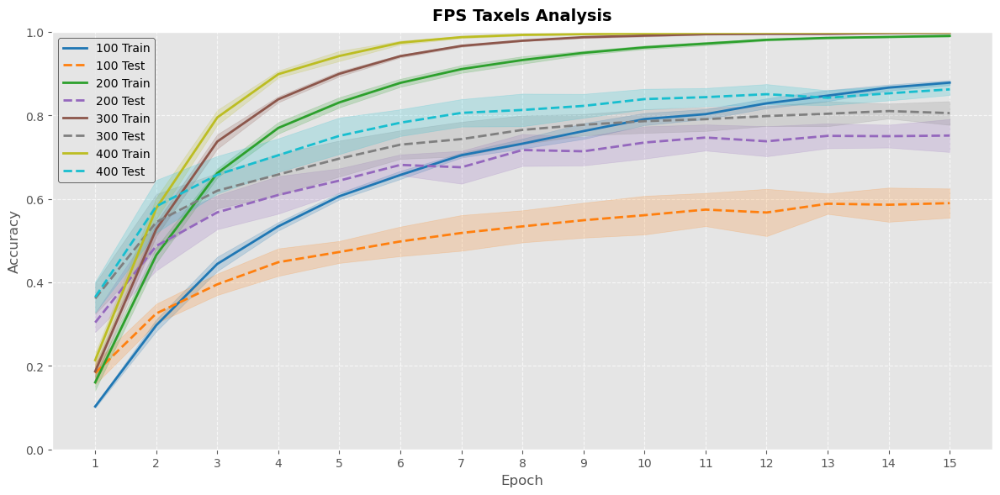

In [ ]:
plot_convergence(
    "experiments/param_n_20260122_1023.npz",
    "figures/plot_fps.png",
    "FPS Taxels Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_n_20260122_1023.npz",
)

Available keys in experiments/param_n_20260122_1023.npz: ['100', '200', '300', '400']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       100             0.884838            0.660900                0.878324               0.589773
       200             0.995798            0.802768                0.990486               0.751596
       300             0.999160            0.840830                0.997832               0.805421
       400             1.000000            0.888889                0.999330               0.862245


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,100,0.884838,0.660900,0.878324,0.589773
1,200,0.995798,0.802768,0.990486,0.751596
2,300,0.999160,0.840830,0.997832,0.805421
3,400,1.000000,0.888889,0.999330,0.862245


#### Validation all pixels top-3

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 548, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.7,
    beta=0.7,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_548_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_548_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 548, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Epoch 1 → Train Loss: 2.8928 | Train Top-1: 14.30% | Val Loss: 2.8028 | Val Top-1: 36.03% | Val Top-3: 58.82% ← BEST
Epoch 2 → Train Loss: 2.7485 | Train Top-1: 39.91% | Val Loss: 2.7796 | Val Top-1: 43.38% | Val Top-3: 69.85% ← BEST
Epoch 3 → Train Loss: 2.6425 | Train Top-1: 70.66% | Val Loss: 2.7378 | Val Top-1: 47.79% | Val Top-3: 74.26% ← BEST
Epoch 4 → Trai

{'train_top1_hist': [0.14304812834224598,
  0.39906417112299464,
  0.7065508021390374,
  0.8489304812834224,
  0.9478609625668449,
  0.981951871657754,
  0.9966577540106952,
  0.9986631016042781,
  0.9993315508021391,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_top1_hist': [0.3602941176470588,
  0.4338235294117647,
  0.47794117647058826,
  0.39705882352941174,
  0.21323529411764705,
  0.6397058823529411,
  0.6838235294117647,
  0.6911764705882353,
  0.7132352941176471,
  0.625,
  0.6911764705882353,
  0.6470588235294118,
  0.7132352941176471,
  0.6911764705882353],
 'train_topk_hist': [0.3589572192513369,
  0.7279411764705882,
  0.9217914438502673,
  0.9866310160427807,
  0.9959893048128342,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.5882352941176471,
  0.6985294117647058,
  0.7426470588235294,
  0.7205882352941176,
  0.6691176470588235,
  0.8382352941176471,
  0.8529411764705882,
  0.875,
  0.8823529411764706,
  0.8308823529411765,
  0.830882352

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 484, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.7,
    beta=0.7,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_484_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_484_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 484, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Epoch 1 → Train Loss: 2.8772 | Train Top-1: 15.98% | Val Loss: 2.8065 | Val Top-1: 25.00% | Val Top-3: 50.74% ← BEST
Epoch 2 → Train Loss: 2.7370 | Train Top-1: 44.12% | Val Loss: 2.7635 | Val Top-1: 44.12% | Val Top-3: 69.12% ← BEST
Epoch 3 → Train Loss: 2.6311 | Train Top-1: 72.13% | Val Loss: 2.7250 | Val Top-1: 52.94% | Val Top-3: 79.41% ← BEST
Epoch 4 → Trai

{'train_top1_hist': [0.15975935828877005,
  0.4411764705882353,
  0.7212566844919787,
  0.9030748663101604,
  0.9652406417112299,
  0.9939839572192514,
  0.9973262032085561,
  0.9993315508021391,
  0.9993315508021391,
  0.9993315508021391,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_top1_hist': [0.25,
  0.4411764705882353,
  0.5294117647058824,
  0.4411764705882353,
  0.5882352941176471,
  0.5955882352941176,
  0.6838235294117647,
  0.6838235294117647,
  0.6911764705882353,
  0.6470588235294118,
  0.7058823529411765,
  0.625,
  0.6323529411764706,
  0.6617647058823529,
  0.7205882352941176,
  0.6691176470588235,
  0.6911764705882353,
  0.7205882352941176,
  0.6911764705882353,
  0.6985294117647058],
 'train_topk_hist': [0.39037433155080214,
  0.7620320855614974,
  0.9338235294117647,
  0.9959893048128342,
  0.9973262032085561,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.5

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 400, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_400_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_400_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 400, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Epoch 1 → Train Loss: 2.8598 | Train Top-1: 21.93% | Val Loss: 2.8317 | Val Top-1: 36.03% | Val Top-3: 61.03% ← BEST
Epoch 2 → Train Loss: 2.7352 | Train Top-1: 62.30% | Val Loss: 2.7581 | Val Top-1: 49.26% | Val Top-3: 75.00% ← BEST
Epoch 3 → Train Loss: 2.6527 | Train Top-1: 81.55% | Val Loss: 2.7198 | Val Top-1: 54.41% | Val Top-3: 77.94% ← BEST
Epoch 4 → Trai

{'train_top1_hist': [0.2192513368983957,
  0.6229946524064172,
  0.8155080213903744,
  0.9010695187165776,
  0.9525401069518716,
  0.9799465240641712,
  0.9926470588235294,
  0.9946524064171123,
  0.9973262032085561,
  1.0,
  1.0,
  0.9993315508021391,
  0.9993315508021391,
  1.0],
 'val_top1_hist': [0.3602941176470588,
  0.49264705882352944,
  0.5441176470588235,
  0.5882352941176471,
  0.6544117647058824,
  0.6176470588235294,
  0.7205882352941176,
  0.7205882352941176,
  0.75,
  0.7132352941176471,
  0.6985294117647058,
  0.6838235294117647,
  0.75,
  0.7573529411764706],
 'train_topk_hist': [0.44719251336898397,
  0.8509358288770054,
  0.9625668449197861,
  0.9906417112299465,
  0.9959893048128342,
  0.9993315508021391,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.6102941176470589,
  0.75,
  0.7794117647058824,
  0.8308823529411765,
  0.8382352941176471,
  0.8823529411764706,
  0.9044117647058824,
  0.8897058823529411,
  0.8676470588235294,
  0.8602

### Custom

In [ ]:
fixed_params = {"method": "custom", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[300, 288, 274],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for n = 300 from preprocessed_data/spike_data_method_custom_n_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_custom_n_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'custom', 'n': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  -

Available keys in experiments/param_n_20260122_1050.npz: ['300', '288', '274']


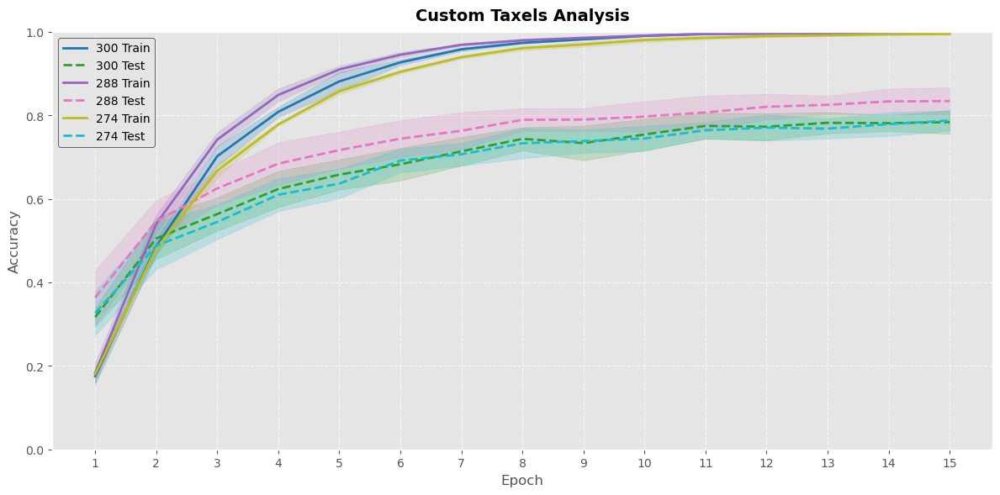

In [ ]:
plot_convergence(
    "experiments/param_n_20260122_1050.npz",
    "figures/plot_custom.png",
    "Custom Taxels Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_n_20260122_1050.npz",
)

Available keys in experiments/param_n_20260122_1050.npz: ['300', '288', '274']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       300              1.00000            0.820261                0.998499               0.783852
       288              1.00000            0.879085                0.996994               0.834256
       274              0.99916            0.826990                0.994986               0.787582


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,300,1.00000,0.820261,0.998499,0.783852
1,288,1.00000,0.879085,0.996994,0.834256
2,274,0.99916,0.826990,0.994986,0.787582


### Method comparison

In [ ]:
fixed_params = {"n": "300", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="method",
    varying_values=["random", "topn", "fps", "custom"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for method = random from preprocessed_data/spike_data_method_random_n_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_random_n_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'random', 'n': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70

Available keys in experiments/param_method_20260211_1105.npz: ['random', 'topn', 'fps', 'custom']


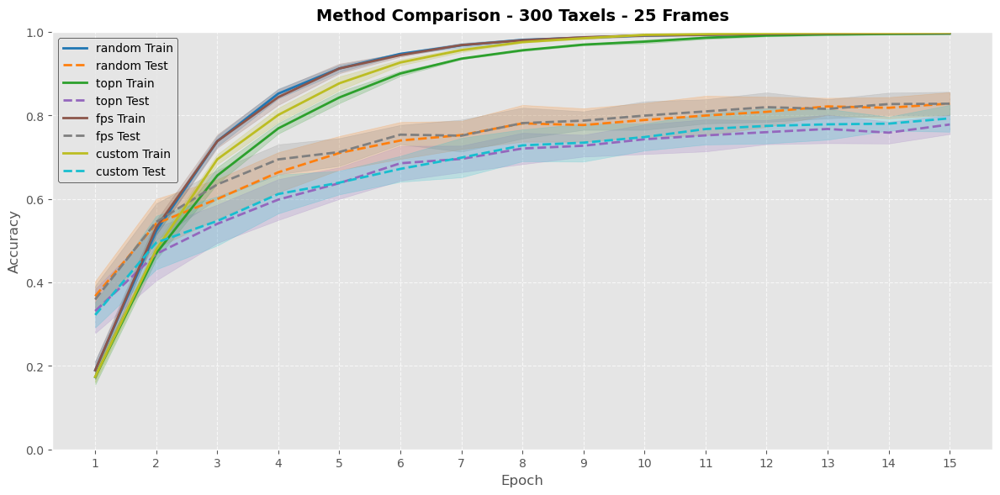

In [ ]:
plot_convergence(
    "experiments/param_method_20260211_1105.npz",
    "figures/plot_method_comparison.png",
    "Method Comparison - 300 Taxels - 25 Frames",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_method_20260211_1105.npz",
)

Available keys in experiments/param_method_20260211_1105.npz: ['random', 'topn', 'fps', 'custom']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
    random             1.000000            0.852941                0.998499               0.828335
      topn             0.997479            0.806228                0.995656               0.778085
       fps             1.000000            0.866013                0.997327               0.827951
    custom             1.000000            0.846405                0.998660               0.792810


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,random,1.000000,0.852941,0.998499,0.828335
1,topn,0.997479,0.806228,0.995656,0.778085
2,fps,1.000000,0.866013,0.997327,0.827951
3,custom,1.000000,0.846405,0.998660,0.792810


## Fan-in experiments

### 256 Pixels

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[16, 32, 64],
    alpha=0.5,
    beta=0.9,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/fan_in_20260305_1210.npz: ['fanin_16', 'fanin_32', 'fanin_64']


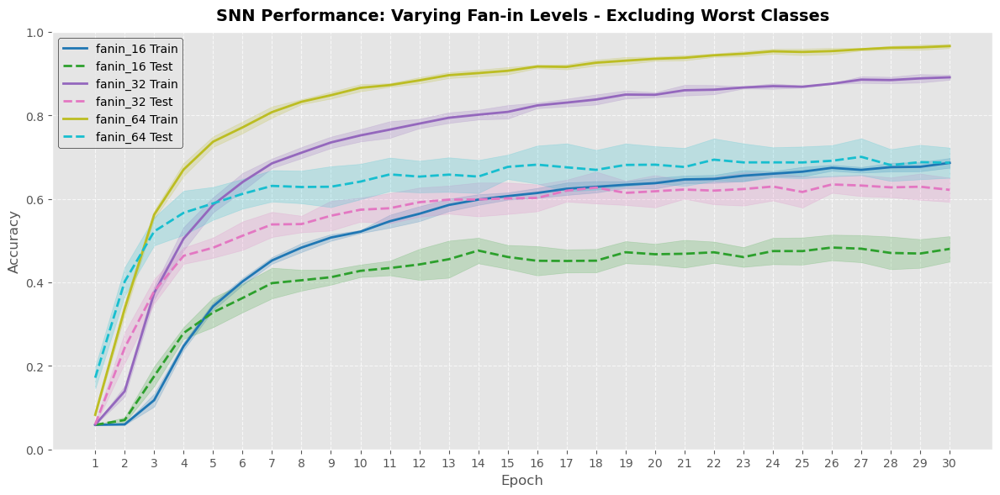

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_20260305_1210.npz",
    save_path="figures/fanin_convergence_fps_256.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)


In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_20260305_1210.npz",
)

Available keys in experiments/fan_in_20260305_1210.npz: ['fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.695798            0.542484                0.686157               0.480200
  fanin_32             0.906723            0.679739                0.891036               0.621607
  fanin_64             0.973950            0.771242                0.965906               0.686544


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_16,0.695798,0.542484,0.686157,0.480200
1,fanin_32,0.906723,0.679739,0.891036,0.621607
2,fanin_64,0.973950,0.771242,0.965906,0.686544


In [4]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[64],
    alpha=0.5,
    beta=0.9,
    return_spikes=True
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

In [2]:
compute_inference_firing_rates(
    file_path="experiments/fan_in_20260316_1116.npz",
)


  INFERENCE FIRING RATE ANALYSIS — fan_in_20260316_1116.npz
  Timestep: 10.0 ms  |  Sample duration: 250 ms  |  Configurations: 1
 fan_in  num_test_samples  input_spikes_per_sample  hidden_spikes_per_sample  output_spikes_per_sample  input_rate_hz  hidden_rate_hz  output_rate_hz  total_SOPs_per_sample
     64              1496                   550.64                    845.65                     23.61          8.604           4.404           5.556               120098.9

Column guide:
  *_spikes_per_sample  : mean total spike count over all neurons in that layer per inference
  *_rate_hz            : mean firing rate per neuron (Hz) averaged over test samples
  total_SOPs_per_sample: estimated synaptic ops = input_spikes×(fan_in/N_in)×N_hid + hidden_spikes×N_out


,fan_in,num_test_samples,T_steps,sample_duration_ms,num_inputs,num_hidden,num_outputs,input_spikes_per_sample,hidden_spikes_per_sample,hidden_spikes_std,output_spikes_per_sample,output_spikes_std,input_rate_hz,hidden_rate_hz,output_rate_hz,input_SOPs_per_sample,hidden_SOPs_per_sample,total_SOPs_per_sample
0,64,1496,25,250.0,256,768,17,550.64,845.65,256.97,23.61,5.18,8.604,4.404,5.556,105722.8,14376.1,120098.9


### 128 Pixels

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[16, 32, 64],
    alpha=0.5,
    beta=0.9,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/fan_in_20260305_1236.npz: ['fanin_16', 'fanin_32', 'fanin_64']


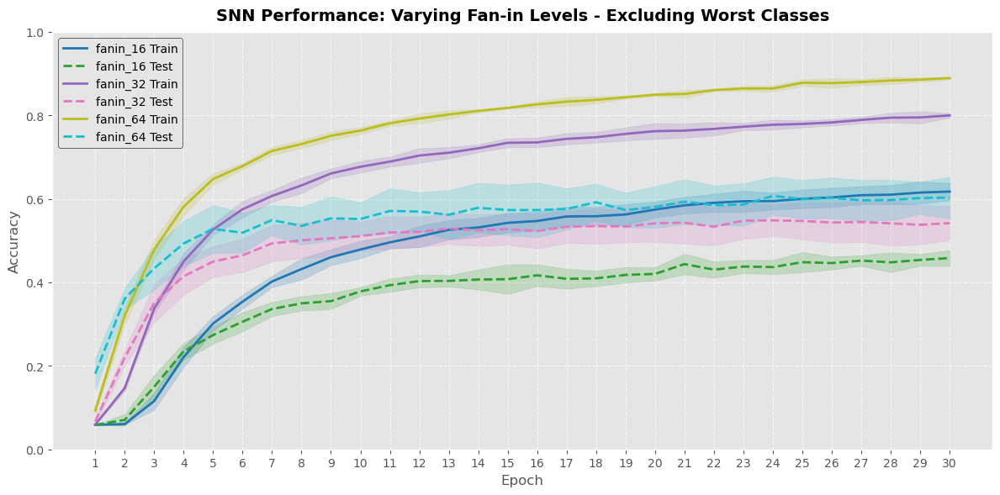

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_20260305_1236.npz",
    save_path="figures/fanin_convergence_fps_128.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)


In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_20260305_1236.npz",
)

Available keys in experiments/fan_in_20260305_1236.npz: ['fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.654515            0.484429                0.617429               0.458170
  fanin_32             0.809445            0.619377                0.799938               0.541945
  fanin_64             0.897266            0.660131                0.889360               0.603114


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_16,0.654515,0.484429,0.617429,0.458170
1,fanin_32,0.809445,0.619377,0.799938,0.541945
2,fanin_64,0.897266,0.660131,0.889360,0.603114


### 64 Pixels

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[16, 32, 64],
    alpha=0.5,
    beta=0.9,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 

Available keys in experiments/fan_in_20260305_1307.npz: ['fanin_16', 'fanin_32', 'fanin_64']


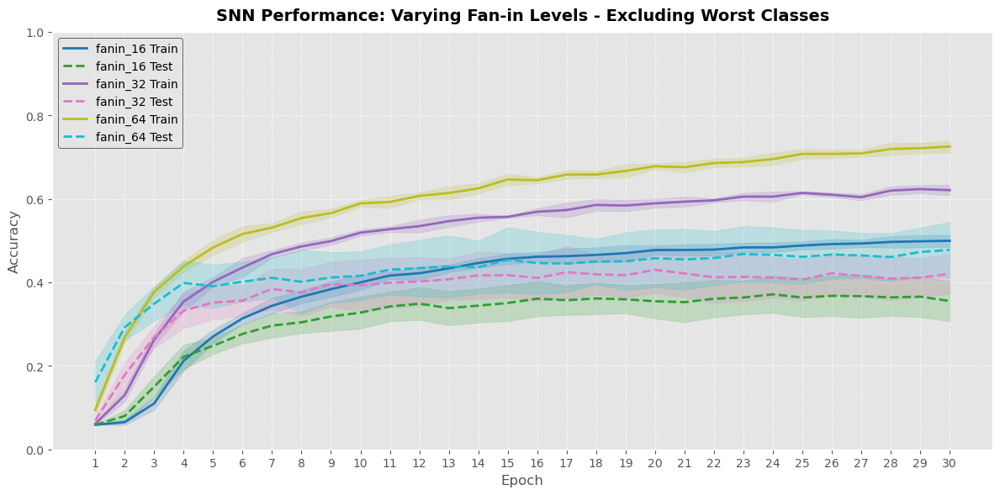

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_20260305_1307.npz",
    save_path="figures/fanin_convergence_fps_64.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)


In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_20260305_1307.npz",
)

Available keys in experiments/fan_in_20260305_1307.npz: ['fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.521127            0.422145                0.499645               0.355440
  fanin_32             0.636134            0.484429                0.620923               0.420377
  fanin_64             0.747059            0.532872                0.725300               0.477701


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_16,0.521127,0.422145,0.499645,0.355440
1,fanin_32,0.636134,0.484429,0.620923,0.420377
2,fanin_64,0.747059,0.532872,0.725300,0.477701


In [12]:
results = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_16_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[32],
    alpha=0.5,
    beta=0.9,
    include_classes=['spray_can', 'empty_hand'],
    return_weights=True,
    return_spikes=True,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_16_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 16, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['empty_hand', 'spray_can']
→ New number of classes: 2
Fold 1: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 2: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 3: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 4: CV Train samples = 142, CV Test samples = 34
  - CV Train class distribution: [71 71]
  - CV Test class distribution: [17 17]
Fold 5: CV Train samples = 142, CV Test samples = 34
  - CV Train class distribution: [

In [13]:
analyze_weights(
    file_path="experiments/fan_in_top_16_2_classes_20260306_1628.npz",
)

Loaded: fan_in_top_16_2_classes_20260306_1628.npz
Found 1 configurations


           INPUT → HIDDEN LAYER WEIGHT ANALYSIS
  Config Intended Keep Actual Keep Actual Zero Leakage (%) Avg |W| (all) Avg |W| (nonzero) Total Synapses  sort_key
fanin_32             —      1.0000      0.0000           —       0.13686           0.13686            768       NaN

Interpretation:
  • Intended Keep = density used during training (e.g. 0.40 = 40% connections kept)
  • Actual Zero ≈ Intended Zero → mask was perfectly enforced
  • Leakage < 0.01% → excellent (your mask is strong!)
  • Higher sparsity → lower Avg |W| (nonzero) → stronger, more selective weights
  • Best accuracy usually at sparsity where Leakage ≈ 0 and Avg |W| (nonzero) is highest

In your case: expect leakage ≈ 0.00% — your mask is permanent and perfect.


## FPS fan-in top-k experiments

### 256 Pixels

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 4: CV Trai

In [ ]:
results = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion']
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'empty_hand', 'lotion', 'mug', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class distribution: [17 1

Available keys in experiments/fan_in_top_256_5_classes_20260305_1528.npz: ['fanin_16', 'fanin_32', 'fanin_64']


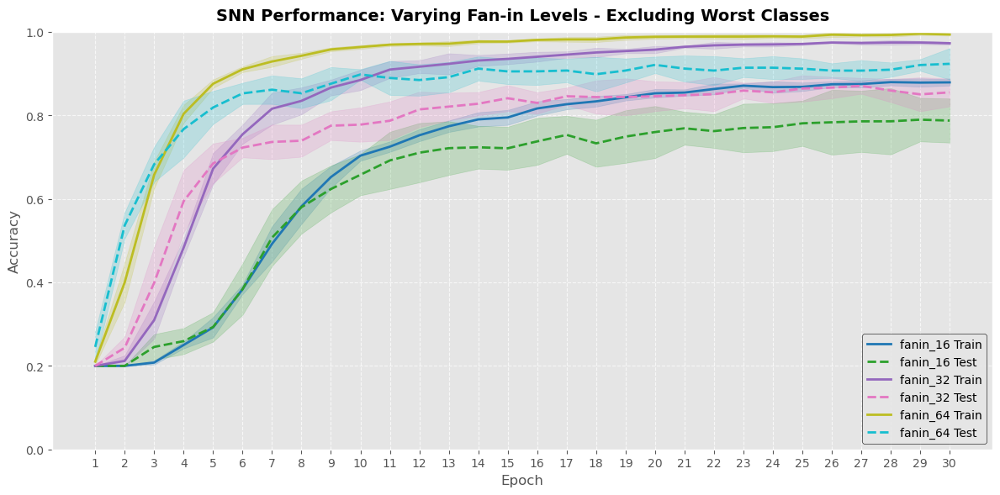

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_256_5_classes_20260305_1528.npz",
    save_path="figures/fanin_convergence_fps_256_5_classes.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_256_5_classes_20260305_1528.npz",
)

Available keys in experiments/fan_in_top_256_5_classes_20260305_1528.npz: ['fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.888571            0.894118                0.879026               0.787451
  fanin_32             0.982857            0.905882                0.972732               0.855033
  fanin_64             1.000000            0.976471                0.993738               0.923399


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_16,0.888571,0.894118,0.879026,0.787451
1,fanin_32,0.982857,0.905882,0.972732,0.855033
2,fanin_64,1.000000,0.976471,0.993738,0.923399


In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'spray_can', 'ball'],
    return_spikes=True,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'empty_hand', 'spray_can']
→ New number of classes: 3
Fold 1: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 2: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 3: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 4: CV Train samples = 213, CV Test samples = 51
  - CV Train class distribution: [71 71 71]
  - CV Test class distribution: [17 17 17]
Fold 5: CV Train samples = 213, CV Test samples = 51
  

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion', 'safety_glasses', 'scissors', 'coin', 'empty_can', 'screw_driver']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'coin', 'empty_can', 'empty_hand', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.2982 | Train Top-1: 40.45% | Val Loss: 2.1364 | Val Top-1: 61.25% | Val Top-3: 87.50% ← BEST
Epoch 2 → Train Loss: 2.1874 | Train Top-1: 80.34% | Val Loss: 2.1584 | Val Top-1: 67.50% | Val Top

{'train_top1_hist': [0.40454545454545454,
  0.803409090909091,
  0.9159090909090909,
  0.9590909090909091,
  0.9840909090909091,
  0.9920454545454546,
  0.9977272727272727,
  1.0,
  0.9977272727272727,
  1.0,
  1.0,
  1.0],
 'val_top1_hist': [0.6125,
  0.675,
  0.7,
  0.8,
  0.75,
  0.8125,
  0.85,
  0.8,
  0.825,
  0.85,
  0.8375,
  0.8125],
 'train_topk_hist': [0.6931818181818182,
  0.9522727272727273,
  0.9886363636363636,
  0.9965909090909091,
  0.9988636363636364,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.875,
  0.875,
  0.8875,
  0.9375,
  0.925,
  0.975,
  0.975,
  0.975,
  0.95,
  0.95,
  0.9125,
  0.95],
 'final_train_top1': 0.9977272727272727,
 'final_val_top1': 0.85,
 'final_train_topk': 1.0,
 'final_val_topk': 0.975,
 'best_epoch': 7,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1.,

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion', 'safety_glasses', 'scissors', 'coin', 'empty_can', 'screw_driver']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'coin', 'empty_can', 'empty_hand', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.2958 | Train Top-1: 32.39% | Val Loss: 2.2097 | Val Top-1: 56.25% | Val Top-3: 76.25% ← BEST
Epoch 2 → Train Loss: 2.2238 | Train Top-1: 70.68% | Val Loss: 2.2443 | Val Top-1: 57.50% | Val Top

{'train_top1_hist': [0.32386363636363635,
  0.7068181818181818,
  0.8318181818181818,
  0.8784090909090909,
  0.9227272727272727,
  0.9272727272727272,
  0.9386363636363636,
  0.9556818181818182,
  0.9613636363636363,
  0.9625,
  0.9806818181818182,
  0.9784090909090909,
  0.9795454545454545,
  0.9852272727272727,
  0.9886363636363636,
  0.9863636363636363],
 'val_top1_hist': [0.5625,
  0.575,
  0.6375,
  0.6875,
  0.6875,
  0.7125,
  0.725,
  0.75,
  0.775,
  0.7375,
  0.7875,
  0.7625,
  0.75,
  0.725,
  0.7375,
  0.75],
 'train_topk_hist': [0.5568181818181818,
  0.9090909090909091,
  0.9670454545454545,
  0.9738636363636364,
  0.9886363636363636,
  0.9875,
  0.9943181818181818,
  1.0,
  0.9965909090909091,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.7625,
  0.825,
  0.7875,
  0.9125,
  0.8625,
  0.875,
  0.9125,
  0.9625,
  0.9125,
  0.925,
  0.95,
  0.9125,
  0.9375,
  0.9125,
  0.95,
  0.9125],
 'final_train_top1': 0.9806818181818182,
 'final_val_top1': 

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion', 'safety_glasses', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'lotion', 'mug', 'safety_glasses', 'scissors', 'spray_can']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9363 | Train Top-1: 53.08% | Val Loss: 1.8582 | Val Top-1: 71.43% | Val Top-3: 92.86% ← BEST
Epoch 2 → Train Loss: 1.8270 | Train Top-1: 86.69% | Val Loss: 2.0183 | Val Top-1: 73.21% | Val Top-3: 98.21% ← BEST
Epoch 3 → Train Loss

{'train_top1_hist': [0.5308441558441559,
  0.8668831168831169,
  0.9561688311688312,
  0.9788961038961039,
  0.9951298701298701,
  0.9967532467532467,
  0.9983766233766234,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_top1_hist': [0.7142857142857143,
  0.7321428571428571,
  0.7142857142857143,
  0.75,
  0.8035714285714286,
  0.7678571428571429,
  0.8392857142857143,
  0.8392857142857143,
  0.875,
  0.7857142857142857,
  0.8392857142857143,
  0.8392857142857143,
  0.875,
  0.8214285714285714],
 'train_topk_hist': [0.7873376623376623,
  0.9756493506493507,
  0.9967532467532467,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.9285714285714286,
  0.9821428571428571,
  0.9821428571428571,
  0.9821428571428571,
  0.9821428571428571,
  0.9821428571428571,
  0.9821428571428571,
  0.9821428571428571,
  1.0,
  0.9821428571428571,
  0.9821428571428571,
  0.9642857142857143,
  0.9821428571428571,
  0.9821428571428571],
 'final_train_top

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion', 'safety_glasses', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'lotion', 'mug', 'safety_glasses', 'scissors', 'spray_can']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9371 | Train Top-1: 41.88% | Val Loss: 1.7722 | Val Top-1: 62.50% | Val Top-3: 82.14% ← BEST
Epoch 2 → Train Loss: 1.8681 | Train Top-1: 77.76% | Val Loss: 1.9209 | Val Top-1: 75.00% | Val Top-3: 91.07% ← BEST
Epoch 3 → Train Loss

{'train_top1_hist': [0.41883116883116883,
  0.7775974025974026,
  0.8766233766233766,
  0.9285714285714286,
  0.9496753246753247,
  0.961038961038961,
  0.9707792207792207,
  0.9821428571428571,
  0.9886363636363636],
 'val_top1_hist': [0.625,
  0.75,
  0.6607142857142857,
  0.7678571428571429,
  0.6785714285714286,
  0.7321428571428571,
  0.6964285714285714,
  0.7678571428571429,
  0.6607142857142857],
 'train_topk_hist': [0.6282467532467533,
  0.948051948051948,
  0.9821428571428571,
  0.9935064935064936,
  0.9951298701298701,
  0.9951298701298701,
  0.9983766233766234,
  1.0,
  1.0],
 'val_topk_hist': [0.8214285714285714,
  0.9107142857142857,
  0.875,
  0.9642857142857143,
  0.9464285714285714,
  0.9464285714285714,
  1.0,
  1.0,
  0.9821428571428571],
 'final_train_top1': 0.9285714285714286,
 'final_val_top1': 0.7678571428571429,
 'final_train_topk': 0.9935064935064936,
 'final_val_topk': 0.9642857142857143,
 'best_epoch': 4,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mas

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 256, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'mug', 'ball', 'spray_can', 'lotion']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'lotion', 'mug', 'spray_can']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6016 | Train Top-1: 57.05% | Val Loss: 1.5068 | Val Top-1: 77.50% | Val Top-3: 97.50% ← BEST
Epoch 2 → Train Loss: 1.4989 | Train Top-1: 91.82% | Val Loss: 1.4857 | Val Top-1: 82.50% | Val Top-3: 100.00% ← BEST
Epoch 3 → Train Loss: 1.4366 | Train Top-1: 96.59

{'train_top1_hist': [0.5704545454545454,
  0.9181818181818182,
  0.9659090909090909,
  0.990909090909091,
  1.0,
  0.9977272727272727,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_top1_hist': [0.775,
  0.825,
  0.875,
  0.85,
  0.95,
  0.95,
  0.9,
  0.875,
  0.95,
  0.875],
 'train_topk_hist': [0.9022727272727272,
  0.9954545454545455,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.975, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 'final_train_top1': 1.0,
 'final_val_top1': 0.95,
 'final_train_topk': 1.0,
 'final_val_topk': 1.0,
 'best_epoch': 5,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.]])),
   

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6133 | Train Top-1: 46.14% | Val Loss: 1.4763 | Val Top-1: 72.50% | Val Top-3: 97.50% ← BEST
Epoch 2 → Train Loss: 1.5618 | Train Top-1: 79.55% | Val Loss: 1.5824 | Val Top-1: 77.50% | Val Top-3: 92.50% ← BEST
Epoch 3 → Train Loss: 1.5278 | Tr

{'train_top1_hist': [0.46136363636363636,
  0.7954545454545454,
  0.8681818181818182,
  0.8954545454545455,
  0.8977272727272727,
  0.925,
  0.9340909090909091,
  0.9590909090909091,
  0.9522727272727273,
  0.9590909090909091,
  0.9681818181818181,
  0.9818181818181818,
  0.9840909090909091,
  0.9863636363636363,
  0.9795454545454545,
  0.9863636363636363],
 'val_top1_hist': [0.725,
  0.775,
  0.875,
  0.875,
  0.85,
  0.9,
  0.9,
  0.9,
  0.9,
  0.875,
  0.925,
  0.925,
  0.9,
  0.85,
  0.925,
  0.925],
 'train_topk_hist': [0.7568181818181818,
  0.9431818181818182,
  0.9818181818181818,
  0.990909090909091,
  0.9931818181818182,
  0.9977272727272727,
  0.9954545454545455,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727],
 'val_topk_hist': [0.975,
  0.925,
  0.975,
  0.975,
  0.975,
  1.0,
  1.0,
  1.0,
  1.0,
  0.975,
  1.0,
  1.0,
  1.0,

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    include_classes=['empty_hand', 'mug', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'mug']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1000, Avg Train Accuracy: 71.21%
Epoch 1 - Avg Val Loss: 1.0931, Avg Val Accuracy: 79.17%
Epoch 2 - Avg Train Loss: 1.0416, Avg Train Accuracy: 94.70%
Epoch 2 - Avg Val Loss: 0.9405, Avg Val Accuracy: 83.33%
Epoch 3 - Avg Train Loss: 1.0104, Avg Train Accuracy: 96.21%
Epoch 3 - 

{'train_loss_hist': [1.10001985480388,
  1.0416246318455897,
  1.0103783709081737,
  0.9890400938915483,
  0.9674387998653181,
  0.9546689594333823,
  0.94308228745605,
  0.9392470771616156,
  0.9350905752543247],
 'train_acc_hist': [0.7121212121212122,
  0.946969696969697,
  0.9621212121212122,
  0.9848484848484849,
  0.9962121212121212,
  0.9962121212121212,
  1.0,
  1.0,
  1.0],
 'val_loss_hist': [1.093065619468689,
  0.9404800534248352,
  1.0432645082473755,
  0.9302966594696045,
  1.0037999153137207,
  0.9748954772949219,
  0.9778138995170593,
  0.9568604826927185,
  0.9730863571166992],
 'val_acc_hist': [0.7916666666666666,
  0.8333333333333334,
  0.875,
  0.9583333333333334,
  0.9583333333333334,
  0.9583333333333334,
  0.9166666666666666,
  0.9166666666666666,
  0.9166666666666666],
 'best_epoch': 4,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'mug', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'mug']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1061, Avg Train Accuracy: 62.12%
Epoch 1 - Avg Val Loss: 0.9975, Avg Val Accuracy: 79.17%
Epoch 2 - Avg Train Loss: 1.0614, Avg Train Accuracy: 91.67%
Epoch 2 - Avg Val Loss: 0.9828, Avg Val Accuracy: 91.67%
Epoch 3 - Avg Train Loss: 1.0345, Avg Train Accuracy: 95.08%
Epoch 3 - 

{'train_loss_hist': [1.106085235648083,
  1.061434827970736,
  1.034488434818658,
  1.017596166693803,
  1.0063501824483727,
  0.9925504672256383,
  0.9867859196030733,
  0.9785591302947565,
  0.9723481786521998],
 'train_acc_hist': [0.6212121212121212,
  0.9166666666666666,
  0.9507575757575758,
  0.9507575757575758,
  0.9772727272727273,
  0.9810606060606061,
  0.9848484848484849,
  0.9810606060606061,
  0.9962121212121212],
 'val_loss_hist': [0.9974877834320068,
  0.9828479290008545,
  1.0884785652160645,
  0.9400991201400757,
  1.0033555030822754,
  0.9641836285591125,
  1.0360242128372192,
  0.9628626108169556,
  1.0357069969177246],
 'val_acc_hist': [0.7916666666666666,
  0.9166666666666666,
  0.9166666666666666,
  0.9583333333333334,
  0.9583333333333334,
  0.9583333333333334,
  0.9583333333333334,
  0.9166666666666666,
  0.875],
 'best_epoch': 4,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 0., 0.,  ..., 0., 1., 1.],
                       [0., 1.,

### 128 pixels

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 4: CV Trai

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=25,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver']
)

Available keys in experiments/fan_in_top_128_5_classes_20260202_1100.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


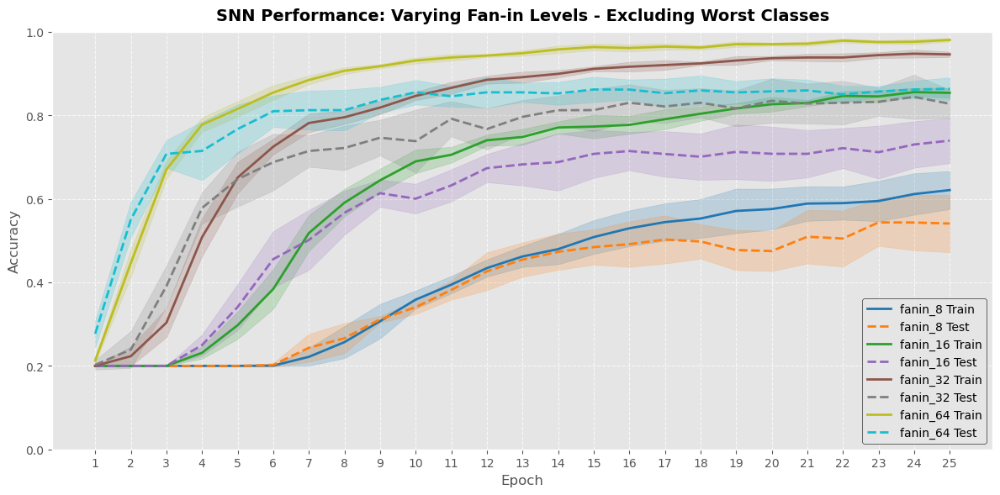

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_128_5_classes_20260202_1100.npz",
    save_path="figures/fanin_convergence_fps_128_5_classes.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_128_5_classes_20260202_1100.npz",
)

Available keys in experiments/fan_in_top_128_5_classes_20260202_1100.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.665714            0.633333                0.621014               0.540915
  fanin_16             0.873239            0.800000                0.853899               0.739477
  fanin_32             0.960563            0.894118                0.946004               0.827843
  fanin_64             0.985915            0.905882                0.980676               0.863660


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_8,0.665714,0.633333,0.621014,0.540915
1,fanin_16,0.873239,0.800000,0.853899,0.739477
2,fanin_32,0.960563,0.894118,0.946004,0.827843
3,fanin_64,0.985915,0.905882,0.980676,0.863660


In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'spray_can', 'ball'],
    return_spikes=True,
)

Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'empty_hand', 'spray_can']
→ New number of classes: 3
Fold 1: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 2: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 3: CV Train samples = 210, CV Test samples = 54
  - CV Train class distribution: [70 70 70]
  - CV Test class distribution: [18 18 18]
Fold 4: CV Train samples = 213, CV Test samples = 51
  - CV Train class distribution: [71 71 71]
  - CV Test class distribution: [17 17 17]
Fold 5: CV Train samples = 213, CV Test samples = 51
  

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver', 'mug', 'bracket', 'coin', 'full_can', 'lotion']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'coin', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.2971 | Train Top-1: 38.98% | Val Loss: 2.2835 | Val Top-1: 52.50% | Val Top-3: 71.25% ← BEST
Epoch 2 → Train Loss: 2.2238 | Train Top-1: 69.77% | Val Loss: 2.2483 | Val Top-1: 57.50% | Val Top-3

{'train_top1_hist': [0.38977272727272727,
  0.6977272727272728,
  0.8272727272727273,
  0.875,
  0.9181818181818182,
  0.9386363636363636,
  0.9613636363636363,
  0.9727272727272728,
  0.9829545454545454,
  0.9829545454545454,
  0.9931818181818182,
  0.9965909090909091,
  0.9931818181818182,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  1.0],
 'val_top1_hist': [0.525,
  0.575,
  0.6375,
  0.7125,
  0.725,
  0.7375,
  0.775,
  0.7375,
  0.7,
  0.7125,
  0.8,
  0.8125,
  0.7625,
  0.7875,
  0.775,
  0.8,
  0.775],
 'train_topk_hist': [0.6761363636363636,
  0.9045454545454545,
  0.9590909090909091,
  0.9772727272727273,
  0.9875,
  0.9920454545454546,
  0.9965909090909091,
  0.9988636363636364,
  0.9988636363636364,
  0.9988636363636364,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.7125,
  0.85,
  0.9125,
  0.8875,
  0.825,
  0.875,
  0.8875,
  0.9,
  0.85,
  0.9,
  0.8875,
  0.925,
  0.9,
  0.9,
  0.9125,
  0.9,
  0.8875],
 'final_train_top

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver', 'mug', 'bracket', 'coin', 'full_can', 'lotion']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'coin', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.2945 | Train Top-1: 33.18% | Val Loss: 2.2853 | Val Top-1: 47.50% | Val Top-3: 75.00% ← BEST
Epoch 2 → Train Loss: 2.2336 | Train Top-1: 64.32% | Val Loss: 2.2480 | Val Top-1: 51.25% | Val Top-3

{'train_top1_hist': [0.33181818181818185,
  0.6431818181818182,
  0.7556818181818182,
  0.8090909090909091,
  0.8272727272727273,
  0.8454545454545455,
  0.865909090909091,
  0.8943181818181818,
  0.9011363636363636,
  0.9113636363636364,
  0.9306818181818182,
  0.9397727272727273,
  0.9545454545454546,
  0.95,
  0.9647727272727272,
  0.9602272727272727,
  0.975,
  0.9636363636363636,
  0.9761363636363637,
  0.9772727272727273],
 'val_top1_hist': [0.475,
  0.5125,
  0.575,
  0.65,
  0.625,
  0.625,
  0.6625,
  0.625,
  0.65,
  0.675,
  0.6625,
  0.6875,
  0.6625,
  0.6875,
  0.7,
  0.6875,
  0.7125,
  0.7,
  0.7375,
  0.675],
 'train_topk_hist': [0.5761363636363637,
  0.8761363636363636,
  0.928409090909091,
  0.9477272727272728,
  0.9613636363636363,
  0.9784090909090909,
  0.9806818181818182,
  0.9886363636363636,
  0.9931818181818182,
  0.9943181818181818,
  0.9954545454545455,
  0.9988636363636364,
  0.9988636363636364,
  0.9977272727272727,
  0.9988636363636364,
  0.99886363636363

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver', 'mug', 'bracket']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'mug', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9395 | Train Top-1: 48.86% | Val Loss: 1.9052 | Val Top-1: 64.29% | Val Top-3: 91.07% ← BEST
Epoch 2 → Train Loss: 1.8633 | Train Top-1: 80.36% | Val Loss: 1.8804 | Val Top-1: 82.14% | Val Top-3: 92.86% ← BEST
Epoch 3 → Train

{'train_top1_hist': [0.48863636363636365,
  0.8035714285714286,
  0.9042207792207793,
  0.9285714285714286,
  0.9642857142857143,
  0.9788961038961039,
  0.9837662337662337],
 'val_top1_hist': [0.6428571428571429,
  0.8214285714285714,
  0.7321428571428571,
  0.7142857142857143,
  0.7321428571428571,
  0.7857142857142857,
  0.7857142857142857],
 'train_topk_hist': [0.7824675324675324,
  0.9675324675324676,
  0.9902597402597403,
  0.9951298701298701,
  0.9983766233766234,
  0.9983766233766234,
  1.0],
 'val_topk_hist': [0.9107142857142857,
  0.9285714285714286,
  0.8928571428571429,
  0.9821428571428571,
  0.9285714285714286,
  0.9642857142857143,
  0.9107142857142857],
 'final_train_top1': 0.8035714285714286,
 'final_val_top1': 0.8214285714285714,
 'final_train_topk': 0.9675324675324676,
 'final_val_topk': 0.9285714285714286,
 'best_epoch': 2,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1.

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver', 'mug', 'bracket']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'mug', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9394 | Train Top-1: 40.26% | Val Loss: 1.9106 | Val Top-1: 57.14% | Val Top-3: 83.93% ← BEST
Epoch 2 → Train Loss: 1.8792 | Train Top-1: 74.19% | Val Loss: 1.8945 | Val Top-1: 69.64% | Val Top-3: 92.86% ← BEST
Epoch 3 → Train

{'train_top1_hist': [0.4025974025974026,
  0.7418831168831169,
  0.8392857142857143,
  0.8685064935064936,
  0.8977272727272727,
  0.9155844155844156,
  0.9431818181818182,
  0.9415584415584416],
 'val_top1_hist': [0.5714285714285714,
  0.6964285714285714,
  0.7678571428571429,
  0.7321428571428571,
  0.7678571428571429,
  0.6964285714285714,
  0.75,
  0.7321428571428571],
 'train_topk_hist': [0.6785714285714286,
  0.9318181818181818,
  0.974025974025974,
  0.9788961038961039,
  0.9886363636363636,
  0.9902597402597403,
  0.9951298701298701,
  0.9967532467532467],
 'val_topk_hist': [0.8392857142857143,
  0.9285714285714286,
  0.9107142857142857,
  0.8928571428571429,
  0.9464285714285714,
  0.9285714285714286,
  0.9464285714285714,
  0.9464285714285714],
 'final_train_top1': 0.8392857142857143,
 'final_val_top1': 0.7678571428571429,
 'final_train_topk': 0.974025974025974,
 'final_val_topk': 0.9107142857142857,
 'best_epoch': 3,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6051 | Train Top-1: 54.77% | Val Loss: 1.5526 | Val Top-1: 82.50% | Val Top-3: 97.50% ← BEST
Epoch 2 → Train Loss: 1.5319 | Train Top-1: 85.23% | Val Loss: 1.5486 | Val Top-1: 90.00% | Val Top-3: 95.00% ← BEST
Epoch 3 → Train Loss: 1.4880 | Tr

{'train_top1_hist': [0.5477272727272727,
  0.8522727272727273,
  0.9159090909090909,
  0.9590909090909091,
  0.9704545454545455,
  0.9863636363636363,
  0.990909090909091,
  0.9977272727272727,
  0.9954545454545455,
  1.0],
 'val_top1_hist': [0.825,
  0.9,
  0.95,
  0.875,
  0.975,
  0.9,
  0.9,
  0.9,
  0.925,
  0.925],
 'train_topk_hist': [0.8636363636363636,
  0.9795454545454545,
  0.9977272727272727,
  0.9954545454545455,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_topk_hist': [0.975, 0.95, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 'final_train_top1': 0.9704545454545455,
 'final_val_top1': 0.975,
 'final_train_topk': 1.0,
 'final_val_topk': 1.0,
 'best_epoch': 5,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
            

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses', 'screw_driver']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6071 | Train Top-1: 51.36% | Val Loss: 1.5693 | Val Top-1: 80.00% | Val Top-3: 97.50% ← BEST
Epoch 2 → Train Loss: 1.5514 | Train Top-1: 82.05% | Val Loss: 1.5568 | Val Top-1: 75.00% | Val Top-3: 92.50%
Epoch 3 → Train Loss: 1.5227 | Train Top

{'train_top1_hist': [0.5136363636363637,
  0.8204545454545454,
  0.8818181818181818,
  0.9227272727272727,
  0.9340909090909091,
  0.9522727272727273,
  0.9659090909090909,
  0.9659090909090909,
  0.9772727272727273,
  0.9772727272727273,
  0.9818181818181818],
 'val_top1_hist': [0.8,
  0.75,
  0.825,
  0.85,
  0.875,
  0.925,
  0.925,
  0.85,
  0.875,
  0.875,
  0.9],
 'train_topk_hist': [0.7818181818181819,
  0.9568181818181818,
  0.9863636363636363,
  0.9931818181818182,
  0.9931818181818182,
  0.9954545454545455,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  0.9977272727272727,
  1.0],
 'val_topk_hist': [0.975,
  0.925,
  0.975,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.975,
  1.0],
 'final_train_top1': 0.9522727272727273,
 'final_val_top1': 0.925,
 'final_train_topk': 0.9954545454545455,
 'final_val_topk': 1.0,
 'best_epoch': 6,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 0., 1.,  ..., 0., 1., 1.],
              

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['empty_hand', 'spray_can', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'spray_can']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.0958, Avg Train Accuracy: 74.24%
Epoch 1 - Avg Val Loss: 1.0556, Avg Val Accuracy: 91.67%
Epoch 2 - Avg Train Loss: 1.0387, Avg Train Accuracy: 95.08%
Epoch 2 - Avg Val Loss: 1.0366, Avg Val Accuracy: 95.83%
Epoch 3 - Avg Train Loss: 1.0024, Avg Train Accuracy: 97.73%
Epoc

{'train_loss_hist': [1.0958171522978581,
  1.038722883345503,
  1.0024125790505698,
  0.9829892441630363,
  0.9660129339405985,
  0.9537239794929823,
  0.9454648533102238,
  0.9408658015908618,
  0.9347072063070355],
 'train_acc_hist': [0.7424242424242424,
  0.9507575757575758,
  0.9772727272727273,
  0.9848484848484849,
  0.9924242424242424,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_loss_hist': [1.0556254908442497,
  1.0366126696268718,
  1.0300154735644658,
  1.0134277169903119,
  0.9912734826405843,
  0.9948615382115046,
  0.9977750678857168,
  0.9894520168503126,
  0.9922697395086288],
 'val_acc_hist': [0.9166666666666666,
  0.9583333333333334,
  0.9166666666666666,
  1.0,
  1.0,
  0.9583333333333334,
  1.0,
  1.0,
  0.9583333333333334],
 'best_epoch': 4,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ..

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 128, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'spray_can', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'spray_can']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1068, Avg Train Accuracy: 59.09%
Epoch 1 - Avg Val Loss: 1.0567, Avg Val Accuracy: 100.00%
Epoch 2 - Avg Train Loss: 1.0572, Avg Train Accuracy: 90.15%
Epoch 2 - Avg Val Loss: 1.0547, Avg Val Accuracy: 91.67%
Epoch 3 - Avg Train Loss: 1.0335, Avg Train Accuracy: 95.08%
Epo

{'train_loss_hist': [1.106750126137878,
  1.0572430764635403,
  1.0334536383549373,
  1.0119856921109287,
  0.9956484978849237,
  0.9874199432405558],
 'train_acc_hist': [0.5909090909090909,
  0.9015151515151515,
  0.9507575757575758,
  0.9621212121212122,
  0.9734848484848485,
  0.9886363636363636],
 'val_loss_hist': [1.056680326660474,
  1.0547259698311489,
  1.0277777140339215,
  1.0199118256568909,
  1.0127100944519043,
  1.0082771827777226],
 'val_acc_hist': [1.0, 0.9166666666666666, 1.0, 1.0, 0.9583333333333334, 1.0],
 'best_epoch': 1,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 0., 1.,  ..., 1., 0., 0.],
                       [1., 1., 1.,  ..., 1., 0., 0.],
                       [1., 0., 0.,  ..., 1., 0., 1.],
                       ...,
                       [1., 0., 0.,  ..., 1., 0., 0.],
                       [1., 0., 1.,  ..., 1., 0., 1.],
                       [1., 0., 0.,  ..., 1., 1., 1.]])),
              ('fc2_mask',
               te

In [ ]:
analyze_experiment_results(
    file_path="experiments/final_training_3_classes_20260205_0829.npz",
)

Available keys in experiments/final_training_3_classes_20260205_0829.npz: ['train_loss_hist', 'train_acc_hist', 'val_loss_hist', 'val_acc_hist', 'best_epoch', 'model_state_dict']


AttributeError: 'list' object has no attribute 'get'

### 64 Pixels

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 4: CV Train 

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=45,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors']
)

Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'bracket', 'empty_hand', 'safety_glasses', 'scissors']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class distributi

Available keys in experiments/fan_in_top_64_5_classes_20260203_0916.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


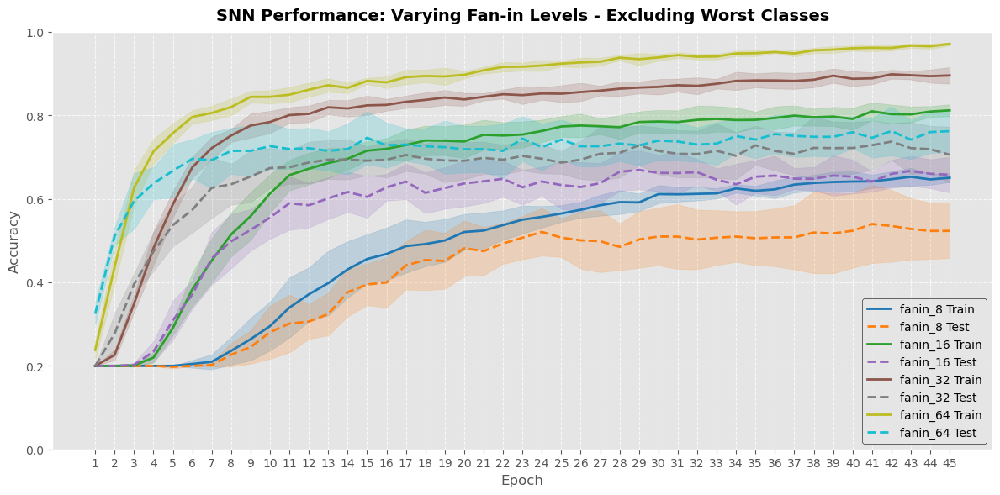

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_64_5_classes_20260203_0916.npz",
    save_path="figures/fanin_convergence_fps_64_5_classes.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_64_5_classes_20260203_0916.npz",
)

Available keys in experiments/fan_in_top_64_5_classes_20260203_0916.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.684507            0.682353                0.650551               0.523268
  fanin_16             0.842857            0.752941                0.811984               0.657778
  fanin_32             0.917143            0.800000                0.895565               0.705621
  fanin_64             0.977143            0.835294                0.971034               0.762092


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_8,0.684507,0.682353,0.650551,0.523268
1,fanin_16,0.842857,0.752941,0.811984,0.657778
2,fanin_32,0.917143,0.800000,0.895565,0.705621
3,fanin_64,0.977143,0.835294,0.971034,0.762092


In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors', 'lotion', 'full_can', 'screw_driver', 'mug', 'stapler']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'stapler']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.3047 | Train Top-1: 30.68% | Val Loss: 2.2841 | Val Top-1: 55.00% | Val Top-3: 71.25% ← BEST
Epoch 2 → Train Loss: 2.2616 | Train Top-1: 57.73% | Val Loss: 2.2845 | Val Top-1: 53.75% | Val Top-3:

{'train_top1_hist': [0.3068181818181818,
  0.5772727272727273,
  0.6636363636363637,
  0.6977272727272728,
  0.7272727272727273,
  0.7727272727272727,
  0.7943181818181818,
  0.8261363636363637,
  0.8227272727272728,
  0.8534090909090909,
  0.8795454545454545,
  0.875,
  0.8954545454545455,
  0.8954545454545455,
  0.9147727272727273,
  0.9295454545454546,
  0.9420454545454545],
 'val_top1_hist': [0.55,
  0.5375,
  0.5375,
  0.525,
  0.5875,
  0.575,
  0.6125,
  0.625,
  0.5875,
  0.5875,
  0.625,
  0.6375,
  0.6,
  0.575,
  0.6375,
  0.6375,
  0.6375],
 'train_topk_hist': [0.6034090909090909,
  0.8420454545454545,
  0.8897727272727273,
  0.9113636363636364,
  0.9375,
  0.9579545454545455,
  0.9693181818181819,
  0.9772727272727273,
  0.9818181818181818,
  0.9920454545454546,
  0.990909090909091,
  0.9920454545454546,
  0.9977272727272727,
  0.9965909090909091,
  0.9977272727272727,
  0.9988636363636364,
  0.9988636363636364],
 'val_topk_hist': [0.7125,
  0.7625,
  0.7875,
  0.7375,
  0

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors', 'lotion', 'full_can', 'screw_driver', 'mug', 'stapler']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'stapler']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.3058 | Train Top-1: 26.93% | Val Loss: 2.2921 | Val Top-1: 58.75% | Val Top-3: 71.25% ← BEST
Epoch 2 → Train Loss: 2.2673 | Train Top-1: 55.11% | Val Loss: 2.2808 | Val Top-1: 51.25% | Val Top-3:

{'train_top1_hist': [0.26931818181818185,
  0.5511363636363636,
  0.6204545454545455,
  0.6602272727272728,
  0.678409090909091,
  0.7193181818181819],
 'val_top1_hist': [0.5875, 0.5125, 0.5875, 0.5375, 0.575, 0.5625],
 'train_topk_hist': [0.5397727272727273,
  0.8068181818181818,
  0.8545454545454545,
  0.8909090909090909,
  0.9136363636363637,
  0.9352272727272727],
 'val_topk_hist': [0.7125, 0.75, 0.8, 0.725, 0.7875, 0.8],
 'final_train_top1': 0.26931818181818185,
 'final_val_top1': 0.5875,
 'final_train_topk': 0.5397727272727273,
 'final_val_topk': 0.7125,
 'best_epoch': 1,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.]

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors', 'lotion', 'full_can']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'safety_glasses', 'scissors']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9464 | Train Top-1: 42.05% | Val Loss: 1.9388 | Val Top-1: 53.57% | Val Top-3: 91.07% ← BEST
Epoch 2 → Train Loss: 1.9081 | Train Top-1: 65.10% | Val Loss: 1.9063 | Val Top-1: 75.00% | Val Top-3: 87.50% ← BEST
Epoch 3 → Train Loss

{'train_top1_hist': [0.42045454545454547,
  0.650974025974026,
  0.7159090909090909,
  0.737012987012987,
  0.7905844155844156,
  0.8116883116883117,
  0.8409090909090909],
 'val_top1_hist': [0.5357142857142857,
  0.75,
  0.6785714285714286,
  0.6964285714285714,
  0.7142857142857143,
  0.7321428571428571,
  0.7142857142857143],
 'train_topk_hist': [0.7451298701298701,
  0.8912337662337663,
  0.926948051948052,
  0.9448051948051948,
  0.9724025974025974,
  0.9772727272727273,
  0.987012987012987],
 'val_topk_hist': [0.9107142857142857,
  0.875,
  0.8928571428571429,
  0.9107142857142857,
  0.8928571428571429,
  0.8571428571428571,
  0.8571428571428571],
 'final_train_top1': 0.650974025974026,
 'final_val_top1': 0.75,
 'final_train_topk': 0.8912337662337663,
 'final_val_topk': 0.875,
 'best_epoch': 2,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                   

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors', 'lotion', 'full_can']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'safety_glasses', 'scissors']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9449 | Train Top-1: 39.61% | Val Loss: 1.9312 | Val Top-1: 57.14% | Val Top-3: 85.71% ← BEST
Epoch 2 → Train Loss: 1.9055 | Train Top-1: 65.26% | Val Loss: 1.9023 | Val Top-1: 67.86% | Val Top-3: 85.71% ← BEST
Epoch 3 → Train Loss

{'train_top1_hist': [0.3961038961038961,
  0.6525974025974026,
  0.7094155844155844,
  0.7353896103896104,
  0.7711038961038961,
  0.7824675324675324,
  0.7840909090909091,
  0.8295454545454546,
  0.8392857142857143,
  0.849025974025974],
 'val_top1_hist': [0.5714285714285714,
  0.6785714285714286,
  0.6964285714285714,
  0.6607142857142857,
  0.7678571428571429,
  0.7321428571428571,
  0.6964285714285714,
  0.7142857142857143,
  0.6964285714285714,
  0.7142857142857143],
 'train_topk_hist': [0.6948051948051948,
  0.8928571428571429,
  0.9172077922077922,
  0.948051948051948,
  0.9561688311688312,
  0.9691558441558441,
  0.9707792207792207,
  0.9821428571428571,
  0.9853896103896104,
  0.9837662337662337],
 'val_topk_hist': [0.8571428571428571,
  0.8571428571428571,
  0.9107142857142857,
  0.875,
  0.8928571428571429,
  0.9107142857142857,
  0.875,
  0.9107142857142857,
  0.9107142857142857,
  0.9464285714285714],
 'final_train_top1': 0.7711038961038961,
 'final_val_top1': 0.7678571428

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'safety_glasses', 'scissors']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6153 | Train Top-1: 50.23% | Val Loss: 1.5948 | Val Top-1: 72.50% | Val Top-3: 92.50% ← BEST
Epoch 2 → Train Loss: 1.5770 | Train Top-1: 73.41% | Val Loss: 1.5934 | Val Top-1: 67.50% | Val Top-3: 92.50%
Epoch 3 → Train Loss: 1.5556 | Train Top-1: 80.00

{'train_top1_hist': [0.5022727272727273,
  0.7340909090909091,
  0.8,
  0.8136363636363636,
  0.8613636363636363,
  0.8704545454545455,
  0.9045454545454545,
  0.9204545454545454,
  0.9318181818181818,
  0.9704545454545455,
  0.9681818181818181,
  0.9795454545454545,
  0.9704545454545455],
 'val_top1_hist': [0.725,
  0.675,
  0.8,
  0.65,
  0.775,
  0.75,
  0.75,
  0.825,
  0.775,
  0.7,
  0.825,
  0.725,
  0.825],
 'train_topk_hist': [0.8227272727272728,
  0.9522727272727273,
  0.9772727272727273,
  0.9840909090909091,
  0.990909090909091,
  0.990909090909091,
  0.9931818181818182,
  0.9977272727272727,
  0.9977272727272727,
  1.0,
  1.0,
  0.9977272727272727,
  1.0],
 'val_topk_hist': [0.925,
  0.925,
  0.95,
  0.95,
  0.925,
  0.95,
  0.95,
  0.95,
  0.95,
  0.975,
  0.95,
  0.95,
  0.975],
 'final_train_top1': 0.9204545454545454,
 'final_val_top1': 0.825,
 'final_train_topk': 0.9977272727272727,
 'final_val_topk': 0.95,
 'best_epoch': 8,
 'topk': 3,
 'model_state_dict': OrderedDict

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'ball', 'safety_glasses', 'bracket', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'safety_glasses', 'scissors']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6163 | Train Top-1: 44.32% | Val Loss: 1.5972 | Val Top-1: 77.50% | Val Top-3: 87.50% ← BEST
Epoch 2 → Train Loss: 1.5787 | Train Top-1: 73.18% | Val Loss: 1.5771 | Val Top-1: 70.00% | Val Top-3: 85.00%
Epoch 3 → Train Loss: 1.5568 | Train Top-1: 81.59

{'train_top1_hist': [0.4431818181818182,
  0.7318181818181818,
  0.8159090909090909,
  0.8090909090909091,
  0.8340909090909091,
  0.8454545454545455,
  0.875,
  0.884090909090909,
  0.9068181818181819,
  0.925],
 'val_top1_hist': [0.775,
  0.7,
  0.75,
  0.75,
  0.825,
  0.725,
  0.725,
  0.775,
  0.8,
  0.7],
 'train_topk_hist': [0.8022727272727272,
  0.95,
  0.975,
  0.9818181818181818,
  0.9840909090909091,
  0.9886363636363636,
  0.990909090909091,
  0.9931818181818182,
  0.9931818181818182,
  0.9954545454545455],
 'val_topk_hist': [0.875,
  0.85,
  0.95,
  0.95,
  0.925,
  0.975,
  0.925,
  0.9,
  0.9,
  0.95],
 'final_train_top1': 0.8340909090909091,
 'final_val_top1': 0.825,
 'final_train_topk': 0.9840909090909091,
 'final_val_topk': 0.925,
 'best_epoch': 5,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['empty_hand', 'ball', 'safety_glasses']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'safety_glasses']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1080, Avg Train Accuracy: 64.39%
Epoch 1 - Avg Val Loss: 1.1216, Avg Val Accuracy: 58.33%
Epoch 2 - Avg Train Loss: 1.0759, Avg Train Accuracy: 84.09%
Epoch 2 - Avg Val Loss: 1.0920, Avg Val Accuracy: 83.33%
Epoch 3 - Avg Train Loss: 1.0544, Avg Train Accuracy: 89.02%
Ep

{'train_loss_hist': [1.1079709839188692,
  1.0758672295646234,
  1.0543998698845054,
  1.0377142357103752,
  1.0205993781035596,
  1.009166447502194,
  0.9978187075166991,
  0.9891827573830431,
  0.9812148567853551],
 'train_acc_hist': [0.6439393939393939,
  0.8409090909090909,
  0.8901515151515151,
  0.9356060606060606,
  0.9431818181818182,
  0.946969696969697,
  0.9583333333333334,
  0.9734848484848485,
  0.9734848484848485],
 'val_loss_hist': [1.121559848388036,
  1.09197536110878,
  1.0841346010565758,
  1.076036013662815,
  1.068841944138209,
  1.0612297902504604,
  1.0509518906474113,
  1.048991563419501,
  1.0435651664932568],
 'val_acc_hist': [0.5833333333333334,
  0.8333333333333334,
  0.8333333333333334,
  0.875,
  0.7916666666666666,
  0.8333333333333334,
  0.875,
  0.875,
  0.8333333333333334],
 'best_epoch': 4,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
      

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 64, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'ball', 'safety_glasses']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'empty_hand', 'safety_glasses']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1114, Avg Train Accuracy: 57.95%
Epoch 1 - Avg Val Loss: 1.1029, Avg Val Accuracy: 79.17%
Epoch 2 - Avg Train Loss: 1.0794, Avg Train Accuracy: 85.23%
Epoch 2 - Avg Val Loss: 1.0858, Avg Val Accuracy: 79.17%
Epoch 3 - Avg Train Loss: 1.0568, Avg Train Accuracy: 86.74%
Ep

{'train_loss_hist': [1.1113707696398099,
  1.0793863485256832,
  1.0568200117259314,
  1.04123507869063,
  1.028518178246238,
  1.0177325208981831,
  1.00718753175302,
  1.0003581889199489],
 'train_acc_hist': [0.5795454545454546,
  0.8522727272727273,
  0.8674242424242424,
  0.9015151515151515,
  0.928030303030303,
  0.9166666666666666,
  0.9204545454545454,
  0.9393939393939394],
 'val_loss_hist': [1.1029298802216847,
  1.0857610801855724,
  1.077114390830199,
  1.0642545471588771,
  1.056455450753371,
  1.0499225705862045,
  1.0487828627228737,
  1.0427607372403145],
 'val_acc_hist': [0.7916666666666666,
  0.7916666666666666,
  0.8333333333333334,
  0.75,
  0.8333333333333334,
  0.8333333333333334,
  0.75,
  0.8333333333333334],
 'best_epoch': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,


### 32 Pixels

In [ ]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 4: CV Train 

In [ ]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=40,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_16_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl",
    fanin_values=[32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'bracket']
)

Loaded data from preprocessed_data/spike_data_method_fps_n_16_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 16, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['bracket', 'empty_hand']
→ New number of classes: 2
Fold 1: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 2: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 3: CV Train samples = 140, CV Test samples = 36
  - CV Train class distribution: [70 70]
  - CV Test class distribution: [18 18]
Fold 4: CV Train samples = 142, CV Test samples = 34
  - CV Train class distribution: [71 71]
  - CV Test class distribution: [17 17]
Fold 5: CV Train samples = 142, CV Test samples = 34
  - CV Train class distribution: [71

Available keys in experiments/fan_in_top_16_2_classes_20260304_1106.npz: ['fanin_32', 'fanin_64']


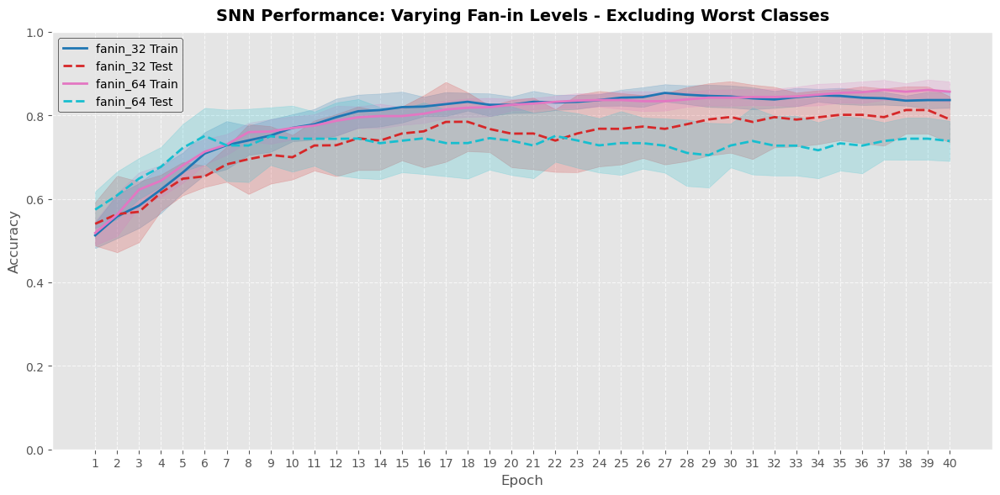

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_16_2_classes_20260304_1106.npz",
    save_path="figures/fanin_convergence_fps_32.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_16_2_classes_20260304_1106.npz",
)

Available keys in experiments/fan_in_top_16_2_classes_20260304_1106.npz: ['fanin_32', 'fanin_64']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_32             0.880282            0.916667                0.836579               0.790523
  fanin_64             0.900000            0.888889                0.856660               0.738562


,Model/Loss,Best Train Accuracy,Best Test Accuracy,Average Train Accuracy,Average Test Accuracy
0,fanin_32,0.880282,0.916667,0.836579,0.790523
1,fanin_64,0.900000,0.888889,0.856660,0.738562


In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug', 'screw_driver', 'ball', 'spray_can', 'full_can', 'stapler']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'scissors', 'screw_driver', 'spray_can', 'stapler']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.3132 | Train Top-1: 24.32% | Val Loss: 2.3016 | Val Top-1: 35.00% | Val Top-3: 60.00% ← BEST
Epoch 2 → Train Loss: 2.2887 | Train Top-1: 43.41% | Val Loss: 2.2992 | Val Top-1: 47.50% | Val Top-3: 68.7

{'train_top1_hist': [0.2431818181818182,
  0.4340909090909091,
  0.47954545454545455,
  0.5113636363636364,
  0.5329545454545455,
  0.5761363636363637,
  0.6022727272727273],
 'val_top1_hist': [0.35, 0.475, 0.4125, 0.45, 0.425, 0.3875, 0.45],
 'train_topk_hist': [0.49204545454545456,
  0.7193181818181819,
  0.7659090909090909,
  0.7931818181818182,
  0.821590909090909,
  0.8568181818181818,
  0.8681818181818182],
 'val_topk_hist': [0.6, 0.6875, 0.7125, 0.7, 0.7125, 0.6875, 0.675],
 'final_train_top1': 0.4340909090909091,
 'final_val_top1': 0.475,
 'final_train_topk': 0.7193181818181819,
 'final_val_topk': 0.6875,
 'best_epoch': 2,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug', 'screw_driver', 'ball', 'spray_can', 'full_can', 'stapler']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'scissors', 'screw_driver', 'spray_can', 'stapler']
→ New number of classes: 10
Epoch 1 → Train Loss: 2.3129 | Train Top-1: 22.73% | Val Loss: 2.3040 | Val Top-1: 31.25% | Val Top-3: 63.75% ← BEST
Epoch 2 → Train Loss: 2.2930 | Train Top-1: 39.43% | Val Loss: 2.3052 | Val Top-1: 40.00% | Val Top-3: 61.2

{'train_top1_hist': [0.22727272727272727,
  0.39431818181818185,
  0.4738636363636364,
  0.5045454545454545,
  0.5147727272727273,
  0.5636363636363636,
  0.5556818181818182,
  0.571590909090909,
  0.5943181818181819,
  0.6056818181818182,
  0.6170454545454546,
  0.6090909090909091],
 'val_top1_hist': [0.3125,
  0.4,
  0.3875,
  0.45,
  0.4125,
  0.4375,
  0.5125,
  0.4125,
  0.475,
  0.4375,
  0.425,
  0.4625],
 'train_topk_hist': [0.48295454545454547,
  0.6829545454545455,
  0.759090909090909,
  0.7818181818181819,
  0.7909090909090909,
  0.821590909090909,
  0.8386363636363636,
  0.8477272727272728,
  0.8511363636363637,
  0.865909090909091,
  0.8738636363636364,
  0.8738636363636364],
 'val_topk_hist': [0.6375,
  0.6125,
  0.675,
  0.65,
  0.675,
  0.675,
  0.6875,
  0.7375,
  0.6875,
  0.7375,
  0.6875,
  0.675],
 'final_train_top1': 0.5556818181818182,
 'final_val_top1': 0.5125,
 'final_train_topk': 0.8386363636363636,
 'final_val_topk': 0.6875,
 'best_epoch': 7,
 'topk': 3,
 'mo

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug', 'screw_driver', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'lotion', 'mug', 'scissors', 'screw_driver']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9587 | Train Top-1: 30.52% | Val Loss: 1.9607 | Val Top-1: 35.71% | Val Top-3: 67.86% ← BEST
Epoch 2 → Train Loss: 1.9355 | Train Top-1: 51.62% | Val Loss: 1.9626 | Val Top-1: 41.07% | Val Top-3: 67.86% ← BEST
Epoch 3 → Train Loss: 1.924

{'train_top1_hist': [0.3051948051948052,
  0.5162337662337663,
  0.5616883116883117,
  0.6006493506493507,
  0.6266233766233766,
  0.6672077922077922,
  0.6607142857142857,
  0.7045454545454546,
  0.7207792207792207,
  0.7077922077922078,
  0.7288961038961039,
  0.7467532467532467],
 'val_top1_hist': [0.35714285714285715,
  0.4107142857142857,
  0.375,
  0.4107142857142857,
  0.4642857142857143,
  0.5178571428571429,
  0.5357142857142857,
  0.5178571428571429,
  0.4642857142857143,
  0.5,
  0.5,
  0.48214285714285715],
 'train_topk_hist': [0.6314935064935064,
  0.8035714285714286,
  0.8457792207792207,
  0.8766233766233766,
  0.8977272727272727,
  0.9107142857142857,
  0.9204545454545454,
  0.9318181818181818,
  0.922077922077922,
  0.9237012987012987,
  0.9366883116883117,
  0.9431818181818182],
 'val_topk_hist': [0.6785714285714286,
  0.6785714285714286,
  0.7142857142857143,
  0.7321428571428571,
  0.7321428571428571,
  0.7142857142857143,
  0.6964285714285714,
  0.7678571428571429,

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug', 'screw_driver', 'ball']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'bracket', 'empty_hand', 'lotion', 'mug', 'scissors', 'screw_driver']
→ New number of classes: 7
Epoch 1 → Train Loss: 1.9552 | Train Top-1: 30.36% | Val Loss: 1.9516 | Val Top-1: 44.64% | Val Top-3: 66.07% ← BEST
Epoch 2 → Train Loss: 1.9361 | Train Top-1: 49.84% | Val Loss: 1.9590 | Val Top-1: 48.21% | Val Top-3: 64.29% ← BEST
Epoch 3 → Train Loss: 1.926

{'train_top1_hist': [0.30357142857142855,
  0.49837662337662336,
  0.5438311688311688,
  0.5876623376623377,
  0.5957792207792207,
  0.599025974025974,
  0.6217532467532467,
  0.672077922077922,
  0.6753246753246753,
  0.6818181818181818,
  0.6964285714285714,
  0.7142857142857143,
  0.7094155844155844,
  0.7094155844155844,
  0.7305194805194806,
  0.7288961038961039],
 'val_top1_hist': [0.44642857142857145,
  0.48214285714285715,
  0.44642857142857145,
  0.42857142857142855,
  0.39285714285714285,
  0.5,
  0.48214285714285715,
  0.5,
  0.42857142857142855,
  0.4642857142857143,
  0.5357142857142857,
  0.48214285714285715,
  0.48214285714285715,
  0.4642857142857143,
  0.5178571428571429,
  0.5],
 'train_topk_hist': [0.6542207792207793,
  0.8051948051948052,
  0.8392857142857143,
  0.8636363636363636,
  0.8814935064935064,
  0.8831168831168831,
  0.8993506493506493,
  0.9042207792207793,
  0.9237012987012987,
  0.922077922077922,
  0.9204545454545454,
  0.926948051948052,
  0.930194805

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['bracket', 'empty_hand', 'lotion', 'mug', 'scissors']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6234 | Train Top-1: 40.45% | Val Loss: 1.6073 | Val Top-1: 60.00% | Val Top-3: 85.00% ← BEST
Epoch 2 → Train Loss: 1.5963 | Train Top-1: 60.23% | Val Loss: 1.5995 | Val Top-1: 57.50% | Val Top-3: 85.00%
Epoch 3 → Train Loss: 1.5845 | Train Top-1: 65.45% | Val L

{'train_top1_hist': [0.40454545454545454,
  0.6022727272727273,
  0.6545454545454545,
  0.7090909090909091,
  0.7068181818181818,
  0.7227272727272728,
  0.740909090909091,
  0.7568181818181818],
 'val_top1_hist': [0.6, 0.575, 0.625, 0.525, 0.55, 0.55, 0.55, 0.475],
 'train_topk_hist': [0.7681818181818182,
  0.884090909090909,
  0.9227272727272727,
  0.9318181818181818,
  0.9522727272727273,
  0.95,
  0.9659090909090909,
  0.9681818181818181],
 'val_topk_hist': [0.85, 0.85, 0.85, 0.85, 0.875, 0.9, 0.975, 0.9],
 'final_train_top1': 0.6545454545454545,
 'final_val_top1': 0.625,
 'final_train_topk': 0.9227272727272727,
 'final_val_topk': 0.85,
 'best_epoch': 3,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1.

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    topk_accuracy=3,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'bracket', 'scissors', 'lotion', 'mug']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['bracket', 'empty_hand', 'lotion', 'mug', 'scissors']
→ New number of classes: 5
Epoch 1 → Train Loss: 1.6251 | Train Top-1: 37.27% | Val Loss: 1.6200 | Val Top-1: 55.00% | Val Top-3: 75.00% ← BEST
Epoch 2 → Train Loss: 1.5997 | Train Top-1: 59.09% | Val Loss: 1.6208 | Val Top-1: 55.00% | Val Top-3: 77.50%
Epoch 3 → Train Loss: 1.5883 | Train Top-1: 62.95% | Val L

{'train_top1_hist': [0.37272727272727274,
  0.5909090909090909,
  0.6295454545454545,
  0.6659090909090909,
  0.6818181818181818,
  0.7022727272727273,
  0.7136363636363636,
  0.7022727272727273],
 'val_top1_hist': [0.55, 0.55, 0.6, 0.525, 0.575, 0.525, 0.525, 0.6],
 'train_topk_hist': [0.7659090909090909,
  0.8636363636363636,
  0.9136363636363637,
  0.9159090909090909,
  0.9454545454545454,
  0.95,
  0.9545454545454546,
  0.9454545454545454],
 'val_topk_hist': [0.75, 0.775, 0.775, 0.775, 0.8, 0.875, 0.9, 0.875],
 'final_train_top1': 0.6295454545454545,
 'final_val_top1': 0.6,
 'final_train_topk': 0.9136363636363637,
 'final_val_topk': 0.775,
 'best_epoch': 3,
 'topk': 3,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['empty_hand', 'bracket', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['bracket', 'empty_hand', 'scissors']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1164, Avg Train Accuracy: 56.44%
Epoch 1 - Avg Val Loss: 1.0970, Avg Val Accuracy: 75.00%
Epoch 2 - Avg Train Loss: 1.0844, Avg Train Accuracy: 78.03%
Epoch 2 - Avg Val Loss: 1.0923, Avg Val Accuracy: 87.50%
Epoch 3 - Avg Train Loss: 1.0744, Avg Train Accuracy: 82.58%
Epoch

{'train_loss_hist': [1.1164181449196555,
  1.0844023792129573,
  1.0743551703565049,
  1.0652897960760377,
  1.0592193698341197,
  1.0474225716157393,
  1.0413424431374578],
 'train_acc_hist': [0.5643939393939394,
  0.7803030303030303,
  0.8257575757575758,
  0.8409090909090909,
  0.8371212121212122,
  0.8560606060606061,
  0.8787878787878788],
 'val_loss_hist': [1.0969757636388142,
  1.092273289958636,
  1.0934226214885712,
  1.0785465861360233,
  1.0786624029278755,
  1.0748207146922748,
  1.072493275006612],
 'val_acc_hist': [0.75,
  0.875,
  0.8333333333333334,
  0.75,
  0.8333333333333334,
  0.8333333333333334,
  0.7916666666666666],
 'best_epoch': 2,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ...

In [ ]:
run_validation(
    device=device,
    fixed_params={"method": "fps", "n": 32, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"},
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    fixed_fan_in=64,
    include_classes=['empty_hand', 'bracket', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1.pkl with params: {'method': 'fps', 'n': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['bracket', 'empty_hand', 'scissors']
→ New number of classes: 3
Epoch 1 - Avg Train Loss: 1.1195, Avg Train Accuracy: 50.76%
Epoch 1 - Avg Val Loss: 1.1104, Avg Val Accuracy: 70.83%
Epoch 2 - Avg Train Loss: 1.0902, Avg Train Accuracy: 71.97%
Epoch 2 - Avg Val Loss: 1.0993, Avg Val Accuracy: 83.33%
Epoch 3 - Avg Train Loss: 1.0771, Avg Train Accuracy: 81.82%
Epoch

{'train_loss_hist': [1.1195481424078797,
  1.090163839134303,
  1.077128874307329,
  1.0660993050445209,
  1.0586362228249058,
  1.0515161447904326,
  1.0449852295445674],
 'train_acc_hist': [0.5075757575757576,
  0.7196969696969697,
  0.8181818181818182,
  0.8409090909090909,
  0.8409090909090909,
  0.8674242424242424,
  0.8787878787878788],
 'val_loss_hist': [1.1103701988855998,
  1.0993092358112335,
  1.1037687063217163,
  1.0867495487133663,
  1.084427294631799,
  1.0826088065902393,
  1.0768671135107677],
 'val_acc_hist': [0.7083333333333334,
  0.8333333333333334,
  0.8333333333333334,
  0.8333333333333334,
  0.8333333333333334,
  0.75,
  0.75],
 'best_epoch': 2,
 'model_state_dict': OrderedDict([('fc1_mask',
               tensor([[1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       ...,
                       [1., 1., 1.,  ..., 1., 1., 1.],
                       [1., 

## Wang et al comparison

In [ ]:
fixed_params = {"method": "fps", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1, 2, 3, 4], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[256],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5,
    test="all-data",
    topk_accuracy=3,
    include_classes=['empty_hand', 'spray_can', 'lotion', 'scissors', 'coin', 'mug', 'ball', 'battery', 'screw_driver', 'bracket']
)


######################################################################
Running experiment for n = 256 from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Using all 17 classes
Fold 1: CV Train samples = 2720, CV Test samples = 680
  - CV Train class distribution: [160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160]
  - CV Test class distribution: [40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40]
Fold 2: CV Train samples = 2720, CV Test samples = 680
  - CV Train class distribution: [160 1

In [7]:
analyze_topk_experiment_results(
    file_path="experiments/param_n_20260306_1030.npz",
)

Available keys in experiments/param_n_20260306_1030.npz: ['256']

Top-k Experiment Results Table (validation, last epoch, average across folds):
Model/Loss Average Validation Top-1 Accuracy [%] (mean ± std) Average Validation Top-3 Accuracy [%] (mean ± std)
       256                                       93.20 ± 1.21                                       99.00 ± 0.45


,Model/Loss,Average Validation Top-1 Accuracy [%] (mean ± std),Average Validation Top-3 Accuracy [%] (mean ± std)
0,256,93.20 ± 1.21,99.00 ± 0.45


In [ ]:
results = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=40,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl",
    fanin_values=[64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'spray_can', 'ball', 'safety_glasses'],
    topk_accuracy=3,
    test="all-data"
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'empty_hand', 'safety_glasses', 'spray_can']
→ New number of classes: 4
Fold 1: CV Train samples = 640, CV Test samples = 160
  - CV Train class distribution: [160 160 160 160]
  - CV Test class distribution: [40 40 40 40]
Fold 2: CV Train samples = 640, CV Test samples = 160
  - CV Train class distribution: [160 160 160 160]
  - CV Test class distribution: [40 40 40 40]
Fold 3: CV Train samples = 640, CV Test samples = 160
  - CV Train class distribution: [160 160 160 160]
  - CV Test class distribution: [40 40 40 40]
Fold 4: CV Train samples = 640, CV Test samples = 160
  - CV Train class distribution: [160 160 160 160]
  - CV Test class dist

In [6]:
analyze_topk_experiment_results(
    file_path="experiments/fan_in_top_256_4_classes_20260306_1046.npz",
)

Available keys in experiments/fan_in_top_256_4_classes_20260306_1046.npz: ['fanin_64']

Top-k Experiment Results Table (validation, last epoch, average across folds):
Model/Loss Average Validation Top-1 Accuracy [%] (mean ± std) Average Validation Top-3 Accuracy [%] (mean ± std)
  fanin_64                                       87.25 ± 1.29                                       98.88 ± 0.73


,Model/Loss,Average Validation Top-1 Accuracy [%] (mean ± std),Average Validation Top-3 Accuracy [%] (mean ± std)
0,fanin_64,87.25 ± 1.29,98.88 ± 0.73


## Intra session

['empty_hand', 'spray_can', 'lotion', 'scissors', 'coin', 'mug', 'ball', 'battery', 'screw_driver', 'bracket', 'empty_can', 'safety_glasses', 'gel', 'pen', 'stapler', 'full_can', 'tape']


In [8]:
fixed_params = {"method": "fps", "num_frames": 25, "threshold": 0.01, "session_id": [0, 1, 2, 3, 4], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="n",
    varying_values=[256],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5,
    include_classes=['empty_hand', 'spray_can', 'lotion', 'scissors', 'coin', 'mug', 'ball', 'battery', 'screw_driver', 'bracket'],
    test="inter-session",
    topk_accuracy=3,
)


######################################################################
Running experiment for n = 256 from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping only classes: ['ball', 'battery', 'bracket', 'coin', 'empty_hand', 'lotion', 'mug', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Fold 1: Train samples = 1760, Val samples = 440
  - Train class distribution: [176 176 176 176 176 176 176 176 176 176]
  - Val class distribution: [44 44 44 44 44 44 44 44 44 44]
Fold 2: Train sam

In [9]:
analyze_topk_experiment_results(
    file_path="experiments/param_n_20260316_1337.npz",
)

Available keys in experiments/param_n_20260316_1337.npz: ['256']

Top-k Experiment Results Table (validation, last epoch, average across folds):
Model/Loss Average Validation Top-1 Accuracy [%] (mean ± std) Average Validation Top-3 Accuracy [%] (mean ± std)
       256                                       46.86 ± 9.45                                       75.23 ± 7.23


,Model/Loss,Average Validation Top-1 Accuracy [%] (mean ± std),Average Validation Top-3 Accuracy [%] (mean ± std)
0,256,46.86 ± 9.45,75.23 ± 7.23


In [7]:
results = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=40,
    batch_size=16,
    verbose=True,
    input_file="spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl",
    fanin_values=[64],
    alpha=0.5,
    beta=0.9,
    include_classes=['empty_hand', 'spray_can', 'lotion', 'scissors', 'coin', 'mug', 'ball', 'battery', 'screw_driver', 'bracket'],
    topk_accuracy=3,
    test="inter-session"
)

Loaded data from preprocessed_data/spike_data_method_fps_n_256_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_session_id_0_1_2_3_4.pkl with params: {'method': 'fps', 'n': 256, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike'}
Keeping classes: ['ball', 'battery', 'bracket', 'coin', 'empty_hand', 'lotion', 'mug', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Fold 1: Train samples = 1760, Val samples = 440
  - Train class distribution: [176 176 176 176 176 176 176 176 176 176]
  - Val class distribution: [44 44 44 44 44 44 44 44 44 44]
Fold 2: Train samples = 1760, Val samples = 440
  - Train class distribution: [176 176 176 176 176 176 176 176 176 176]
  - Val class distribution: [44 44 44 44 44 44 44 44 44 44]
Fold 3: Train samples = 1760, Val samples = 440
  - Train class distribution: [176 176 176 176 176 176 176 176 176 176]
  - Val class distribution: [44 44 44 44 4

In [6]:
analyze_topk_experiment_results(
    file_path="experiments/fan_in_top_256_8_classes_20260316_1221.npz",
)

Available keys in experiments/fan_in_top_256_8_classes_20260316_1221.npz: ['fanin_64']

Top-k Experiment Results Table (validation, last epoch, average across folds):
Model/Loss Average Validation Top-1 Accuracy [%] (mean ± std) Average Validation Top-3 Accuracy [%] (mean ± std)
  fanin_64                                       47.67 ± 8.71                                       77.33 ± 5.30


,Model/Loss,Average Validation Top-1 Accuracy [%] (mean ± std),Average Validation Top-3 Accuracy [%] (mean ± std)
0,fanin_64,47.67 ± 8.71,77.33 ± 5.30
